In [101]:
import sys
import calnet.calnet as cc
import calnet.dynamics as dyn
import numpy as np
from importlib import reload
import pdb
import matplotlib.pyplot as plt
import glob
import calnet.utils as utils
import pyute as ut
import size_contrast_analysis as sca
import scipy.stats as sst
import sim_utils
import size_contrast_opto_figures as scof
import size_contrast_figures as scf
reload(cc)
reload(utils)

<module 'calnet.utils' from '/Users/dan/Documents/code/adesnal/calnet/utils.py'>

In [3]:
print('ok')

ok


In [4]:
# npyfile = np.load('../shared_data/calnet_data/dynamics/pc_small_opto_tavg_201203g.npy',allow_pickle=True)[()]
npyfile = np.load('../shared_data/calnet_data/dynamics/connection_deletion_opto_tavg_201215b.npy',allow_pickle=True)[()]
# npyfile = np.load('../shared_data/calnet_data/dynamics/vip_halo_l4_opto_tavg_connection_deletion_201215b.npy',allow_pickle=True)[()]
# npyfile = np.load('../shared_data/calnet_data/dynamics/vip_chrimson_l4_opto_tavg_connection_deletion_201215b.npy',allow_pickle=True)[()]
# npyfile = np.load('../shared_data/calnet_data/dynamics/l4_opto_tavg_vip_silencing_201203g.npy',allow_pickle=True)[()]
npyfile_halo = np.load('../shared_data/calnet_data/dynamics/vip_halo_l4_opto_tavg_connection_deletion_201215b.npy',allow_pickle=True)[()]
npyfile_chrimson = np.load('../shared_data/calnet_data/dynamics/vip_chrimson_l4_opto_tavg_connection_deletion_201215b.npy',allow_pickle=True)[()]

In [5]:
# npyfile = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_small_210513c.npy',allow_pickle=True)[()]
# npyfile_halo = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_small_210513c.npy',allow_pickle=True)[()]
# npyfile_chrimson = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_small_210513c.npy',allow_pickle=True)[()]
# npyfile_coupled0 = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_l4_coupled_0_25_210513c_baseline.npy')
# npyfile_coupled = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_l4_coupled_210513c.npy',allow_pickle=True)[()]
npyfile = np.load('../shared_data/calnet_data/dynamics/vip_both_pixels_opto_tavg_210513c.npy',allow_pickle=True)[()]
npyfile_halo = np.load('../shared_data/calnet_data/dynamics/vip_halo_l4_opto_tavg_connection_deletion_210513c.npy',allow_pickle=True)[()]
npyfile_chrimson = np.load('../shared_data/calnet_data/dynamics/vip_chrimson_l4_opto_tavg_connection_deletion_210513c.npy',allow_pickle=True)[()]

wtfile = '210513c'


In [6]:
npyfile.keys()

dict_keys(['YY_opto', 'YY_opto_no_pcpc', 'YY_opto_no_pcpv', 'YY_opto_tavg_no_pcvip', 'YY_opto_tavg_no_pcsst', 'YY_opto_tavg_no_vipbias', 'YY_opto_tavg_no_sstvip'])

In [7]:
# note: these simulations keep resEta, resXi fixed. Not Eta, Xi!
YY_opto = npyfile['YY_opto'][:,:,:,np.newaxis,:]
YY_opto_no_pcpc = npyfile['YY_opto_no_pcpc'][:,:,:,np.newaxis,:]
YY_opto_no_pcpv = npyfile['YY_opto_no_pcpv'][:,:,:,np.newaxis,:]
YY_opto_no_pcvip = npyfile['YY_opto_tavg_no_pcvip'][:,:,:,np.newaxis,:]
YY_opto_no_pcsst = npyfile['YY_opto_tavg_no_pcsst'][:,:,:,np.newaxis,:]
YY_opto_no_vipbias = npyfile['YY_opto_tavg_no_vipbias'][:,:,:,np.newaxis,:]

In [8]:
# weights_files = glob.glob('../shared_data/calnet_data/weights/weights_201203g/*.npy')
weights_files = glob.glob('../shared_data/calnet_data/weights/weights_201215b/*.npy')
weights_files = glob.glob('../shared_data/calnet_data/weights/weights_210513c/*.npy')
weights_files.sort()

reload(cc)
nwt = len(weights_files)
mdls = [None for iwt in range(nwt)]
losses = np.zeros((nwt,))
for iwt in range(nwt):
#     wtfile = 'weights_'+good_fits[iwt]+'.npy'
#     wtdict = np.load(wtbase+wtfile,allow_pickle=True)[()]
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    mdls[iwt] = cc.ModelOri(wtdict,nT=1)
    losses[iwt] = mdls[iwt].loss
    
mdls_no_pcpv = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    wtdict['Wmy'][[0,0,3,3],[0,3,0,3]] = 0
    mdls_no_pcpv[iwt] = cc.ModelOri(wtdict,nT=1)
    
mdls_no_pcpc = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    wtdict['Wmy'][0,0] = 0
    mdls_no_pcpc[iwt] = cc.ModelOri(wtdict,nT=1)
    
mdls_no_pcvip = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    wtdict['Wmy'][0,2] = 0
    wtdict['Wmx'][0,2] = 0
    mdls_no_pcvip[iwt] = cc.ModelOri(wtdict,nT=1)
    
mdls_no_pcsst = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    wtdict['Wmy'][0,1] = 0
    wtdict['Wmx'][0,1] = 0
    mdls_no_pcsst[iwt] = cc.ModelOri(wtdict,nT=1)
        
mdls_no_vipbias = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    wtdict['Wmx'][1,2] = 0
    mdls_no_vipbias[iwt] = cc.ModelOri(wtdict,nT=1)
    
low_loss = (losses<np.nanpercentile(losses,10))

mdls = [mdl for (mdl,ll) in zip(mdls,low_loss) if ll]
mdls_no_pcpv = [mdl for (mdl,ll) in zip(mdls_no_pcpv,low_loss) if ll]
mdls_no_pcpc = [mdl for (mdl,ll) in zip(mdls_no_pcpc,low_loss) if ll]
mdls_no_pcvip = [mdl for (mdl,ll) in zip(mdls_no_pcvip,low_loss) if ll]
mdls_no_pcsst = [mdl for (mdl,ll) in zip(mdls_no_pcsst,low_loss) if ll]
mdls_no_vipbias = [mdl for (mdl,ll) in zip(mdls_no_vipbias,low_loss) if ll]

In [9]:
iwt = 0
nQ,nS,nT = mdls[iwt].nQ,mdls[iwt].nS,mdls[iwt].nT
bltiles = np.zeros((nwt,nQ*nS*nT))
amps = np.ones((nwt,nQ*nS*nT))
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    if 'bl' in wtdict:
        bl = wtdict['bl']
        bltiles[iwt] = np.tile(bl,nS*nT)
    if 'amp' in wtdict:
        amp = wtdict['amp']
        amps[iwt] = amp

In [10]:
losses.shape

(950,)

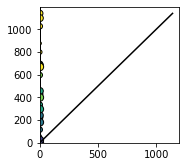

In [11]:
plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast_errorbar(YY_opto[:,0,:,0,0],YY_opto_no_pcsst[:,0,:,0,0],nsize=6,ncontrast=6)
ut.zero_origin('xy')

In [12]:
opto_levels = 1*np.linspace(0,1,21)
# opto_levels = 1*np.linspace(-0.3,0.3,31)
# opto_levels = 1*np.linspace(-1.5,1.5,31)

network_resps = [None for idir in range(3)]
for idir,npyfile in enumerate([npyfile,npyfile_halo,npyfile_chrimson]):
# for idir,npyfile in enumerate([npyfile_coupled,npyfile_coupled,npyfile_coupled]):
    
#     YY_opto = npyfile['YY_opto'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcpc = npyfile['YY_opto_no_pcpc'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcpv = npyfile['YY_opto_no_pcpv'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcvip = npyfile['YY_opto_tavg_no_pcvip'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcsst = npyfile['YY_opto_tavg_no_pcsst'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_vipbias = npyfile['YY_opto_tavg_no_vipbias'][low_loss,:,:,np.newaxis,:]
    YY_opto = npyfile['YY_opto'][:,:,:,np.newaxis,:]
#     YY_opto = npyfile_coupled0[:,5:-5,:,np.newaxis,:]
    YY_opto_no_pcpc = npyfile['YY_opto_no_pcpc'][:,:,:,np.newaxis,:]
    YY_opto_no_pcpv = npyfile['YY_opto_no_pcpv'][:,:,:,np.newaxis,:]
    YY_opto_no_pcvip = npyfile['YY_opto_tavg_no_pcvip'][:,:,:,np.newaxis,:]
    YY_opto_no_pcsst = npyfile['YY_opto_tavg_no_pcsst'][:,:,:,np.newaxis,:]
    YY_opto_no_vipbias = npyfile['YY_opto_tavg_no_vipbias'][:,:,:,np.newaxis,:]

    these_losses = losses[low_loss]
    
    nwt = len(mdls)
    iwt = 0
    itype = 0

    nN = mdls[iwt].nN
    ntypes = mdls[iwt].nQ*mdls[iwt].nS*mdls[iwt].nT
    this_mdl,this_YY = mdls_no_pcpc.copy(),YY_opto_no_pcpc.copy()
    # this_mdl,this_YY = mdls_no_pcpv.copy(),YY_opto_no_pcpv.copy()
    # this_mdl,this_YY = mdls.copy(),YY_opto.copy()
    YYs = [YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias]
    if idir>0:
        network_resps[idir] = [np.zeros((nwt,opto_levels.shape[0],nN,ntypes)) for YY in YYs]
    else:
        network_resps[idir] = [np.zeros((nwt,31,nN,ntypes)) for YY in YYs]
    mdlses = [mdls,mdls_no_pcpc,mdls_no_pcpv,mdls_no_pcvip,mdls_no_pcsst,mdls_no_vipbias]
#     mdlses = [[m for m,l in zip(mm,low_loss) if l] for mm in mdlses]
#     network_resp = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
#     network_resp_no_pcpc = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
#     network_resp_no_pcpv = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
#     network_resp_no_pcvip = np.zeros((nwt,3,nN,ntypes))
#     cell_intrinsic_resp = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
    for network_resp,YY in zip(network_resps[idir],YYs):
        for iwt in range(nwt):
            network_resp[iwt] = np.nanmean(YY[iwt],2)#[:opto_levels.shape[0]]
#     for iwt in range(nwt):
#         network_resp[iwt] = np.nanmean(YY_opto[iwt],2) # time avg
#         network_resp_no_pcpc[iwt] = np.nanmean(YY_opto_no_pcpc[iwt],2)
#         network_resp_no_pcpv[iwt] = np.nanmean(YY_opto_no_pcpv[iwt],2)
#         network_resp_no_pcvip[iwt] = np.nanmean(YY_opto_no_pcvip[iwt],2)

#         for ilevel in range(opto_levels.shape[0]):
#             cell_intrinsic_resp[iwt,ilevel] = this_mdl[iwt].compute_f_(opto_levels[ilevel]+this_mdl[iwt].Eta,this_mdl[iwt].Xi,this_mdl[iwt].s02)
            

In [13]:
idir = 2
iconn = 0
nr = network_resps[idir][iconn]
nr.shape

(94, 21, 36, 8)

In [104]:
idir = 2
iconn = 0
nr = network_resps[idir][iconn]

import naka_rushton_analysis as nra
reload(nra)
x = opto_levels#-opto_levels.min()#+1
params = np.zeros((nr.shape[0],nr.shape[2],3,6))
for istim in range(nr.shape[2]):
    for itype in range(3):
        print((istim,itype))
        params[:,istim,itype,:],_ = nra.fit_opt_params_two_asymptote_fn(x,nr[:,:,istim,itype])

(0, 0)


/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:369: RuntimeWarning: divide by zero encountered in true_divide
  factor = 1/(1+np.exp((x-x0)/lam))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in true_divide
  return f_raw(*args, **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:75: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp,    lambda ans, x : lambda g: ans * g)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:52: RuntimeWarning: invalid value encountered in true_divide
  defvjp(anp.true_divide, lambda ans, x, y : unbroadcast_f(x, lambda g: g / y),
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:53: RuntimeWarning: invalid value encountered in true_divide
  lambda ans, x, y : unbroadcast_f(y, lambda g: - g * x / y**2))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/a

did not work for 24
did not work for 82
(0, 1)
did not work for 0
did not work for 15
did not work for 27
did not work for 31
did not work for 44
did not work for 52
did not work for 93
(0, 2)
did not work for 3
did not work for 18
(1, 0)
did not work for 18
did not work for 24
(1, 1)
did not work for 25
did not work for 93
(1, 2)
(2, 0)
did not work for 58
(2, 1)
did not work for 27
did not work for 47
did not work for 75
(2, 2)
did not work for 54
did not work for 61
(3, 0)
did not work for 47
(3, 1)
did not work for 3
did not work for 9
did not work for 54
(3, 2)
did not work for 54
(4, 0)
did not work for 18
did not work for 86
(4, 1)
did not work for 34
did not work for 54
(4, 2)
did not work for 9
did not work for 47
did not work for 65
did not work for 85
did not work for 86
(5, 0)
did not work for 6
did not work for 12
did not work for 77
did not work for 85
(5, 1)
did not work for 44
(5, 2)
did not work for 82
(6, 0)
did not work for 0
did not work for 4
did not work for 15
di

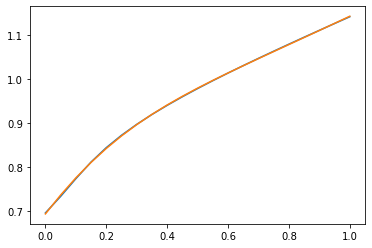

In [50]:
plt.figure()
iwt = 90
istim,itype = 0,0
plt.plot(x,nr[iwt,:,istim,itype])
plt.plot(x,nra.two_asymptote_fn(x,*params[iwt,istim,itype,:]))

In [51]:
params[iwt,istim,itype,:]

array([-0.03606727,  1.16199957,  0.60134729,  0.35470118,  0.77562217,
        0.26386526])

In [113]:
idir = 2
iconn = 0
nr = network_resps[idir][iconn]

import naka_rushton_analysis as nra
reload(nra)
x = opto_levels#-opto_levels.min()#+1
params_cpl = np.zeros((nr.shape[0],nr.shape[2],3,6))
for istim in range(nr.shape[2]):
    print(istim)
    for itype in range(3):
        params_cpl[:,istim,itype,:],_ = nra.fit_opt_params_two_asymptote_fn(x,nr[:,:,istim,itype])

0


/Users/dan/Documents/code/adesnal/naka_rushton_analysis.py:356: RuntimeWarning: divide by zero encountered in true_divide
  factor = 1/(1+np.exp((x-x0)/lam))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: divide by zero encountered in true_divide
  return f_raw(*args, **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:75: RuntimeWarning: invalid value encountered in multiply
  defvjp(anp.exp,    lambda ans, x : lambda g: ans * g)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:52: RuntimeWarning: invalid value encountered in true_divide
  defvjp(anp.true_divide, lambda ans, x, y : unbroadcast_f(x, lambda g: g / y),
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/numpy/numpy_vjps.py:53: RuntimeWarning: invalid value encountered in true_divide
  lambda ans, x, y : unbroadcast_f(y, lambda g: - g * x / y**2))
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/a

did not work for 80
1
2
3
4
5
6
7
8
did not work for 37
9
10
11
did not work for 45
12
13
14
15
16
did not work for 73
17
18
19
20
21
22
23
24
25
26
27
did not work for 72
28
29
30
31
32
33
34
35


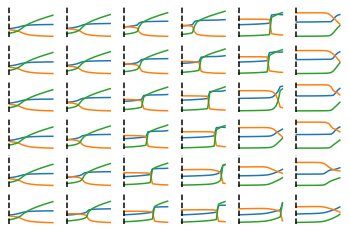

In [115]:
idir = 2
iconn = 0
istim = 0
itype = 0
iwt = 6
plt.figure()
for istim in range(36):
    plt.subplot(6,6,istim+1)
    for itype in range(3):
        plt.plot(opto_levels,network_resps[idir][iconn][iwt,:,istim,itype])
#         plt.plot(opto_levels,np.nanpercentile(network_resps[idir][iconn][:,:,istim,itype],50,axis=0))
    if not np.isnan(params[iwt,istim,itype,0]):
        plt.axvline(params[iwt,istim,itype,0],c='k',linestyle='dashed')
#     plt.axvline(0,c='k',linestyle='dashed')
    plt.ylim((0,2.5))
    plt.axis('off')

In [147]:
target_amplitude = params[:,23,0,0]#0.5*params[:,23,0,0] + 0.5*params[:,35,0,0]
target_bin = np.digitize(target_amplitude,opto_levels)-1

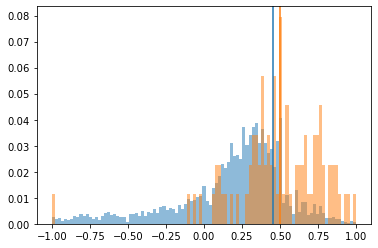

In [165]:
plt.figure()
ut.bar_pdf(params[:,:,0,0].flatten(),bins=np.linspace(-1,1,100),alpha=0.5)
ut.bar_pdf(params[:,23,0,0],bins=np.linspace(-1,1,100),alpha=0.5)
plt.axvline(np.median(params[:,5::6,0,0]),c='C0')
plt.axvline(np.median(params[:,23,0,0]),c='C1')

(array([11.,  4.,  2., 17., 11., 13., 10., 13.,  7.,  6.]),
 array([-1. ,  1.1,  3.2,  5.3,  7.4,  9.5, 11.6, 13.7, 15.8, 17.9, 20. ]),
 <BarContainer object of 10 artists>)

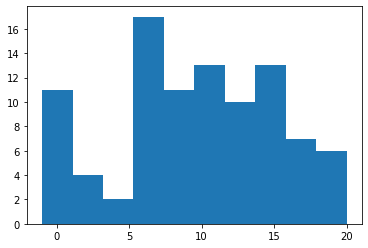

In [55]:
plt.figure()
plt.hist(target_bin)

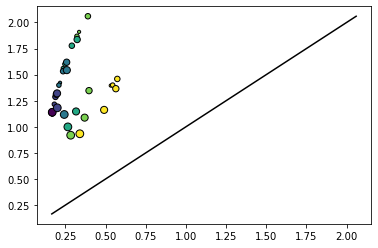

In [56]:
plt.figure()
idir1 = 0
idir2 = 2
ilight = 3
iconn = 0
itype = 0
iwt = 7
sca.scatter_size_contrast(network_resps[idir1][iconn][iwt,0,:,itype],network_resps[idir2][iconn][iwt,ilight,:,itype],nsize=6,ncontrast=6)

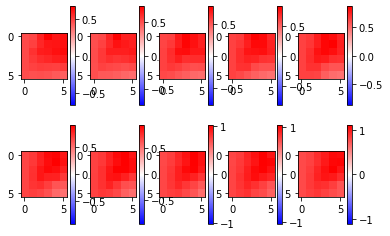

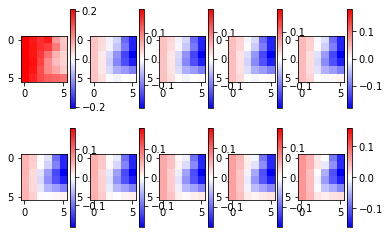

In [57]:
idir = 2
iconn = 0
ibaseline = 0
lkat = np.nanmax(network_resps[idir][iconn].reshape((network_resps[idir][iconn].shape[0],-1)),axis=1)<5
plt.figure()
for ilight in range(10):
    plt.subplot(2,5,ilight+1)
    ut.imshow_hot_cold(np.nanmean(network_resps[idir][iconn][lkat],0)[:,:,0].reshape((-1,6,6))[ibaseline+ilight]-np.nanmean(network_resps[0][iconn][lkat],0)[:,:,0].reshape((-1,6,6))[ibaseline])#,vmin=0,vmax=1.25)
    plt.colorbar()

idir = 1
plt.figure()
for ilight in range(10):
    plt.subplot(2,5,ilight+1)
    ut.imshow_hot_cold(np.nanmean(network_resps[idir][iconn][lkat],0)[:,:,0].reshape((-1,6,6))[ibaseline-ilight]-np.nanmean(network_resps[0][iconn][lkat],0)[:,:,0].reshape((-1,6,6))[ibaseline])#,vmin=0,vmax=1.25)
    plt.colorbar()

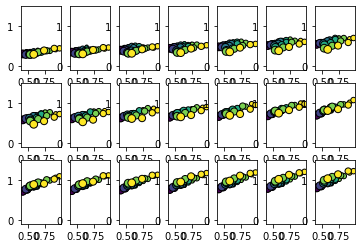

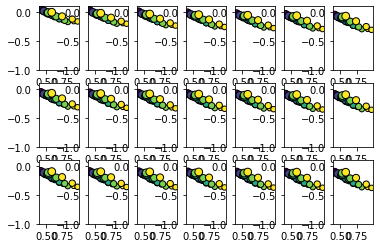

In [116]:
idir = 2
iconn = 0
ibaseline = 15
itype = 0
# ibaseline = 0
ylim = (-0.1,1.5)
lkat = np.nanmax(network_resps[idir][iconn].reshape((network_resps[idir][iconn].shape[0],-1)),axis=1)<5
plt.figure()
for ilight in range(len(opto_levels)):#15):#
    plt.subplot(3,7,ilight+1)
    xdata = np.nanmean(network_resps[0][iconn][lkat],0)[:,:,itype].reshape((-1,6,6))[ibaseline]
    ydata = np.nanmean(network_resps[idir][iconn][lkat],0)[:,:,itype].reshape((-1,6,6))[ilight]
    sca.scatter_size_contrast(xdata,ydata-xdata,square=False,equality_line=False)#,vmin=0,vmax=1.25)
    plt.ylim(ylim)
#     plt.colorbar()

idir = 1
ylim = (-1,0.1)
plt.figure()
for ilight in range(len(opto_levels)):#15):#
    plt.subplot(3,7,ilight+1)
    xdata = np.nanmean(network_resps[0][iconn][lkat],0)[:,:,itype].reshape((-1,6,6))[ibaseline]
    ydata = np.nanmean(network_resps[idir][iconn][lkat],0)[:,:,itype].reshape((-1,6,6))[ilight]
    sca.scatter_size_contrast(xdata,ydata-xdata,square=False,equality_line=False)#,vmin=0,vmax=1.25)
    plt.ylim(ylim)
#     plt.colorbar()
    

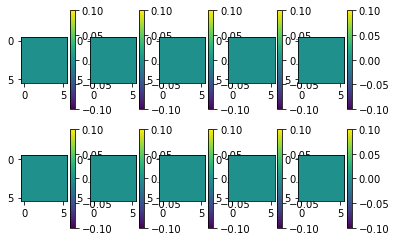

In [59]:
plt.figure()
for ilight in range(10):
    plt.subplot(2,5,ilight+1)
    plt.imshow(np.nanmean((network_resps[1][0])>10,0)[:,:,0].reshape((-1,6,6))[ilight])
    plt.colorbar()

In [60]:
np.nanmean(network_resps[1][0],0)[:,:,0].shape

(21, 36)

In [61]:
# network_resps = [None for idir in range(3)]
# for idir,npyfile in enumerate([npyfile,npyfile_halo,npyfile_chrimson]):
    
#     YY_opto = npyfile['YY_opto'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcpc = npyfile['YY_opto_no_pcpc'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcpv = npyfile['YY_opto_no_pcpv'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcvip = npyfile['YY_opto_tavg_no_pcvip'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_pcsst = npyfile['YY_opto_tavg_no_pcsst'][low_loss,:,:,np.newaxis,:]
#     YY_opto_no_vipbias = npyfile['YY_opto_tavg_no_vipbias'][low_loss,:,:,np.newaxis,:]

#     these_losses = losses[low_loss]
    
#     nwt = len(mdls)
#     iwt = 0
#     itype = 0

#     nN = mdls[iwt].nN
#     ntypes = mdls[iwt].nQ*mdls[iwt].nS*mdls[iwt].nT
#     this_mdl,this_YY = mdls_no_pcpc.copy(),YY_opto_no_pcpc.copy()
#     # this_mdl,this_YY = mdls_no_pcpv.copy(),YY_opto_no_pcpv.copy()
#     # this_mdl,this_YY = mdls.copy(),YY_opto.copy()
#     YYs = [YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias]
#     network_resps[idir] = [np.zeros((nwt,opto_levels.shape[0],nN,ntypes)) for YY in YYs]
#     mdlses = [mdls,mdls_no_pcpc,mdls_no_pcpv,mdls_no_pcvip,mdls_no_pcsst,mdls_no_vipbias]
# #     network_resp = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
# #     network_resp_no_pcpc = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
# #     network_resp_no_pcpv = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
# #     network_resp_no_pcvip = np.zeros((nwt,3,nN,ntypes))
# #     cell_intrinsic_resp = np.zeros((nwt,opto_levels.shape[0],nN,ntypes))
#     for network_resp,YY in zip(network_resps[idir],YYs):
#         for iwt in range(nwt):
#             network_resp[iwt] = np.nanmean(YY[iwt],2)
# #     for iwt in range(nwt):
# #         network_resp[iwt] = np.nanmean(YY_opto[iwt],2) # time avg
# #         network_resp_no_pcpc[iwt] = np.nanmean(YY_opto_no_pcpc[iwt],2)
# #         network_resp_no_pcpv[iwt] = np.nanmean(YY_opto_no_pcpv[iwt],2)
# #         network_resp_no_pcvip[iwt] = np.nanmean(YY_opto_no_pcvip[iwt],2)

# #         for ilevel in range(opto_levels.shape[0]):
# #             cell_intrinsic_resp[iwt,ilevel] = this_mdl[iwt].compute_f_(opto_levels[ilevel]+this_mdl[iwt].Eta,this_mdl[iwt].Xi,this_mdl[iwt].s02)
            

In [62]:
opto_levels

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

In [63]:
network_resps[0][0].shape

(94, 31, 36, 8)

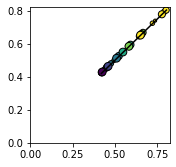

In [64]:
#    YYs = [YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias]
itype = 1

plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast_errorbar(network_resps[0][0][:,0,:,itype],network_resps[0][3][:,0,:,itype],nsize=6,ncontrast=6)
ut.zero_origin('xy')

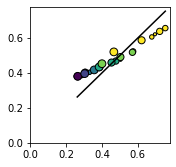

In [65]:
#    YYs = [YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias]
itype = 0

plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast_errorbar(network_resps[0][0][:,0,:,itype],network_resps[1][0][:,5,:,itype],nsize=6,ncontrast=6)
ut.zero_origin('xy')

In [96]:
opto_levels.shape

(21,)

In [97]:
network_resp.shape

(94, 31, 36, 8)

ValueError: x and y must have same first dimension, but have shapes (21,) and (31,)

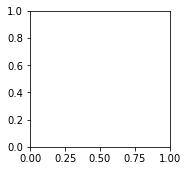

In [119]:
pct_l,pct_u = 16,84
#YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias
idir = 0
network_resp,network_resp_no_pcpc,network_resp_no_pcpv,network_resp_no_pcvip,network_resp_no_pcsst,network_resp_no_vipbias = network_resps[idir]
for istim,title in zip([0,5],['0% contrast','5$^o$ size, 100% contrast']):
    plt.figure(figsize=(2.5,2.5))
#     plt.plot(opto_levels,np.nanmean(cell_intrinsic_resp,0)[:,istim,itype],c='k',linestyle='dashed',label='cell-intrinsic nonlinearity')
#     plt.fill_between(opto_levels,np.nanpercentile(cell_intrinsic_resp,pct_l,axis=0)[:,istim,itype],np.nanpercentile(cell_intrinsic_resp,pct_u,axis=0)[:,istim,itype],facecolor='k',alpha=0.5)
    #YY_opto,YY_opto_no_pcpc,YY_opto_no_pcpv,YY_opto_no_pcvip,YY_opto_no_pcsst,YY_opto_no_vipbias
    plt.plot(opto_levels,np.nanmean(network_resp,0)[:,istim,itype],c='k',label='baseline')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp,pct_u,axis=0)[:,istim,itype],facecolor='k',alpha=0.5)
    
    plt.plot(opto_levels,np.nanmean(network_resp_no_pcpc,0)[:,istim,itype],c=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp_no_pcpc,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp_no_pcpc,pct_u,axis=0)[:,istim,itype],facecolor=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted',alpha=0.5)
    
    plt.plot(opto_levels,np.nanmean(network_resp_no_pcpv,0)[:,istim,itype],c=np.array((0,0,1)),label='PC$\leftrightarrow$PC weights deleted')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp_no_pcpv,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp_no_pcpv,pct_u,axis=0)[:,istim,itype],facecolor=np.array((0,0,1)),label='PC$\leftrightarrow$PC weights deleted',alpha=0.5)
    
    # plt.legend()
    plt.xlim((-1,1))
    plt.ylim((-0.1,2))
    ut.erase_top_right()
    plt.xlabel('simulated current injection')
    plt.ylabel('simulated firing rate')
    # plt.title('PC$\leftrightarrow$PC weights deleted')
    plt.tight_layout()
#     plt.savefig('figures/network_nonlinearity_w_and_wo_wpcpc_stim_%d_no_title.jpg'%istim,dpi=300)
#     plt.title(title)
    plt.tight_layout()
#     plt.savefig('figures/network_nonlinearity_w_and_wo_wpcpc_stim_%d.jpg'%istim,dpi=300)


NameError: name 'network_resp_no_pcpc' is not defined

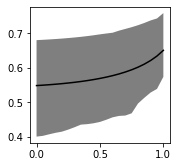

In [94]:
pct_l,pct_u = 16,84
xlims = [(0.3,0.7),(0.7,1.3)]
ylims = [(0.2,0.6),(0.6,1.3)]
for istim,title,xlim,ylim in zip([0,5],['0% contrast','5$^o$ size, 100% contrast'],xlims,ylims):
    plt.figure(figsize=(2.5,2.5))
#     plt.plot(opto_levels,np.nanmean(cell_intrinsic_resp,0)[:,istim,itype],c='k',linestyle='dashed',label='cell-intrinsic nonlinearity')
#     plt.fill_between(opto_levels,np.nanpercentile(cell_intrinsic_resp,pct_l,axis=0)[:,istim,itype],np.nanpercentile(cell_intrinsic_resp,pct_u,axis=0)[:,istim,itype],facecolor='k',alpha=0.5)
    
    plt.plot(opto_levels,np.nanmean(network_resp,0)[:,istim,itype],c='k',label='baseline')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp,pct_u,axis=0)[:,istim,itype],facecolor='k',alpha=0.5)
    
    plt.plot(opto_levels,np.nanmean(network_resp_no_pcpc,0)[:,istim,itype],c=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp_no_pcpc,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp_no_pcpc,pct_u,axis=0)[:,istim,itype],facecolor=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted',alpha=0.5)
    
    plt.plot(opto_levels,np.nanmean(network_resp_no_pcpv,0)[:,istim,itype],c=np.array((0,0,1)),label='PC$\leftrightarrow$PV weights deleted')
    plt.fill_between(opto_levels,np.nanpercentile(network_resp_no_pcpv,pct_l,axis=0)[:,istim,itype],np.nanpercentile(network_resp_no_pcpv,pct_u,axis=0)[:,istim,itype],facecolor=np.array((0,0,1)),label='PC$\leftrightarrow$PV weights deleted',alpha=0.5)
    
    # plt.legend()
#     plt.xlim(xlim)
#     plt.ylim(ylim)
    plt.xlim((-1,1))
    plt.ylim((-0.1,1.5))
    ut.erase_top_right()
    plt.xlabel('simulated current injection')
    plt.ylabel('simulated firing rate')
    # plt.title('PC$\leftrightarrow$PC weights deleted')
    plt.tight_layout()
#     plt.savefig('figures/network_nonlinearity_w_and_wo_wpcpv_stim_%d_no_title.jpg'%istim,dpi=300)
    plt.title(title)
    plt.tight_layout()
#     plt.savefig('figures/network_nonlinearity_w_and_wo_wpcpv_stim_%d.jpg'%istim,dpi=300)


In [ ]:
np.digitize(mdls[0].XX[:,0],opto_levels)

In [ ]:
import sim_utils
def this_gen_size_tuning(flsc):
    shp = flsc.shape
    rflsc = flsc.reshape((shp[0]*shp[1],shp[2],shp[3]))
    size_tuning = sim_utils.gen_size_tuning(rflsc).reshape((shp[0],shp[1],shp[2]+1,shp[3]))
    return size_tuning

In [ ]:
usize = np.array((5,8,13,22,36,60))
usize0 = np.array((0,5,8,13,22,36,60))
ilights = [ibaseline,ibaseline-5]
nlights = len(ilights)
plt.figure(figsize=(5,2.5))
for iicontrast,icontrast in enumerate([1,5]):
    plt.subplot(1,2,iicontrast+1)
    ydata = this_gen_size_tuning(network_resp[:,ilights][:,:,:,itype].reshape((nwt,nlights,6,6)))[:,:,:,icontrast]
    ut.plot_pct_errorbars_hillel(usize0,ydata)
    plt.ylim((0,1.1))


In [ ]:
ibaseline = 10
ilow = 5
ihigh = 15
plt.figure(figsize=(2.5,2.5))
xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
ydata = network_resp[:,ilow,:,itype].reshape((-1,6,6))
sca.scatter_size_contrast_errorbar(xdata,ydata)

plt.figure(figsize=(2.5,2.5))
xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
sca.scatter_size_contrast_errorbar(xdata,ydata)

In [ ]:
opto_levels[[7,10,13]]

In [ ]:
ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))

In [ ]:
network_resps[0][0].shape

In [ ]:
ibaseline = 0
ilow = 5
ihigh = 5

ValueError: operands could not be broadcast together with shapes (21,) (31,) 

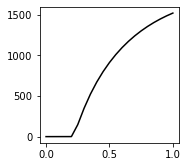

In [125]:
for istim,title in zip([0,5],['0% contrast','5$^o$ size, 100% contrast']):
    plt.figure(figsize=(2.5,2.5))
#     plt.plot(opto_levels,np.nanmean(cell_intrinsic_resp,0)[:,istim,itype],c='k',linestyle='dashed',label='cell-intrinsic nonlinearity')
    plt.plot(opto_levels,np.nanmean(network_resps[idir][0],0)[:,istim,itype],c='k',label='baseline')
    lb,ub = [np.nanpercentile(network_resp[:,:,istim,itype],pct,axis=0) for pct in [pct_l,pct_u]]
    plt.fill_between(opto_levels,lb,ub,facecolor='k',alpha=0.5)
#     plt.fill_between(opto_levels[ilow:ibaseline+1],lb[ilow:ibaseline+1],ub[ilow:ibaseline+1],facecolor=np.array((1,0.8,0)))
    plt.plot(opto_levels[ilow:ibaseline+1],np.nanmean(network_resp,0)[:,istim,itype][ilow:ibaseline+1],c=np.array((1,0.8,0)),label='baseline',linewidth=4)
    plt.plot(opto_levels[ibaseline:ihigh+1],np.nanmean(network_resp,0)[:,istim,itype][ibaseline:ihigh+1],c=np.array((1,0,0)),label='baseline',linewidth=4)
#     plt.axvline(0,c='k',linestyle='dashed')
#     plt.axhline(0,c='k',linestyle='dashed')
    plt.axhline(np.nanmean(network_resp,0)[:,istim,itype][ibaseline],c='k',linestyle='dashed')
    plt.axhline(np.nanmean(network_resp,0)[:,istim,itype][ilow],c=np.array((1,0.8,0)),linestyle='dashed')
    plt.axhline(np.nanmean(network_resp,0)[:,istim,itype][ihigh],c=np.array((1,0,0)),linestyle='dashed')
#     plt.axvline(opto_levels[ilow],c=np.array((1,0.8,0)))
#     plt.axvline(opto_levels[ihigh],c=np.array((1,0,0)))

    #     plt.plot(opto_levels,np.nanmean(network_resp_no_pcpc,0)[:,istim,itype],c=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted')
    # plt.legend()
    plt.xlim((-1,1))
    plt.ylim((-0.1,1.8))
    ut.erase_top_right()
    plt.xlabel('simulated PC current injection')
    plt.ylabel('simulated PC firing rate')
    # plt.title('PC$\leftrightarrow$PC weights deleted')
    plt.title(title)
    plt.tight_layout()
#     plt.savefig('figures/network_nonlinearity_l4_%d_opto_colors.jpg'%istim,dpi=300)

In [174]:
import calnet.utils
reload(calnet.utils)
couplingses = [[None for _ in network_resps[idir]] for idir in range(3)]
for idir in range(3):
    for iconn in range(len(network_resps[idir])):
        couplingses[idir][iconn] = calnet.utils.compute_couplings(network_resps[idir][iconn],mdlses[iconn])
        
Xcouplingses = [[None for _ in network_resps[idir]] for idir in range(3)]
for idir in range(3):
    for iconn in range(len(network_resps[idir])):
        Xcouplingses[idir][iconn] = calnet.utils.compute_Xcouplings(network_resps[idir][iconn],mdlses[iconn])

In [ ]:
reload(calnet.utils)
plt.figure()
this_nopto = 61
opto_mag = np.linspace(-3,3,this_nopto)
opto_coupling = np.zeros((nwt,this_nopto,6,6))
for iwt in range(nwt):
    idir,iconn,ilight = 0,0,0
    i,j = 4,0
    tgt = couplingses[idir][iconn][iwt][ilight][0,0,i,j]
    for iopto in range(this_nopto):
        opto_coupling[iwt,iopto] = calnet.utils.compute_coupling_perturb_WW(mdlses[0][iwt],4,0,opto_mag[iopto])
    plt.plot(opto_mag,opto_coupling[iwt,:,4,5])
plt.axhline(0,c='k',linestyle='dashed')
plt.axvline(0,c='k',linestyle='dashed')
plt.ylim(-1,1)

In [ ]:
iconn = 0
idir = 0
ilight = 0
i,j = 4,0
reload(calnet.utils)
nsize,ncontrast = 6,6
dw_to_zero,cpl = [np.zeros((nwt,nsize,ncontrast)) for _ in range(2)]
for iwt in range(nwt):
    tgt = couplingses[idir][iconn][iwt][ilight][0,0,i,j]
    print(iwt)
    for isize in range(nsize):
        for icontrast in range(ncontrast):
#             istim = np.ravel_multi_index((isize,icontrast),(nsize,ncontrast))
            dw_to_zero[iwt,isize,icontrast],cpl[iwt,isize,icontrast] = calnet.utils.zero_coupling_optimize_dWW(mdlses[iconn][iwt],isize,icontrast,i,j,tgt=tgt)

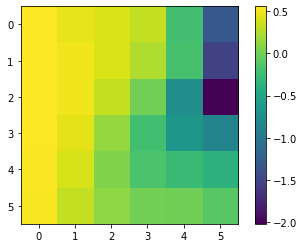

In [67]:
plt.figure()
plt.imshow(cpl[2])
plt.colorbar()

In [68]:
cpl[0]

array([[0.51532389, 0.55051789, 0.57503576, 0.65204845, 0.56290983,
        0.59010141],
       [0.54339947, 0.53854361, 0.590065  , 0.61461813, 0.59022514,
        0.55931889],
       [0.51553261, 0.57444409, 0.60197202, 0.58155039, 0.54154459,
        0.58337428],
       [0.5372189 , 0.5847915 , 0.59282427, 0.57108484, 0.58023543,
        0.68656459],
       [0.54199772, 0.58536992, 0.61038747, 0.62112416, 0.67355383,
        0.81386879],
       [0.52767066, 0.57819094, 0.63096432, 0.67317449, 0.71056925,
        0.79573162]])

In [69]:
couplingses[idir][iconn][iwt][ilight][0,0,i,j]

0.06204937924742012

In [70]:
reload(calnet.utils)
YY_opto = np.zeros((nwt,2,nN,nQ*nS*nT))
for iwt in range(nwt):
    print(iwt)
    for ilight in range(2):
        YY_opto[iwt,ilight] = calnet.utils.compute_YY_dw_mdl(mdlses[0][iwt],4,0,ilight*dw_to_zero[iwt].flatten())

0


NameError: name 'dw_to_zero' is not defined

In [71]:
itype = 0
iwt = 4
plt.figure()
sca.scatter_size_contrast(YY_opto[iwt,0,:,0].reshape((nsize,ncontrast)),YY_opto[iwt,1,:,0].reshape((nsize,ncontrast)))

NameError: name 'nsize' is not defined

<Figure size 432x288 with 0 Axes>

In [72]:
iwt = 7
plt.figure()
plt.imshow(dw_to_zero[iwt])
plt.colorbar()

NameError: name 'dw_to_zero' is not defined

<Figure size 432x288 with 0 Axes>

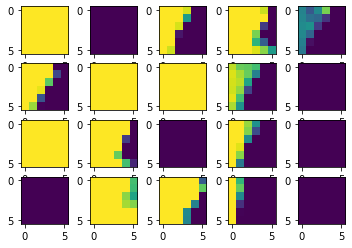

In [73]:
plt.figure()
for iwt in range(20):
    tgt = couplingses[idir][iconn][iwt][ilight][0,0,i,j]
    plt.subplot(4,5,iwt+1)
    plt.imshow(cpl[iwt],vmin=tgt-0.1,vmax=tgt+0.1)
#     plt.colorbar()

In [74]:
dw_to_zero[iwt].flatten().shape

NameError: name 'dw_to_zero' is not defined

In [ ]:
iwt = 1
plt.figure()
plt.imshow(dw_to_zero[iwt])
plt.colorbar()

In [ ]:
reload(calnet.utils)
plt.figure()
this_nopto = 61
opto_coupling = np.zeros((2,6,6))
for iwt in range(len(mdlses[0])):
    opto_coupling[0] = calnet.utils.compute_coupling_mdl(mdlses[0][iwt])[0,:,:,4,0]
    opto_coupling[1] = calnet.utils.compute_coupling_zero_K(mdlses[0][iwt])[:,:,4,0]
    plt.plot(opto_coupling[:,4,5])
plt.axhline(0,c='k',linestyle='dashed')
plt.axvline(0,c='k',linestyle='dashed')
plt.ylim(-1,1)

In [ ]:
calnet.utils.compute_coupling_zero_K(mdlses[0][iwt]).shape

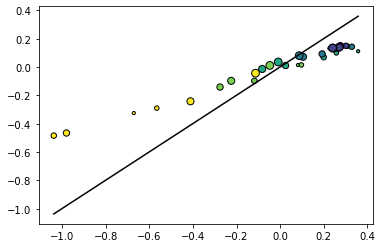

In [75]:
plt.figure()
ifit = 0
itype = 2
idir = 1
iconn = 0
i,j = 4,0
# sca.scatter_size_contrast(network_resps[idir][iconn][ifit,0,:,itype],network_resps[idir][iconn][ifit,5,:,itype],nsize=6,ncontrast=6)
sca.scatter_size_contrast(couplingses[idir][iconn][ifit,0,:,:,i,j],couplingses[idir][iconn][ifit,5,:,:,i,j],nsize=6,ncontrast=6)


In [76]:
ilight_drmax = [[None for _ in network_resps[idir]] for idir in range(3)]
i,j = 4,0
for idir in range(3):
    ilight_drmax[idir] = [None for _ in network_resps[idir]]
    for iconn in range(len(network_resps[idir])):
        ilight_drmax[idir][iconn] = np.argmax(couplingses[idir][iconn][:,:,:,0,i,j].max(2)-couplingses[idir][iconn][:,:,:,-1,i,j].min(2),axis=1)
        

In [77]:
idir,iconn,i,j = 0,0,4,0
couplingses[idir][iconn][:,:,:,0,i,j].max(2)-couplingses[idir][iconn][:,:,:,-1,i,j].min(2)

array([[ 0.26951113,  0.27262149,  0.27660445, ..., -0.80453661,
        -0.79566861, -0.78839472],
       [-0.34861283, -0.3458687 , -0.34234362, ...,  0.37150785,
         0.37637623,  0.38031749],
       [ 0.45669212,  0.46186787,  0.46853247, ...,  0.17426158,
         0.15909407,  0.14497036],
       ...,
       [ 0.08119788,  0.08138994,  0.08164522, ..., -0.00750935,
        -0.0075299 , -0.00756283],
       [ 0.08176782,  0.08341511,  0.08557029, ..., -0.6178777 ,
        -0.61763681, -0.61754546],
       [ 0.99367468,  0.9954284 ,  0.99770403, ...,  0.29672909,
         0.2971889 ,  0.29760046]])

In [78]:
ilight_drmax[2][0]

array([16, 20,  8,  5,  4,  4, 20,  7,  4,  0, 12, 12,  1, 12,  5, 20,  1,
       10, 19,  8,  2, 20,  2,  7,  9, 10,  4, 15,  8, 20, 12,  8,  2,  9,
        6,  8,  9, 19, 15,  8, 18,  8,  9, 11,  3,  6,  5, 10, 13,  6, 14,
       10, 12, 20,  8, 16, 11,  5,  8, 12, 12,  3, 11,  7,  8, 14, 13, 20,
        9,  0,  8,  3,  5,  7, 10, 20,  0,  9, 13,  3, 20, 16, 11,  2, 11,
        4,  4,  9, 10,  9,  9, 10, 13,  5])

In [79]:
def compute_slope_intercept_res(xdata,ydata):
    xdata_norm = xdata/xdata.mean()[np.newaxis,np.newaxis]
    ydata_norm = ydata/xdata.mean()[np.newaxis,np.newaxis]
    slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
    pred = slope*xdata_norm + intercept
    actual = (ydata_norm-xdata_norm)
    residual = actual - pred
    return slope,intercept,residual

In [117]:
nopto = 11
itype = 0
slope,intercept,res = [[[None for idir in range(2)] for iconn in range(6)] for _ in range(3)]
ilight_resmax = [None for idir in range(3)]
for idir in range(3):
    ilight_resmax[idir] = [None for iconn in range(6)]
for iconn in range(6):
    # (nfiles,nopto,nsize,ncontrast,ntypes)
    xdata = network_resps[1][iconn][:,:,:,:].reshape((-1,nopto,6,6,ntypes)) # halo
    ydata = network_resps[2][iconn][:,:,:,:].reshape((-1,nopto,6,6,ntypes)) # chrimson
    nfits = xdata.shape[0]
    # (nfiles,1,nsize,ncontrast,ntypes)
    zdata = network_resps[0][iconn][:,:,:,:].reshape((-1,1,6,6,ntypes)) # ctrl
    for idir in range(2):
        slope[iconn][idir] = np.zeros(ydata.shape[:2]+ydata.shape[-1:])
        intercept[iconn][idir] = np.zeros(ydata.shape[:2]+ydata.shape[-1:])
        res[iconn][idir] = np.zeros(ydata.shape)
        for itype in range(ntypes):
            for ifit in range(nfits):
                for iopto in range(nopto):
                    if idir==0:
                        slope[iconn][idir][ifit,iopto,itype],intercept[iconn][idir][ifit,iopto,itype],this_res = compute_slope_intercept_res(zdata[ifit,0,:,:,itype],xdata[ifit,iopto,:,:,itype])
                    if idir==1:
                        slope[iconn][idir][ifit,iopto,itype],intercept[iconn][idir][ifit,iopto,itype],this_res = compute_slope_intercept_res(zdata[ifit,0,:,:,itype],ydata[ifit,iopto,:,:,itype])
                    res[iconn][idir][ifit,iopto,:,:,itype] = this_res.reshape((6,6))
        ilight_resmax[idir+1][iconn] = np.argmax(np.abs(res[iconn][idir]).sum(2).sum(2),axis=1)[:,itype]
    ilight_resmax[0][iconn] = np.zeros_like(ilight_resmax[1][iconn])

ValueError: cannot reshape array of size 568512 into shape (11,6,6,8)

In [121]:
network_resps[1][iconn].shape

(94, 21, 36, 8)

In [149]:
0.5**5

0.03125

In [150]:
this_target_bin

array([15,  9,  1,  5, 10,  7, 17,  2,  2,  0, 12,  8,  9, 17,  0,  3,  8,
       10, 20,  0, 15,  7, 10,  7,  9, 11, 20, 20,  0, 18,  9,  8, 12,  9,
        0,  6,  9, 19, 16,  3, 20,  0,  6, 11,  1,  0,  0,  3, 18,  2, 15,
        5, 15, 13,  4, 20, 10,  0,  0, 12, 12,  0, 12,  9,  9, 15,  0,  9,
        0, 10,  0, 15,  0,  6, 12, 19,  0,  8, 14,  0, 18, 20,  6,  6, 10,
        2, 20,  7,  3,  7, 14,  5, 15, 15])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: -0.547826, pval: 0.00E+00
0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
baseline,halo,size 0,frac. >0: 0.561798
p-value:
WilcoxonResult(statistic=1847.0, pvalue=0.5246464780347189)
baseline,halo,size 5,frac. >0: 0.022472
p-value:
WilcoxonResult(statistic=11.0, pvalue=3.7044382273599564e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: 0.397991, pval: 2.60E-08
0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
baseline,chrimson,size 0,frac. >0: 0.505618
p-value:
WilcoxonResult(statistic=1858.0, pvalue=0.5543898253755807)
baseline,chrimson,size 5,frac. >0: 0.696629
p-value:
WilcoxonResult(statistic=802.0, pvalue=9.032566346873514e-07)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: -0.680681, pval: 0.00E+00
0.008436637371726433
linewidth: 1
plotting
linewidth: 1
plotting
pcpv_deleted,halo,size 0,frac. >0: 0.471910
p-value:
WilcoxonResult(statistic=1798.0, pvalue=0.4027759606714839)
pcpv_deleted,halo,size 5,frac. >0: 0.258427
p-value:
WilcoxonResult(statistic=782.0, pvalue=5.931040891432279e-07)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: 1.588194, pval: 0.00E+00
0.012620103777007004
linewidth: 1
plotting
linewidth: 1
plotting
pcpv_deleted,chrimson,size 0,frac. >0: 0.505618
p-value:
WilcoxonResult(statistic=1970.0, pvalue=0.8942189127842184)
pcpv_deleted,chrimson,size 5,frac. >0: 0.247191
p-value:
WilcoxonResult(statistic=710.0, pvalue=1.236449105550985e-07)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: -0.470725, pval: 0.00E+00
0.15046398955602608
linewidth: 1
plotting
linewidth: 1
plotting
pcvip_deleted,halo,size 0,frac. >0: 0.494382
p-value:
WilcoxonResult(statistic=1837.0, pvalue=0.49833456452595437)
pcvip_deleted,halo,size 5,frac. >0: 0.168539
p-value:
WilcoxonResult(statistic=488.0, pvalue=5.780753104807998e-10)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: 0.623398, pval: 4.31E-92
0.033518859443056236
linewidth: 1
plotting
linewidth: 1
plotting
pcvip_deleted,chrimson,size 0,frac. >0: 0.550562
p-value:
WilcoxonResult(statistic=1987.0, pvalue=0.9494357466761221)
pcvip_deleted,chrimson,size 5,frac. >0: 0.314607
p-value:
WilcoxonResult(statistic=1029.0, pvalue=6.808098186286758e-05)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: -0.487548, pval: 0.00E+00
0.14543785525294273
linewidth: 1
plotting
linewidth: 1
plotting
pcsst_deleted,halo,size 0,frac. >0: 0.471910
p-value:
WilcoxonResult(statistic=1834.0, pvalue=0.49058009860518426)
pcsst_deleted,halo,size 5,frac. >0: 0.191011
p-value:
WilcoxonResult(statistic=532.0, pvalue=1.784732712565113e-09)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


slope: 0.557375, pval: 3.08E-65
0.01970929282015873
linewidth: 1
plotting
linewidth: 1
plotting
pcsst_deleted,chrimson,size 0,frac. >0: 0.595506
p-value:
WilcoxonResult(statistic=1926.0, pvalue=0.7542916431401274)
pcsst_deleted,chrimson,size 5,frac. >0: 0.359551
p-value:
WilcoxonResult(statistic=1164.0, pvalue=0.000602321055305223)


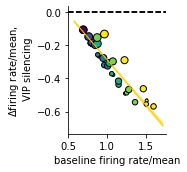

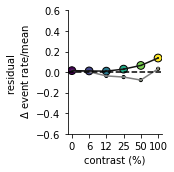

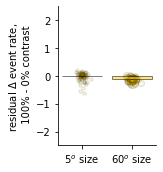

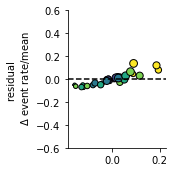

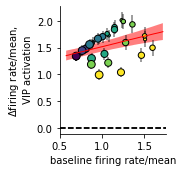

...

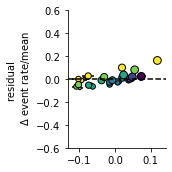

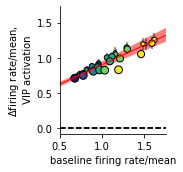

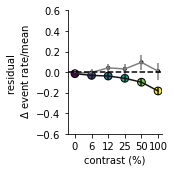

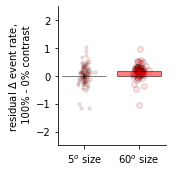

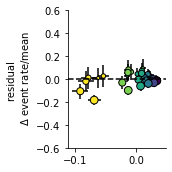

In [183]:
save_fig = False

reload(ut)
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0
itype2 = 2

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
reload(opto_utils)

light_lbls = ['silencing','activation']
opto_lbls = ['halo','chrimson']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

target_bin = this_target_bin.copy()

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    zdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype2].reshape((-1,6,6))
    zdata_norm = zdata/zdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    for idir,ilight,light_lbl,c,ylim,opto_lbl in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims,opto_lbls):

        plt.figure(figsize=(2.5,2.5))
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        wdata = network_resps[idir][iconn][lkat][:,:,:,itype2][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        wdata_norm = wdata/wdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#         sca.scatter_size_contrast_errorbar(xdata_norm,ydata_norm-xdata_norm,equality_line=False,square=False)
        opto_utils.scatter_size_contrast_x_dx_errorbar(np.concatenate((xdata_norm[:,:,:,np.newaxis],ydata_norm[:,:,:,np.newaxis]),axis=-1),opto_color=c)
        plt.axhline(0,c='k',linestyle='dashed')
    #     ut.zero_origin('x')
        plt.xlabel('baseline firing rate/mean')
        plt.ylabel('$\Delta$firing rate/mean, \n VIP %s'%light_lbl)
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        xs = np.array((xdata_norm.min(),xdata_norm.max()))
        print('slope: %f, pval: %.2E'%(slope,p_value))
#         plt.plot(xs,slope*xs+intercept,c=c,linestyle='dashed')
    #     plt.ylim(ylim)
        plt.xlim((0.5,1.75))
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/delta_rate_vs_rate_l4_%s_%s.jpg'%(light_lbl,conn_lbls[iconn]),dpi=300)

        plt.figure(figsize=(2.5,2.5))
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        these_sizes = [0,5]
#         ut.plot_parametric_fn_errorbars(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],fit_fn=nra.fit_opt_params_two_asymptote_fn,plot_fn=nra.two_asymptote_fn,colors=c_l23[these_sizes],markersize=0,errorstyle='bs')
#         ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
        ut.plot_bootstrapped_errorbars_hillel(np.arange(6),residual[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
        xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
        for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
            sca.scatter_size_contrast(xs,np.nanmean(residual[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
        plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/residual_delta_rate_vs_contrast_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

            
        plt.figure(figsize=(2.5,2.5))
        d_residual = [residual[:,this_size,0]-residual[:,this_size,-1] for this_size in these_sizes]
        if iconn == 0:
            og_d_residual = d_residual.copy()
        ut.bar_with_dots(d_residual,colors=[cs[idir-1] for _ in range(len(these_sizes))],\
                         tick_labels=['%d$^o$ size'%u for u in usize[these_sizes]],\
                         s=[dot_sizes[isize] for isize in these_sizes],\
                        alpha=0.125,bar_alpha_frac=4)
        plt.ylabel('residual $\Delta$ event rate, \n 100% - 0% contrast')
#         plt.title('%d$^o$ size'%usize[isize])
        ut.erase_top_right()
        plt.tight_layout()
        plt.ylim((-2.5,2.5))
        if save_fig:
            plt.savefig('figures/sim_residual_vip_%s_effect_%s.jpg'%(opto_lbl,conn_lbls[iconn]),dpi=300)
        if iconn == 0:
            for isize,this_size in enumerate(these_sizes):
                print('%s,%s,size %d,frac. >0: %f'%(conn_lbls[iconn],opto_lbl,this_size,(d_residual[isize]>0).mean()))
                print('p-value:')
                print(sst.wilcoxon(d_residual[isize]))
        else:
            for isize,this_size in enumerate(these_sizes):
                d_d_residual = d_residual[isize] - og_d_residual[isize]
                print('%s,%s,size %d,frac. >0: %f'%(conn_lbls[iconn],opto_lbl,this_size,(d_d_residual>0).mean()))
                print('p-value:')
#                 print(sst.wilcoxon(d_residual[isize]))
                print(sst.wilcoxon(d_d_residual))
#         print(sst.ttest_ind(diff_res[0][~np.isnan(diff_res[0])],diff_res[1][~np.isnan(diff_res[1])]))
#         print(sst.ttest_ind(mean_res[0][~np.isnan(mean_res[0])],mean_res[1][~np.isnan(mean_res[1])]))
            
            
        plt.figure(figsize=(2.5,2.5))
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        slope2, intercept2, r_value, p_value, std_err = sst.linregress((wdata_norm-zdata_norm).flatten(), (ydata_norm-xdata_norm).flatten())
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        pred2 = slope2*(wdata_norm-zdata_norm) + intercept2
        residual2 = (wdata_norm-zdata_norm)#actual - pred2
        these_sizes = [0,5]
        sca.scatter_size_contrast_errorbar(residual2,residual,equality_line=False,square=False)
#         ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
#         plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
#         plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if False:
            plt.savefig('figures/residual_delta_rate_vs_contrast_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))
            
# #         # bar with dots figure
#         slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
#         pred = slope*xdata_norm + intercept
#         actual = (ydata_norm-xdata_norm)
#         residual = actual - pred
#         these_sizes = [0,5]

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


In [131]:
residual.shape

(89, 6, 6)

In [55]:
np.linspace(-1.5,1.5,31)

array([-1.5, -1.4, -1.3, -1.2, -1.1, -1. , -0.9, -0.8, -0.7, -0.6, -0.5,
       -0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,
        0.7,  0.8,  0.9,  1. ,  1.1,  1.2,  1.3,  1.4,  1.5])

In [112]:
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.07442410435747515
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.1187101067224548
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.0019816721161358504
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.016363980758480872
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.008310251833594382
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.0009074768602203349
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


-0.009274604278650341
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


-0.011745106932096204
linewidth: 1
plotting
linewidth: 1
plotting


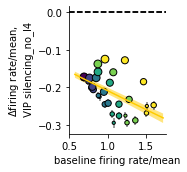

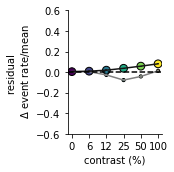

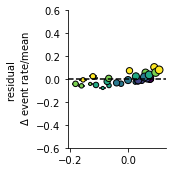

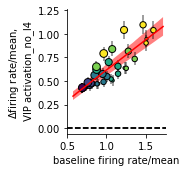

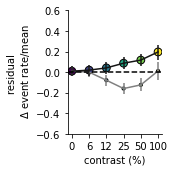

...

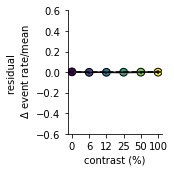

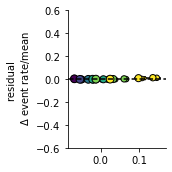

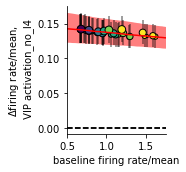

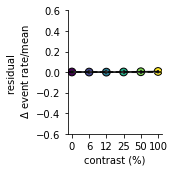

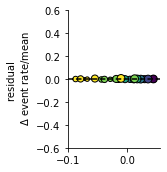

In [194]:
save_fig = True

reload(ut)
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0
itype2 = 2

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
reload(opto_utils)

light_lbls = ['silencing_no_l4','activation_no_l4']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    # L4 sim: linspace(0,1,21)
    # no L4 sim: linspace(-1.5,1.5,31)
    ioffset = int(np.round(np.mean(target_bin[lkat]))) // 2 #np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ihigh = ibaseline + ioffset
    ilow = ibaseline - ioffset #30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    zdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype2].reshape((-1,6,6))
    zdata_norm = zdata/zdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([0,0],[ibaseline,ibaseline],light_lbls,cs,ylims):
    for idir,ilight,light_lbl,c,ylim in zip([0,0],[ilow,ihigh],light_lbls,cs,ylims):
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[0,0],light_lbls,cs,ylims):

        plt.figure(figsize=(2.5,2.5))
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        wdata = network_resps[idir][iconn][lkat][:,:,:,itype2][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        wdata_norm = wdata/wdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#         sca.scatter_size_contrast_errorbar(xdata_norm,ydata_norm-xdata_norm,equality_line=False,square=False)
        opto_utils.scatter_size_contrast_x_dx_errorbar(np.concatenate((xdata_norm[:,:,:,np.newaxis],ydata_norm[:,:,:,np.newaxis]),axis=-1),opto_color=c)
        plt.axhline(0,c='k',linestyle='dashed')
    #     ut.zero_origin('x')
        plt.xlabel('baseline firing rate/mean')
        plt.ylabel('$\Delta$firing rate/mean, \n VIP %s'%light_lbl)
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        xs = np.array((xdata_norm.min(),xdata_norm.max()))
#         plt.plot(xs,slope*xs+intercept,c=c,linestyle='dashed')
    #     plt.ylim(ylim)
        plt.xlim((0.5,1.75))
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/delta_rate_vs_rate_no_l4_%s_%s.jpg'%(light_lbl,conn_lbls[iconn]),dpi=300)

        plt.figure(figsize=(2.5,2.5))
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        these_sizes = [0,5]
#         ut.plot_parametric_fn_errorbars(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],fit_fn=nra.fit_opt_params_two_asymptote_fn,plot_fn=nra.two_asymptote_fn,colors=c_l23[these_sizes],markersize=0,errorstyle='bs')
        ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
        xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
        for this_size in these_sizes:
            sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
        plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/residual_delta_rate_vs_contrast_no_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

        plt.figure(figsize=(2.5,2.5))
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        slope2, intercept2, r_value, p_value, std_err = sst.linregress((wdata_norm-zdata_norm).flatten(), (ydata_norm-xdata_norm).flatten())
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        pred2 = slope2*(wdata_norm-zdata_norm) + intercept2
        residual2 = (wdata_norm-zdata_norm)#actual - pred2
        these_sizes = [0,5]
        sca.scatter_size_contrast_errorbar(residual2,residual,equality_line=False,square=False)
#         ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
#         plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
#         plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if False:
            plt.savefig('figures/residual_delta_rate_vs_contrast_no_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.053195811778035104
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.09151606730831917
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.009896767838997027
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.046376482520784384
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.1352390638749891
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.033998891250112157
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.1581910736619941
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:97: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


0.018836810043727805
linewidth: 1
plotting
linewidth: 1
plotting


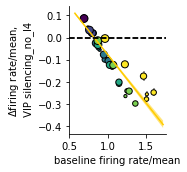

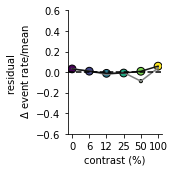

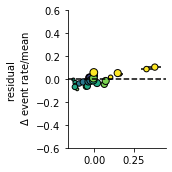

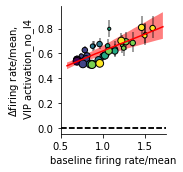

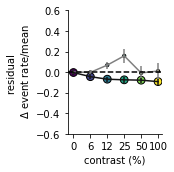

...

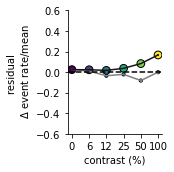

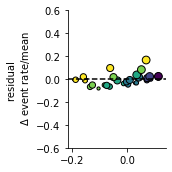

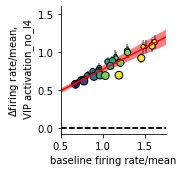

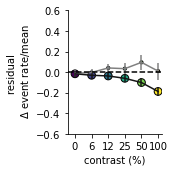

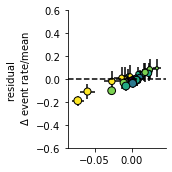

In [197]:
save_fig = True

reload(ut)
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0
itype2 = 2

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
reload(opto_utils)

light_lbls = ['silencing_no_l4','activation_no_l4']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    # L4 sim: linspace(0,1,21)
    # no L4 sim: linspace(-1.5,1.5,31)
    ioffset = int(np.round(np.mean(target_bin[lkat]))) // 2 #np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ihigh = ibaseline + ioffset
    ilow = ibaseline - ioffset #30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    zdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype2].reshape((-1,6,6))
    zdata_norm = zdata/zdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([0,0],[ibaseline,ibaseline],light_lbls,cs,ylims):
#     for idir,ilight,light_lbl,c,ylim in zip([0,0],[ilow,ihigh],light_lbls,cs,ylims):
    for idir,ilight,light_lbl,c,ylim in zip([1,2],[0,0],light_lbls,cs,ylims):

        plt.figure(figsize=(2.5,2.5))
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        wdata = network_resps[idir][iconn][lkat][:,:,:,itype2][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        wdata_norm = wdata/wdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#         sca.scatter_size_contrast_errorbar(xdata_norm,ydata_norm-xdata_norm,equality_line=False,square=False)
        opto_utils.scatter_size_contrast_x_dx_errorbar(np.concatenate((xdata_norm[:,:,:,np.newaxis],ydata_norm[:,:,:,np.newaxis]),axis=-1),opto_color=c)
        plt.axhline(0,c='k',linestyle='dashed')
    #     ut.zero_origin('x')
        plt.xlabel('baseline firing rate/mean')
        plt.ylabel('$\Delta$firing rate/mean, \n VIP %s'%light_lbl)
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        xs = np.array((xdata_norm.min(),xdata_norm.max()))
#         plt.plot(xs,slope*xs+intercept,c=c,linestyle='dashed')
    #     plt.ylim(ylim)
        plt.xlim((0.5,1.75))
        ut.erase_top_right()
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/delta_rate_vs_rate_only_l4_%s_%s.jpg'%(light_lbl,conn_lbls[iconn]),dpi=300)

        plt.figure(figsize=(2.5,2.5))
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        these_sizes = [0,5]
#         ut.plot_parametric_fn_errorbars(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],fit_fn=nra.fit_opt_params_two_asymptote_fn,plot_fn=nra.two_asymptote_fn,colors=c_l23[these_sizes],markersize=0,errorstyle='bs')
        ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
        xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
        for this_size in these_sizes:
            sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
        plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if save_fig:
            plt.savefig('figures/residual_delta_rate_vs_contrast_only_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

        plt.figure(figsize=(2.5,2.5))
        slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())
        slope2, intercept2, r_value, p_value, std_err = sst.linregress((wdata_norm-zdata_norm).flatten(), (ydata_norm-xdata_norm).flatten())
        pred = slope*xdata_norm + intercept
        actual = (ydata_norm-xdata_norm)
        residual = actual - pred
        pred2 = slope2*(wdata_norm-zdata_norm) + intercept2
        residual2 = (wdata_norm-zdata_norm)#actual - pred2
        these_sizes = [0,5]
        sca.scatter_size_contrast_errorbar(residual2,residual,equality_line=False,square=False)
#         ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
        plt.axhline(0,c='k',linestyle='dashed')
#         plt.xticks(np.arange(this_ncontrast),ucontrast)
        ut.erase_top_right()
#         plt.xlabel('contrast (%)')
        plt.ylabel('residual \n $\Delta$ event rate/mean')
        plt.ylim((-0.6,0.6))
#         plt.ylim((-0.2,0.2))
        plt.tight_layout()
        if False:
            plt.savefig('figures/residual_delta_rate_vs_contrast_only_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


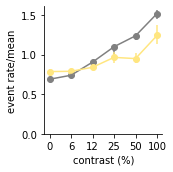

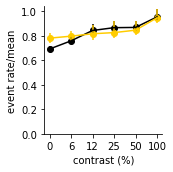

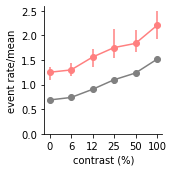

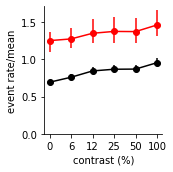

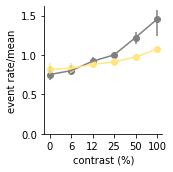

...

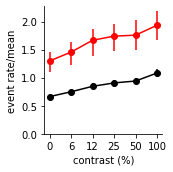

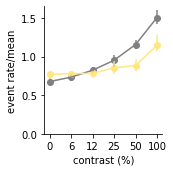

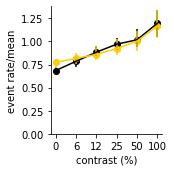

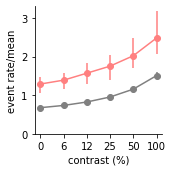

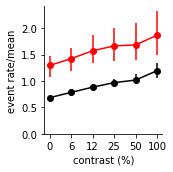

In [126]:
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils

light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
        these_sizes = [0,5]
        bfactors = [0.5,1]
        for this_size,bfactor in zip(these_sizes,bfactors):
            plt.figure(figsize=(2.5,2.5))
            ut.plot_pct_errorbars_hillel(np.arange(6),xdata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-np.array((0,0,0))[np.newaxis]),pct=(16,84))#,markersize=10)
            ut.plot_pct_errorbars_hillel(np.arange(6),ydata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-cs[idir-1][np.newaxis]),pct=(16,84))#,markersize=2)
            plt.xticks(np.arange(6),ucontrast)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
#         plt.axhline(0,c='k',linestyle='dashed')
#             plt.xticks(np.arange(this_ncontrast),ucontrast)
            plt.gca().set_ylim(bottom=0)
            ut.erase_top_right()
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean')
#         plt.ylim((-1,0.5))
#         plt.ylim((-0.2,0.2))
            plt.tight_layout()
#             plt.savefig('figures/pc_rate_vs_contrast_size_%d_l4_%s_%s.eps'%(this_size,light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


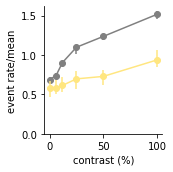

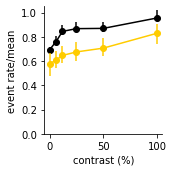

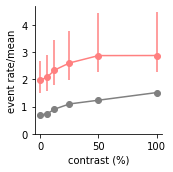

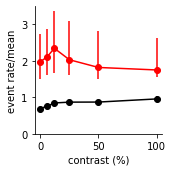

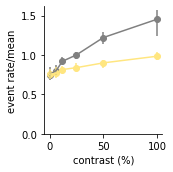

...

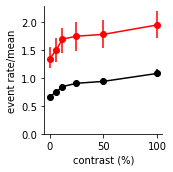

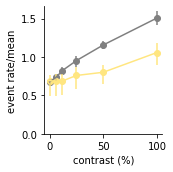

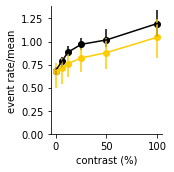

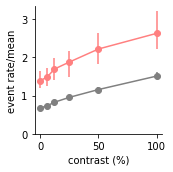

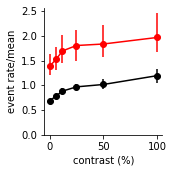

In [183]:
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils

light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
        these_sizes = [0,5]
        bfactors = [0.5,1]
        for this_size,bfactor in zip(these_sizes,bfactors):
            plt.figure(figsize=(2.5,2.5))
            ut.plot_pct_errorbars_hillel(ucontrast,xdata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-np.array((0,0,0))[np.newaxis]),pct=(16,84))#,markersize=10)
            ut.plot_pct_errorbars_hillel(ucontrast,ydata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-cs[idir-1][np.newaxis]),pct=(16,84))#,markersize=2)
#             plt.xticks(np.arange(6),ucontrast)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
#         plt.axhline(0,c='k',linestyle='dashed')
#             plt.xticks(np.arange(this_ncontrast),ucontrast)
            plt.gca().set_ylim(bottom=0)
            ut.erase_top_right()
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean')
#         plt.ylim((-1,0.5))
#         plt.ylim((-0.2,0.2))
            plt.tight_layout()
#             plt.savefig('figures/pc_rate_vs_linear_contrast_size_%d_l4_%s_%s.eps'%(this_size,light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


In [ ]:
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 1

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils

light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
        these_sizes = [0,5]
        bfactors = [0.5,1]
        for this_size,bfactor in zip(these_sizes,bfactors):
            plt.figure(figsize=(2.5,2.5))
            ut.plot_pct_errorbars_hillel(ucontrast,xdata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-np.array((0,0,0))[np.newaxis]),pct=(16,84))#,markersize=10)
            ut.plot_pct_errorbars_hillel(ucontrast,ydata_norm[:,this_size:this_size+1],colors=1-bfactor*(1-cs[idir-1][np.newaxis]),pct=(16,84))#,markersize=2)
#             plt.xticks(np.arange(6),ucontrast)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
#         plt.axhline(0,c='k',linestyle='dashed')
#             plt.xticks(np.arange(this_ncontrast),ucontrast)
            plt.gca().set_ylim(bottom=0)
            ut.erase_top_right()
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean')
#         plt.ylim((-1,0.5))
#         plt.ylim((-0.2,0.2))
            plt.tight_layout()
            plt.savefig('figures/sst_rate_vs_linear_contrast_size_%d_l4_%s_%s.eps'%(this_size,light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


In [240]:
conn_lbls

['baseline',
 'pcpc_deleted',
 'pcpv_deleted',
 'pcvip_deleted',
 'pcsst_deleted',
 '']

In [267]:
this_lkat.sum()

73

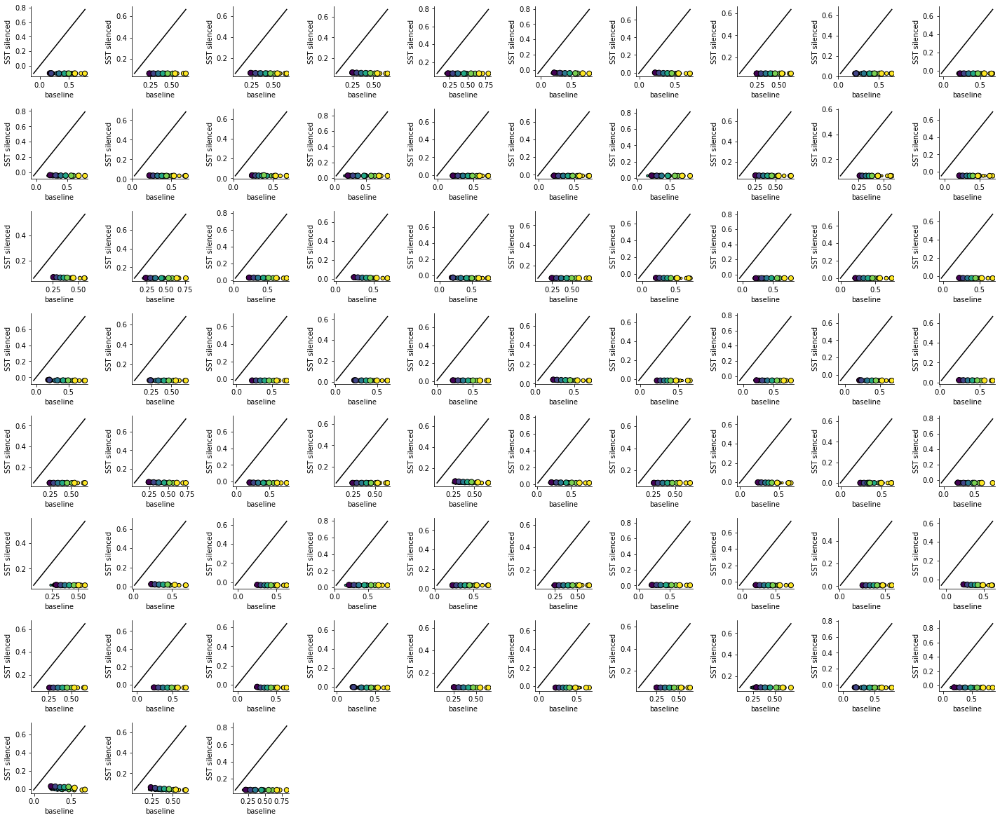

In [270]:
plt.figure(figsize=(20,20))
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
this_lkat = lkat & (network_resps[0][4][:,15,:,1].max(1) < 0.1)
for i in range(this_lkat.sum()):
    plt.subplot(10,10,i+1)
    sca.scatter_size_contrast(network_resps[0][0][this_lkat][i,15,:,1].reshape((6,6)),network_resps[0][4][this_lkat][i,15,:,1].reshape((6,6)))
#     sca.scatter_size_contrast_errorbar(network_resps[0][0][lkat][:,15,:,0].reshape((-1,6,6)),network_resps[0][4][lkat][:,15,:,0].reshape((-1,6,6)))
    ut.erase_top_right()
    plt.xlabel('baseline')
    plt.ylabel('SST silenced')
plt.tight_layout()
plt.savefig('figures/sst_silence_scatter_sst_size_contrast.eps')

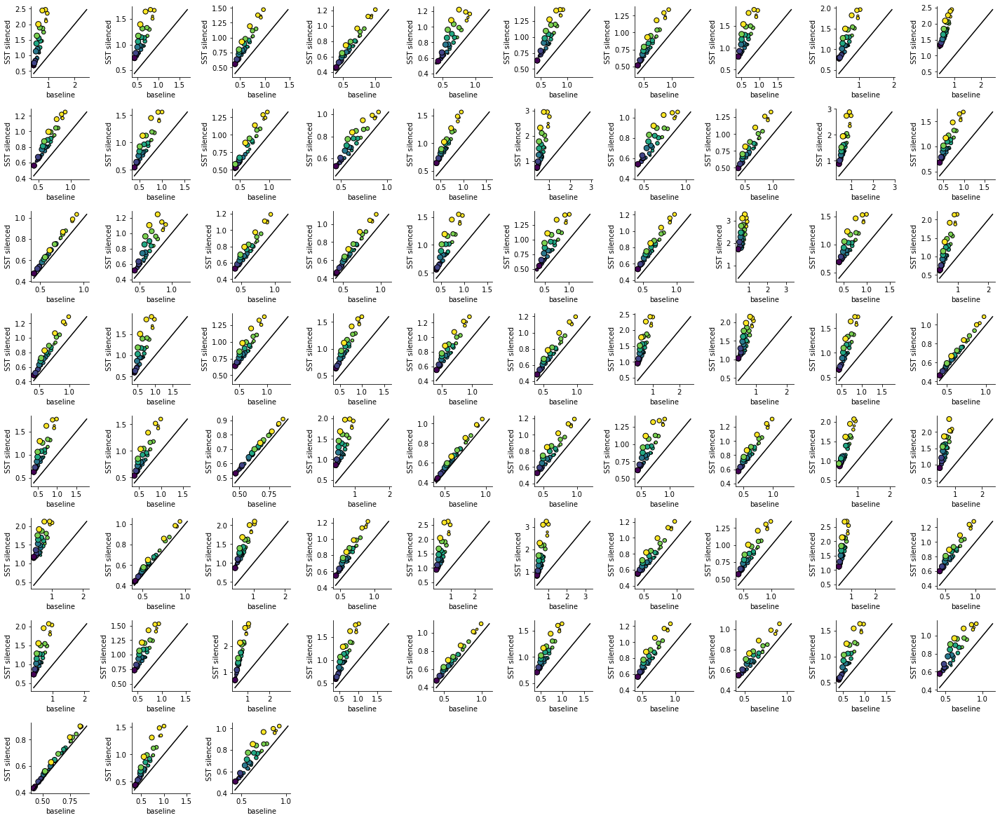

In [269]:
plt.figure(figsize=(20,20))
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
this_lkat = lkat & (network_resps[0][4][:,15,:,1].max(1) < 0.1)
for i in range(this_lkat.sum()):
    plt.subplot(10,10,i+1)
    sca.scatter_size_contrast(network_resps[0][0][this_lkat][i,15,:,0].reshape((6,6)),network_resps[0][4][this_lkat][i,15,:,0].reshape((6,6)))
#     sca.scatter_size_contrast_errorbar(network_resps[0][0][lkat][:,15,:,0].reshape((-1,6,6)),network_resps[0][4][lkat][:,15,:,0].reshape((-1,6,6)))
    ut.erase_top_right()
    plt.xlabel('baseline')
    plt.ylabel('SST silenced')
plt.tight_layout()
plt.savefig('figures/sst_silence_scatter_pc_size_contrast.eps')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


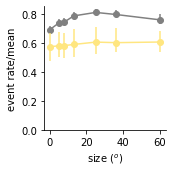

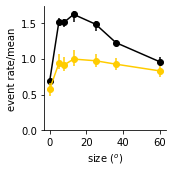

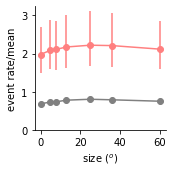

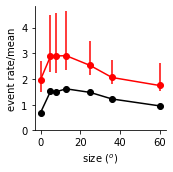

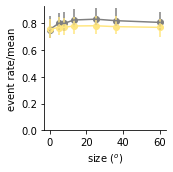

...

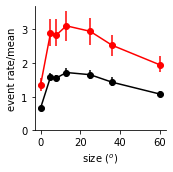

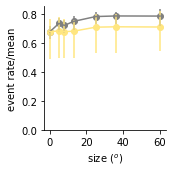

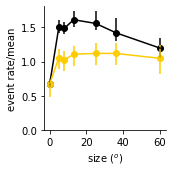

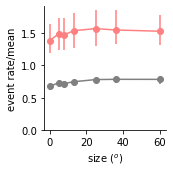

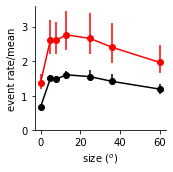

In [182]:
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils

light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
# lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

usize0 = np.concatenate(((0,),usize))

for iconn in [0,2,3,4]:

#     ilow = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
    ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
    ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
    idir = 0
    xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
    xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
    for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
        ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
        ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
        these_contrasts = [1,5]
        bfactors = [0.5,1]
        xsize_tuning = sim_utils.gen_size_tuning(xdata_norm)
        ysize_tuning = sim_utils.gen_size_tuning(ydata_norm)
        for this_contrast,bfactor in zip(these_contrasts,bfactors):
            plt.figure(figsize=(2.5,2.5))
            ut.plot_pct_errorbars_hillel(usize0,xsize_tuning[:,:,this_contrast:this_contrast+1].transpose((0,2,1)),colors=1-bfactor*(1-np.array((0,0,0))[np.newaxis]),pct=(16,84))#,markersize=10)
            ut.plot_pct_errorbars_hillel(usize0,ysize_tuning[:,:,this_contrast:this_contrast+1].transpose((0,2,1)),colors=1-bfactor*(1-cs[idir-1][np.newaxis]),pct=(16,84))#,markersize=2)
#             plt.xticks(np.arange(6),usize)
#         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#         for this_size in these_sizes:
#             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
#         plt.axhline(0,c='k',linestyle='dashed')
#             plt.xticks(np.arange(this_ncontrast),ucontrast)
            plt.gca().set_ylim(bottom=0)
            ut.erase_top_right()
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate/mean')
#         plt.ylim((-1,0.5))
#         plt.ylim((-0.2,0.2))
            plt.tight_layout()
#             plt.savefig('figures/pc_rate_vs_size_contrast_%d_l4_%s_%s.eps'%(this_contrast,light_lbl,conn_lbls[iconn]))

    # plt.figure(figsize=(2.5,2.5))
    # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
    # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
    # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    # plt.axhline(0,c='k',linestyle='dashed')
    # ut.zero_origin('x')


In [169]:
network_resps[idir][iconn].shape

(94, 21, 36, 8)

In [120]:
# def preprocess(*args,average=True):
#     if average:
#         return tuple([np.nanmean(arg,0)[np.newaxis] for arg in args])
#     else:
#         return args

In [173]:
# def plot_mimi_bars_with_lines(xdata_norm,ydata_norm,mi_fn=scf.smi_fn,first_ind=0,c=None,average=False):
#     # make a bar plot, one black bar indicating metric with light off (calculated on xdata_norm)
#     # and one colorful bar (c) indicating metric with light on (calculated on ydata_norm)
#     # transparent lines indicate individual model fits
#     # metric is computed using mi_fn
#     # first_ind refers to the first index to use when computing the modulation index on the metric (here, slope)
#     # 'average' indicates whether to average across model fits before plotting
#     mi = np.stack([mi_fn(x[:,:,:,np.newaxis]) for x in preprocess(xdata_norm,ydata_norm,average=average)],axis=-1)
#     mimis = scof.compute_slopes(mi,first_ind=first_ind)
#     plt.figure(figsize=(2.5,2.5))
#     colors = [np.array((0,0,0))[np.newaxis],c[np.newaxis]]
#     ut.plot_bars_with_lines(mimis,colors=colors,alpha=0.05,errorstyle='pct')
#     ut.erase_top_right()
#     _,p = sst.wilcoxon(mimis[:,0],mimis[:,1])
#     print(p)

# def plot_mi_errorbars(xdata_norm,ydata_norm,mi_fn=scf.smi_fn,first_ind=0,c=None,average=False):
#     # make error bar plot, one black curve indicating metric with light off (calculated on xdata_norm)
#     # and one colorful curve (c) indicating metric with light on (calculated on ydata_norm)
#     # metric is computed using mi_fn
#     # first_ind refers to the first index to use when plotting the metric
#     # 'average' indicates whether to average across model fits before plotting
#     rg = slice(first_ind,None)
#     mis = [mi_fn(x[:,:,:,np.newaxis]) for x in preprocess(xdata_norm,ydata_norm,average=average)]
#     plt.figure(figsize=(2.5,2.5))
#     colors = [np.array((0,0,0))[np.newaxis],c[np.newaxis]]
#     for mi,color in zip(mis,colors):
#         to_plot = mi[:,np.newaxis,rg]
#         ut.plot_pct_errorbars_hillel(np.arange(to_plot.shape[2]),to_plot,colors=color,pct=(16,84))#,markersize=10)
#     ut.erase_top_right()
    
# def plot_smi_errorbars(xdata_norm,ydata_norm,c=None):
#     # run plot_mi_errorbars using SMI as the metric
#     ucontrast = np.array((0,6,12,25,50,100))
#     first_ind = 1
#     plot_mi_errorbars(xdata_norm,ydata_norm,mi_fn=scf.smi_fn,first_ind=first_ind,c=c)
#     plt.xticks(np.arange(len(ucontrast[first_ind:])),ucontrast[first_ind:])
#     plt.xlabel('contrast (%)')
#     plt.ylabel('SMI')
#     plt.tight_layout()
    
# def plot_csi_errorbars(xdata_norm,ydata_norm,c=None):
#     # run plot_mi_errorbars using CSI as the metric
#     usize = np.array((5,8,13,25,36,60))
#     first_ind = 0
#     plot_mi_errorbars(xdata_norm,ydata_norm,mi_fn=scf.csi_fn,first_ind=first_ind,c=c)
#     plt.xticks(np.arange(len(usize[first_ind:])),usize[first_ind:])
#     plt.xlabel('size ($^o$)')
#     plt.ylabel('CSI')
#     plt.tight_layout()
    
# def plot_smimi_bars_with_lines(xdata_norm,ydata_norm,c=None):
#     # run plot_mimi_bars_with_lines using SMI as the metric
#     first_ind = 1
#     plot_mimi_bars_with_lines(xdata_norm,ydata_norm,mi_fn=scf.smi_fn,first_ind=first_ind,c=c)
#     plt.ylabel('slope, SMI vs. contrast')
#     plt.tight_layout()
    
# def plot_csimi_bars_with_lines(xdata_norm,ydata_norm,c=None):
#     # run plot_mimi_bars_with_lines using CSI as the metric
#     first_ind = 0
#     plot_mimi_bars_with_lines(xdata_norm,ydata_norm,mi_fn=scf.csi_fn,first_ind=first_ind,c=c)
#     plt.ylabel('slope, CSI vs. size')
#     plt.tight_layout()
    
# def run_mi_plotting(network_resps,target_bin,plot_mi_fn=plot_smi_errorbars,plot_mi_lbl='pc_smi_vs_contrast_l4',ext='eps'):
#     # run a plotting function e.g. plot_mi_errorbars, or plot_mimi_bars_with_lines
#     # on each of many opto stim directions, and many perturbations of the modeled network
#     # with a given desired metric, plotting the outcome of that metric on PCs
#     # network_resps a list of lists, opto stim direction x perturbation x (fit x size x contrast x cell type)
#     # save the figure, indicating the type of plot, opto stim direction, perturbation, filename and extension
#     idir = 2
#     lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
#     light_lbls = ['silencing','activation']
#     conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']
#     cs = [np.array((1,0.8,0)),np.array((1,0,0))]
#     for iconn in [0,2,3,4]:
#         ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#         ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#         idir = 0
#         xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#         xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#         for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#             ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#             ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#             plot_mi_fn(xdata_norm,ydata_norm,c=cs[idir-1])
#             if ext == 'jpg':
#                 plt.savefig('figures/%s_%s_%s.%s'%(plot_mi_lbl,light_lbl,conn_lbls[iconn],ext),dpi=300)
#             else:
#                 plt.savefig('figures/%s_%s_%s.%s'%(plot_mi_lbl,light_lbl,conn_lbls[iconn],ext))
            

In [237]:
this_scsstanimal = np.stack((xdata_norm,ydata_norm),axis=3)

WilcoxonResult(statistic=841.0, pvalue=2.0135300664359745e-06)


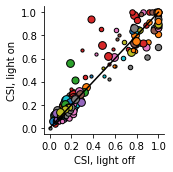

In [238]:
cmax = 6
csisst = np.zeros((this_scsstanimal.shape[0],this_scsstanimal.shape[1],this_scsstanimal.shape[3]))
for ilight in range(2):
    csisst[:,:,ilight] = scf.csi_fn(this_scsstanimal[:,:,:cmax,ilight:ilight+1])#,sem=semsstanimal)
to_plot = csisst.copy()
plt.figure(figsize=(2.5,2.5))
noise = 0e-3
cs = ['C%d'%iexpt for iexpt in range(to_plot.shape[0])]
for iexpt in range(to_plot.shape[0]):
    for isize in range(to_plot.shape[1]):
        plt.scatter(to_plot[iexpt,isize,0]+noise*np.random.randn(1),to_plot[iexpt,isize,1]+noise*np.random.randn(1),s=10*(isize+1),c=cs[iexpt],edgecolor='k')
plt.plot((0,1),(0,1),c='k')
plt.xticks(np.linspace(0,1,6))
plt.yticks(np.linspace(0,1,6))
ut.erase_top_right()
plt.xlabel(r'CSI, light off')
plt.ylabel(r'CSI, light on')
plt.tight_layout()
# plt.savefig('figures/halo_sst_csi_light_on_light_off.eps')
print(sst.wilcoxon(to_plot[:,:,0].mean(1),to_plot[:,:,1].mean(1)))

WilcoxonResult(statistic=355.0, pvalue=1.5790730776085895e-11)
WilcoxonResult(statistic=862.0, pvalue=3.0690466236127136e-06)
WilcoxonResult(statistic=1290.0, pvalue=0.003556185003771515)
WilcoxonResult(statistic=344.0, pvalue=1.1572937762862062e-11)
WilcoxonResult(statistic=1226.0, pvalue=0.0014885549037437615)
WilcoxonResult(statistic=1054.0, pvalue=0.00010419410179762839)
WilcoxonResult(statistic=1591.0, pvalue=0.09226366959803117)


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:786: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,:,1]/np.nanmax(this_data,2)


WilcoxonResult(statistic=1494.0, pvalue=0.03748580406148192)


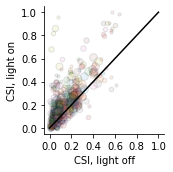

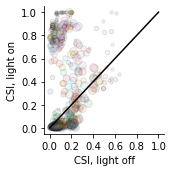

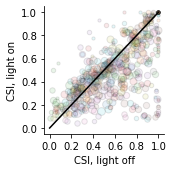

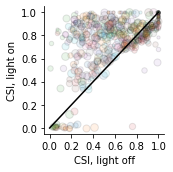

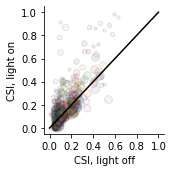

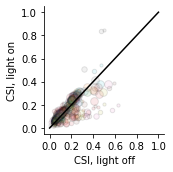

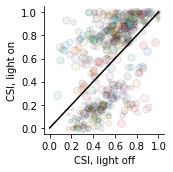

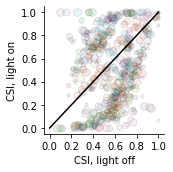

In [239]:
reload(scof)
opt = {'alpha':0.1}
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.scatter_csi,plot_mi_lbl='sst_csi_light_on_light_off_l4',ext='jpg',iconns=iconns,itype=1,opt=opt)

In [69]:
import size_contrast_opto_figures as scof

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


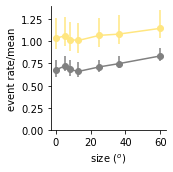

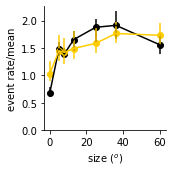

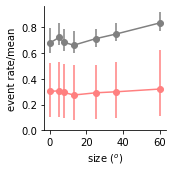

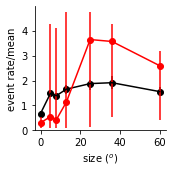

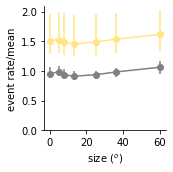

...

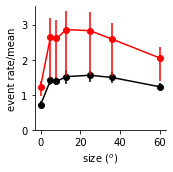

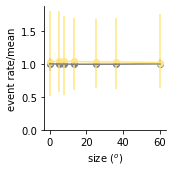

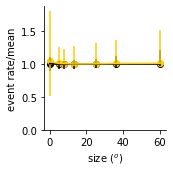

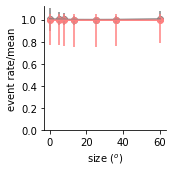

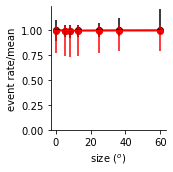

In [76]:
reload(scof)
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_size_tuning_errorbars,plot_mi_lbl='sst_rate_vs_size_contrast_%d_l4',ext='eps',iconns=iconns,itype=1)

In [124]:
itype = 0

# this_target_amplitude = params[:,23,0,0]
this_target_amplitude = np.nanmean(params[:,5::6,0,0],axis=1)
# this_target_amplitude = np.nanmean(params[:,:,0,0],axis=1)
this_target_bin = np.maximum(np.digitize(this_target_amplitude,opto_levels)-1,0)
iconns = [0,2,3,4]


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/size_contrast_opto_figures.py:168: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(2.5,2.5))
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all po

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
2.018218898667822e-10
1.7671127112657224e-11
5.2090890061232615e-09
5.105830725195655e-08
2.8277308981487558e-15
0.03637529288343547
1.0380826542336431e-13
1.701718689701946e-08
2.5509729516632515e-16
2.054682159835256e-06
0.06897412354460483
0.0043774183020413564
2.399316012629298e-15
2.2739813051871513e-11
2.9220437425273093e-15


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


1.3294298550543367e-05
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
(89, 7, 6)
(89, 7, 6)
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
WilcoxonResult(statistic=355.0, pvalue=1.5790730776085895e-11)
WilcoxonResult(statistic=862.0, pvalue=3.0690466236127136e-06)
WilcoxonResult(statistic=1290.0, pvalue=0.003556185003771515)
WilcoxonResult(statistic=344.0, pvalue=1.1572937762862062e-11)
WilcoxonResult(statistic=1226.0, pvalue=0.0014885549037437615)
WilcoxonResult(statistic=1054.0, pvalue=0.00010419410179762839)
WilcoxonResult(statistic=1591.0, pvalue=0.09226366959803117)


/Users/dan/Documents/code/adesnal/size_contrast_figures.py:524: RuntimeWarning: invalid value encountered in true_divide
  return this_data[:,:,1]/np.nanmax(this_data,2)


WilcoxonResult(statistic=1494.0, pvalue=0.03748580406148192)


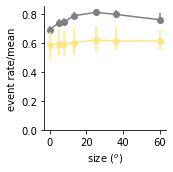

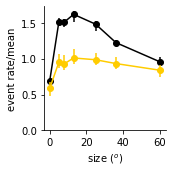

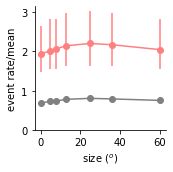

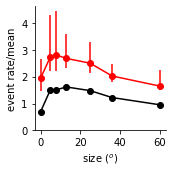

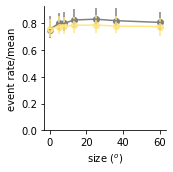

...

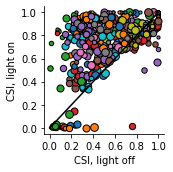

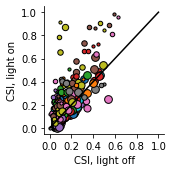

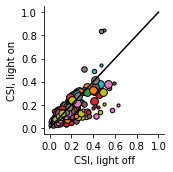

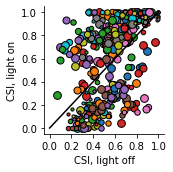

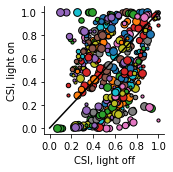

In [70]:
# ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

itype = 0

# this_target_amplitude = params[:,23,0,0]
this_target_amplitude = np.nanmean(params[:,5::6,0,0],axis=1)
# this_target_amplitude = np.nanmean(params[:,:,0,0],axis=1)
this_target_bin = np.maximum(np.digitize(this_target_amplitude,opto_levels)-1,0)
# this_target_bin = np.digitize(target_amplitude,opto_levels)-1

# ucontrast = np.array((0,6,12,25,50,100))
# usize = np.array((5,8,13,25,36,60))
# this_nsize = len(usize)
# this_ncontrast = len(ucontrast)
# cfrac = np.linspace(1,0,this_nsize+1)[:-1]
# c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
import size_contrast_figures as scf
reload(scof)
reload(scf)

# light_lbls = ['silencing','activation']
# conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

# cs = [np.array((1,0.8,0)),np.array((1,0,0))]
iconns = [0,2,3,4]
# iconns = [0]

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_size_tuning_errorbars,plot_mi_lbl='pc_rate_vs_size_contrast_%d_l4',ext='eps',iconns=iconns)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_contrast_tuning_errorbars,plot_mi_lbl='pc_rate_vs_contrast_size_%d_l4',ext='eps',iconns=iconns)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_smi_errorbars,plot_mi_lbl='pc_smi_vs_contrast_l4',ext='eps',iconns=iconns)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_csi_errorbars,plot_mi_lbl='pc_c50_vs_size_l4',ext='eps',iconns=iconns)

opt = {'xaxis':ucontrast,'norm_to_max':True}
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_smimi_bars_with_lines,
                     plot_mi_lbl='pc_delta_smi_l4',ext='jpg',iconns=iconns,**opt)

opt = {'xaxis':usize,'norm_to_max':True}
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_csimi_bars_with_lines,
                     plot_mi_lbl='pc_delta_c50_l4',ext='jpg',iconns=iconns,**opt)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_size_tuning_errorbars,plot_mi_lbl='sst_rate_vs_size_contrast_%d_l4',ext='eps',iconns=iconns,itype=1)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_contrast_tuning_errorbars,plot_mi_lbl='sst_rate_vs_contrast_size_%d_l4',ext='eps',iconns=iconns,itype=1)

scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.scatter_csi,plot_mi_lbl='sst_csi_light_on_light_off_l4',ext='eps',iconns=iconns,itype=1)

# # ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

# idir = 2
# # lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
# lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# # lkat = np.ones_like(lkat)

# for iconn in [0,2,3,4]:
#     ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#     ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#     idir = 0
#     xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#     xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#         ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#         ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
#         smis = [scf.smi_fn(x[:,:,:,np.newaxis]) for x in preprocess(xdata_norm,ydata_norm,average=False)]
#         plt.figure(figsize=(2.5,2.5))
#         colors = [np.array((0,0,0))[np.newaxis],cs[idir-1][np.newaxis]]
#         for smi,color in zip(smis,colors):
#             ut.plot_pct_errorbars_hillel(np.arange(1,6),smi[:,np.newaxis,1:],colors=color,pct=(16,84))#,markersize=10)
#         plt.xticks(np.arange(len(ucontrast[rg])),ucontrast[rg])
#         ut.erase_top_right()
#         plt.xlabel('contrast (%)')
#         plt.ylabel('SMI')
#         plt.tight_layout()
# #         plt.savefig('figures/pc_smi_vs_contrast_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

p-value: 2.475110312161136e-09
64/89 higher
p-value: 8.464910503033258e-12
14/89 higher
p-value: 3.003877541971129e-10
68/89 higher
p-value: 8.08351430033266e-09
18/89 higher
p-value: 8.276783852872205e-15
80/89 higher
p-value: 0.01895734064093258
33/89 higher
p-value: 2.8574202100962303e-13
75/89 higher
p-value: 5.3385601418658056e-09
20/89 higher


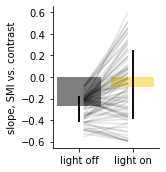

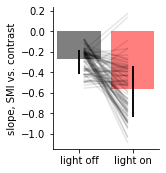

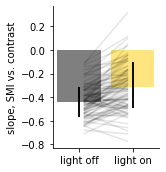

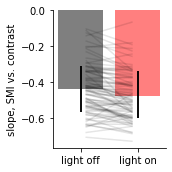

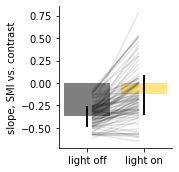

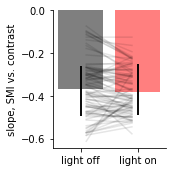

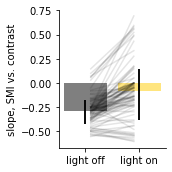

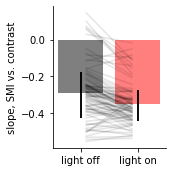

In [109]:
reload(scof)
reload(scf)
opt = {'xaxis':np.array(ucontrast),'norm_to_max':True,'save':False}
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_smimi_bars_with_lines,
                     plot_mi_lbl='pc_delta_smi_l4',ext='jpg',iconns=iconns,opt=opt)

# opt = {'xaxis':np.array(usize),'norm_to_max':True,'save':False}
# scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.plot_csimi_bars_with_lines,
#                      plot_mi_lbl='pc_delta_c50_l4',ext='jpg',iconns=iconns,opt=opt)

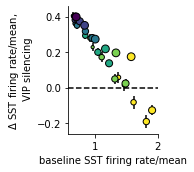

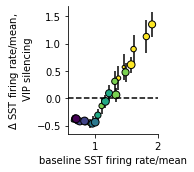

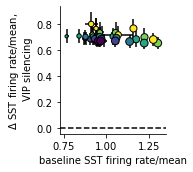

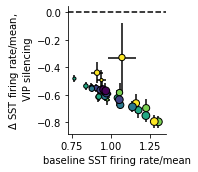

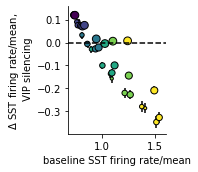

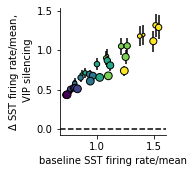

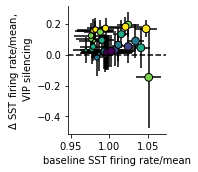

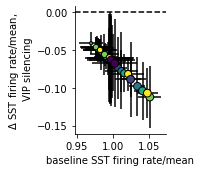

In [166]:
reload(scof)

opt = {'ylim':None}
scof.run_mi_plotting(network_resps,this_target_bin,plot_mi_fn=scof.scatter_size_contrast_x_dx,
                     plot_mi_lbl='sim_sst_delta_vip_halo',ext='eps',iconns=iconns,itype=1,opt=opt)

In [172]:
# ibaseline = 15
# # ilow = 5
# # ihigh = 5
# # ibaseline = 1
# # ilow = 0
# # ihigh = 2

# itype = 0

# ucontrast = np.array((0,6,12,25,50,100))
# usize = np.array((5,8,13,25,36,60))
# this_nsize = len(usize)
# this_ncontrast = len(ucontrast)
# cfrac = np.linspace(1,0,this_nsize+1)[:-1]
# c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

# import scipy.stats as sst
# import opto_utils
# import size_contrast_opto_figures as scof

# light_lbls = ['silencing','activation']
# conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

# cs = [np.array((1,0.8,0)),np.array((1,0,0))]

# ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

# idir = 2
# # lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
# lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# # lkat = np.ones_like(lkat)

# for iconn in [0,2,3,4]:

# #     ilow = 5*np.ones((lkat.sum(),),dtype='int')
# #     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#     ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#     idir = 0
#     xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#     xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#         ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#         ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
# #         these_datas = [x - x.min(1).min(1)[:,np.newaxis,np.newaxis] for x in [xdata_norm,ydata_norm]]
# #         smis = [x[:,-1,:]/np.max(x,1) for x in these_datas]
# #         smimis = np.concatenate([smi[:,0:1]-smi[:,5:6] for smi in smis],axis=1)
#         smi = np.stack([scf.smi_fn(x[:,:,:,np.newaxis]) for x in preprocess(xdata_norm,ydata_norm,average=False)],axis=-1)
#         smimis = scof.compute_slopes(smi,first_ind=1)
#         plt.figure(figsize=(2.5,2.5))
#         colors = [np.array((0,0,0))[np.newaxis],cs[idir-1][np.newaxis]]
#         ut.plot_bars_with_lines(smimis,colors=colors,alpha=0.05,errorstyle='pct')
# #         plt.ylabel(r'$\Delta$ SMI')
#         plt.ylabel('slope, SMI vs. contrast')
#         _,p = sst.wilcoxon(smimis[:,0],smimis[:,1])
#         print(p)
# #         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
# #         for this_size in these_sizes:
# #             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
# #         plt.axhline(0,c='k',linestyle='dashed')
# #             plt.xticks(np.arange(this_ncontrast),ucontrast)
# #         plt.gca().set_ylim(bottom=0)
#         ut.erase_top_right()
# #         plt.xlabel('contrast (%)')
# #         plt.ylabel('event rate/mean')
# # #         plt.ylim((-1,0.5))
# #         plt.ylim((-0.2,0.2))
#         plt.tight_layout()
#         plt.savefig('figures/pc_delta_smi_l4_%s_%s.jpg'%(light_lbl,conn_lbls[iconn]),dpi=300)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


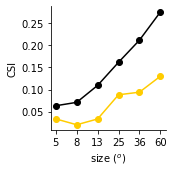

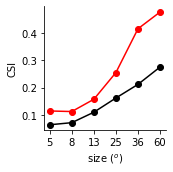

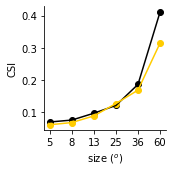

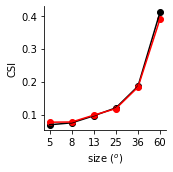

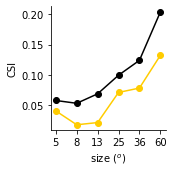

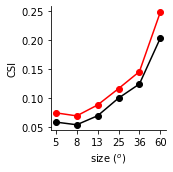

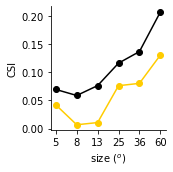

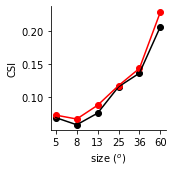

In [130]:
# ibaseline = 15
# # ilow = 5
# # ihigh = 5
# # ibaseline = 1
# # ilow = 0
# # ihigh = 2

# itype = 0

# ucontrast = np.array((0,6,12,25,50,100))
# usize = np.array((5,8,13,25,36,60))
# this_nsize = len(usize)
# this_ncontrast = len(ucontrast)
# cfrac = np.linspace(1,0,this_nsize+1)[:-1]
# c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

# import scipy.stats as sst
# import opto_utils
# import size_contrast_figures as scf

# light_lbls = ['silencing','activation']
# conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

# cs = [np.array((1,0.8,0)),np.array((1,0,0))]

# ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

# idir = 2
# # lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
# # lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0]])
# lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# # lkat = np.ones_like(lkat)

# for iconn in [0,2,3,4]:

# #     ilow = 5*np.ones((lkat.sum(),),dtype='int')
# #     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#     ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#     idir = 0
#     xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#     xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#         ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#         ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
# #         these_datas = [x - x.min(1).min(1)[:,np.newaxis,np.newaxis] for x in [xdata_norm,ydata_norm]]
# #         smis = [x[:,-1,:]/np.max(x,1) for x in these_datas]
# #         csis = [scf.csi_fn(x[:,:,:,np.newaxis]) for x in [xdata_norm,ydata_norm]]
#         csis = [scf.csi_fn(x[:,:,:,np.newaxis],subtract_min=True) for x in preprocess(xdata_norm,ydata_norm,average=True)]
#         plt.figure(figsize=(2.5,2.5))
#         colors = [np.array((0,0,0))[np.newaxis],cs[idir-1][np.newaxis]]
#         for csi,color in zip(csis,colors):
#             ut.plot_pct_errorbars_hillel(np.arange(6),csi[:,np.newaxis,:],colors=color,pct=(16,84))#,markersize=10)
#         plt.xticks(np.arange(6),usize)
# #         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
# #         for this_size in these_sizes:
# #             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
# #         plt.axhline(0,c='k',linestyle='dashed')
# #             plt.xticks(np.arange(this_ncontrast),ucontrast)
# #         plt.gca().set_ylim(bottom=0)
#         ut.erase_top_right()
#         plt.xlabel('size ($^o$)')
#         plt.ylabel('CSI')
# #         plt.ylim((-1,0.5))
# #         plt.ylim((-0.2,0.2))
#         plt.tight_layout()

#     #         plt.savefig('figures/pc_c50_vs_size_l4_%s_%s.eps'%(light_lbl,conn_lbls[iconn]))

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0


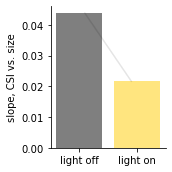

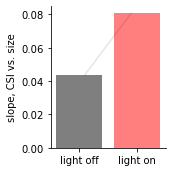

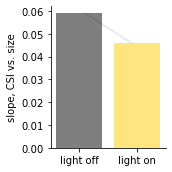

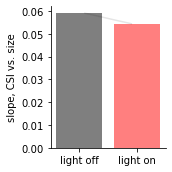

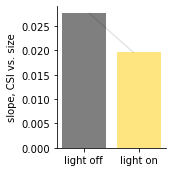

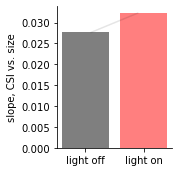

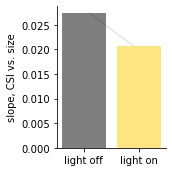

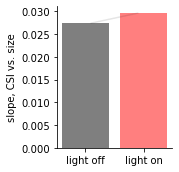

In [131]:
# reload(scf)

# ibaseline = 15
# # ilow = 5
# # ihigh = 5
# # ibaseline = 1
# # ilow = 0
# # ihigh = 2

# itype = 0

# ucontrast = np.array((0,6,12,25,50,100))
# usize = np.array((5,8,13,25,36,60))
# this_nsize = len(usize)
# this_ncontrast = len(ucontrast)
# cfrac = np.linspace(1,0,this_nsize+1)[:-1]
# c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

# import scipy.stats as sst
# import opto_utils
# import size_contrast_opto_figures as scof

# light_lbls = ['silencing','activation']
# conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

# cs = [np.array((1,0.8,0)),np.array((1,0,0))]

# ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

# idir = 2
# # lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
# lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# # lkat = np.ones_like(lkat)

# for iconn in [0,2,3,4]:

# #     ilow = 5*np.ones((lkat.sum(),),dtype='int')
# #     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#     ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#     idir = 0
#     xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#     xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#         ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#         ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
# #         these_datas = [x - x.min(1).min(1)[:,np.newaxis,np.newaxis] for x in [xdata_norm,ydata_norm]]
# #         smis = [x[:,-1,:]/np.max(x,1) for x in these_datas]
# #         smimis = np.concatenate([smi[:,0:1]-smi[:,5:6] for smi in smis],axis=1)
#         csi = np.stack([scf.csi_fn(x[:,:,:,np.newaxis],subtract_min=True) for x in preprocess(xdata_norm,ydata_norm,average=True)],axis=-1)
#         csimis = scof.compute_slopes(csi,first_ind=0)
#         plt.figure(figsize=(2.5,2.5))
#         colors = [np.array((0,0,0))[np.newaxis],cs[idir-1][np.newaxis]]
#         ut.plot_bars_with_lines(csimis,colors=colors,alpha=0.05,errorstyle='pct')
# #         plt.ylabel(r'$\Delta$ SMI')
#         plt.ylabel('slope, CSI vs. size')
#         _,p = sst.wilcoxon(csimis[:,0],csimis[:,1])
#         print(p)
# #         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
# #         for this_size in these_sizes:
# #             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
# #         plt.axhline(0,c='k',linestyle='dashed')
# #             plt.xticks(np.arange(this_ncontrast),ucontrast)
# #         plt.gca().set_ylim(bottom=0)
#         ut.erase_top_right()
# #         plt.xlabel('contrast (%)')
# #         plt.ylabel('event rate/mean')
# # #         plt.ylim((-1,0.5))
# #         plt.ylim((-0.2,0.2))
#         plt.tight_layout()
#         plt.savefig('figures/pc_delta_c50_l4_%s_%s.jpg'%(light_lbl,conn_lbls[iconn]),dpi=300)

In [166]:
# ibaseline = 15
# # ilow = 5
# # ihigh = 5
# # ibaseline = 1
# # ilow = 0
# # ihigh = 2

# itype = 0

# ucontrast = np.array((0,6,12,25,50,100))
# usize = np.array((5,8,13,25,36,60))
# this_nsize = len(usize)
# this_ncontrast = len(ucontrast)
# cfrac = np.linspace(1,0,this_nsize+1)[:-1]
# c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

# import scipy.stats as sst
# import opto_utils

# light_lbls = ['silencing','activation']
# conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

# cs = [np.array((1,0.8,0)),np.array((1,0,0))]

# ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

# idir = 2
# # lkat = (network_resps[idir][0].max(1).max(1).max(1) < 10)
# lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# # lkat = np.ones_like(lkat)

# for iconn in [0,2,3,4]:

# #     ilow = 5*np.ones((lkat.sum(),),dtype='int')
# #     ihigh = 5*np.ones((lkat.sum(),),dtype='int')
#     ihigh = int(np.round(np.mean(target_bin[lkat])))#np.minimum(np.maximum(target_bin[lkat],0),20)#np.maximum(target_bin[lkat]-2,15)#ilight_drmax[2][iconn][lkat]
#     ilow = ihigh#30-ihigh#4#ilight_drmax[1][iconn][lkat]
#     idir = 0
#     xdata = network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
#     xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
#     for idir,ilight,light_lbl,c,ylim in zip([1,2],[ilow,ihigh],light_lbls,cs,ylims):
#         ydata = network_resps[idir][iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
#         ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        
#         these_datas = [x - x.min(1).min(1)[:,np.newaxis,np.newaxis] for x in [xdata_norm,ydata_norm]]
#         smis = [x[:,-1,:]/np.max(x,1) for x in these_datas]
#         plt.figure(figsize=(2.5,2.5))
#         colors = [np.array((0,0,0))[np.newaxis],cs[idir-1][np.newaxis]]
#         for smi,color in zip(smis,colors):
#             ut.plot_pct_errorbars_hillel(np.arange(6),smi[:,np.newaxis],colors=color,pct=(16,84))#,markersize=10)
#         plt.xticks(np.arange(6),ucontrast)
# #         xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
# #         for this_size in these_sizes:
# #             sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10)
# #         plt.axhline(0,c='k',linestyle='dashed')
# #             plt.xticks(np.arange(this_ncontrast),ucontrast)
# #         plt.gca().set_ylim(bottom=0)
#         ut.erase_top_right()
#         plt.xlabel('contrast (%)')
#         plt.ylabel('event rate/mean')
# #         plt.ylim((-1,0.5))
# #         plt.ylim((-0.2,0.2))
#         plt.tight_layout()
# #         plt.savefig('figures/pc_rate_vs_contrast_size_%d_l4_%s_%s.eps'%(this_size,light_lbl,conn_lbls[iconn]))

In [97]:
smi.shape

(89, 6)

In [93]:
xdata_norm.shape

(89, 6, 6)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1847.0, pvalue=0.5246464780347189)
halo
p-value:
WilcoxonResult(statistic=11.0, pvalue=3.7044382273599564e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1858.0, pvalue=0.5543898253755807)
chrimson
p-value:
WilcoxonResult(statistic=802.0, pvalue=9.032566346873514e-07)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
0.008436637371726433
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1054.0, pvalue=0.00010419410179762839)
halo
p-value:
WilcoxonResult(statistic=1533.0, pvalue=0.05474783653578478)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
0.012620103777007004
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1684.0, pvalue=0.19254621682433426)
chrimson
p-value:
WilcoxonResult(statistic=1251.0, pvalue=0.0021076898887374905)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
0.15046398955602608
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1283.0, pvalue=0.003243135070527757)
halo
p-value:
WilcoxonResult(statistic=28.0, pvalue=6.567579578291704e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
0.033518859443056236
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1766.0, pvalue=0.33324625582122536)
chrimson
p-value:
WilcoxonResult(statistic=834.0, pvalue=1.7468518225752007e-06)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.12821156812745216
linewidth: 1
plotting
linewidth: 1
plotting
0.14543785525294273
linewidth: 1
plotting
linewidth: 1
plotting


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:103: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


halo
p-value:
WilcoxonResult(statistic=1317.0, pvalue=0.005037968629425618)
halo
p-value:
WilcoxonResult(statistic=90.0, pvalue=5.091170972388935e-15)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.2548899446482811
linewidth: 1
plotting
linewidth: 1
plotting
0.01970929282015873
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1641.0, pvalue=0.13913760707692507)
chrimson
p-value:
WilcoxonResult(statistic=408.0, pvalue=6.863928971996202e-11)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.16119156648589064
linewidth: 1
plotting
linewidth: 1
plotting
0.16119156648589064
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1207.0, pvalue=0.0011353596439514038)
halo
p-value:
WilcoxonResult(statistic=216.0, pvalue=2.688714309322786e-13)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.1563405960700636
linewidth: 1
plotting
linewidth: 1
plotting
0.1563405960700636
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1700.0, pvalue=0.21585603582414004)
chrimson
p-value:
WilcoxonResult(statistic=1794.0, pvalue=0.393637655767867)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.16119156648589064
linewidth: 1
plotting
linewidth: 1
plotting
0.101236833705956
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1363.0, pvalue=0.00888635565261768)
halo
p-value:
WilcoxonResult(statistic=0.0, pvalue=2.5509729516632515e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.1563405960700636
linewidth: 1
plotting
linewidth: 1
plotting
0.0016149034040292278
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1104.0, pvalue=0.00023687689544240681)
chrimson
p-value:
WilcoxonResult(statistic=233.0, pvalue=4.5007397303911963e-13)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.16119156648589064
linewidth: 1
plotting
linewidth: 1
plotting
0.16223539008272075
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=693.0, pvalue=8.434583674149724e-08)
halo
p-value:
WilcoxonResult(statistic=61.0, pvalue=1.9689301371078602e-15)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.1563405960700636
linewidth: 1
plotting
linewidth: 1
plotting
0.04595203816914699
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1255.0, pvalue=0.002226282111245094)
chrimson
p-value:
WilcoxonResult(statistic=383.0, pvalue=3.451771869035863e-11)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.16119156648589064
linewidth: 1
plotting
linewidth: 1
plotting
0.0307870142557488
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1762.0, pvalue=0.3251346412209498)
halo
p-value:
WilcoxonResult(statistic=1883.0, pvalue=0.6249039552165606)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.1563405960700636
linewidth: 1
plotting
linewidth: 1
plotting
-0.022937328302913833
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1789.0, pvalue=0.38239299798501614)
chrimson
p-value:
WilcoxonResult(statistic=1804.0, pvalue=0.4167193957990347)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.003908038553048197
linewidth: 1
plotting
linewidth: 1
plotting
0.003908038553048197
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1886.0, pvalue=0.6336198339056216)
halo
p-value:
WilcoxonResult(statistic=297.0, pvalue=2.9997338668547666e-12)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.50257135360467
linewidth: 1
plotting
linewidth: 1
plotting
0.50257135360467
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1894.0, pvalue=0.6571093858969399)
chrimson
p-value:
WilcoxonResult(statistic=1711.0, pvalue=0.23301896291662905)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.003908038553048197
linewidth: 1
plotting
linewidth: 1
plotting
0.043266916587550226
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1680.0, pvalue=0.1870190921675221)
halo
p-value:
WilcoxonResult(statistic=115.0, pvalue=1.1419907915295129e-14)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.50257135360467
linewidth: 1
plotting
linewidth: 1
plotting
0.10264968217983181
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1524.0, pvalue=0.05026594048619827)
chrimson
p-value:
WilcoxonResult(statistic=134.0, pvalue=2.0956193786570347e-14)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.003908038553048197
linewidth: 1
plotting
linewidth: 1
plotting
0.0526522278838155
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1438.0, pvalue=0.02091325002547763)
halo
p-value:
WilcoxonResult(statistic=548.0, pvalue=2.6680776604529034e-09)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.50257135360467
linewidth: 1
plotting
linewidth: 1
plotting
0.037495464176014716
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1328.0, pvalue=0.005787367471431911)
chrimson
p-value:
WilcoxonResult(statistic=1264.0, pvalue=0.002515791208810005)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.003908038553048197
linewidth: 1
plotting
linewidth: 1
plotting
0.07824922193966166
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1565.0, pvalue=0.07346194645331158)
halo
p-value:
WilcoxonResult(statistic=153.0, pvalue=3.822775070205901e-14)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.50257135360467
linewidth: 1
plotting
linewidth: 1
plotting
0.01675190958581575
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1959.0, pvalue=0.8587448291879515)
chrimson
p-value:
WilcoxonResult(statistic=920.0, pvalue=9.473786215357713e-06)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.09861415141475974
linewidth: 1
plotting
linewidth: 1
plotting
0.09861415141475974
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1478.0, pvalue=0.0318814072846591)
halo
p-value:
WilcoxonResult(statistic=5.0, pvalue=3.0231330449487104e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.3228486238104761
linewidth: 1
plotting
linewidth: 1
plotting
0.3228486238104761
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1689.0, pvalue=0.19962277097602488)
chrimson
p-value:
WilcoxonResult(statistic=695.0, pvalue=8.824947905979564e-08)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.09861415141475974
linewidth: 1
plotting
linewidth: 1
plotting
0.010770329498362548
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=707.0, pvalue=1.1561399603245318e-07)
halo
p-value:
WilcoxonResult(statistic=0.0, pvalue=2.5509729516632515e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.3228486238104761
linewidth: 1
plotting
linewidth: 1
plotting
0.04981080911482426
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1664.0, pvalue=0.16608001895392077)
chrimson
p-value:
WilcoxonResult(statistic=167.0, pvalue=5.930492119662349e-14)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.09861415141475974
linewidth: 1
plotting
linewidth: 1
plotting
0.1273212195686424
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1872.0, pvalue=0.5933992916605855)
halo
p-value:
WilcoxonResult(statistic=10.0, pvalue=3.5812070480438504e-16)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.3228486238104761
linewidth: 1
plotting
linewidth: 1
plotting
0.02411647104604615
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1244.0, pvalue=0.0019140016413885788)
chrimson
p-value:
WilcoxonResult(statistic=754.0, pvalue=3.2557641090381066e-07)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.09861415141475974
linewidth: 1
plotting
linewidth: 1
plotting
0.160901037335108
linewidth: 1
plotting
linewidth: 1
plotting
halo
p-value:
WilcoxonResult(statistic=1538.0, pvalue=0.0573786134117914)
halo
p-value:
WilcoxonResult(statistic=61.0, pvalue=1.9689301371078602e-15)


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

0.3228486238104761
linewidth: 1
plotting
linewidth: 1
plotting
0.013118175225612209
linewidth: 1
plotting
linewidth: 1
plotting
chrimson
p-value:
WilcoxonResult(statistic=1033.0, pvalue=7.292683078903952e-05)
chrimson
p-value:
WilcoxonResult(statistic=343.0, pvalue=1.1249465304863665e-11)


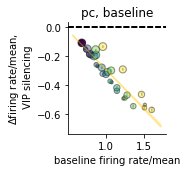

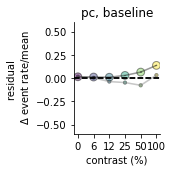

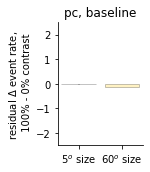

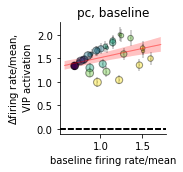

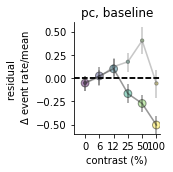

...

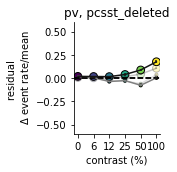

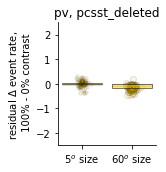

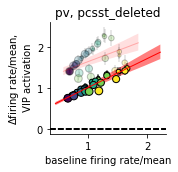

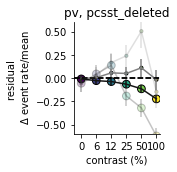

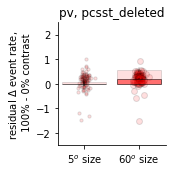

In [157]:
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2

save_fig = True

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
reload(opto_utils)
reload(ut)

celltype_lbls = ['pc','sst','vip','pv']
light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for itype in [0,1,2,3]:

    for iconn in [0,2,3,4]:

    #     ilow = 5*np.ones((lkat.sum(),),dtype='int')
    #     ihigh = 5*np.ones((lkat.sum(),),dtype='int')

        for idir,light_lbl,c,ylim,opto_lbl in zip([1,2],light_lbls,cs,ylims,opto_lbls):

            plt.figure(figsize=(2.5,2.5))
            plt.title('%s, %s'%(celltype_lbls[itype],conn_lbls[iconn]))
            for this_iconn in [0,iconn]:
                ilight = int(np.round(np.mean(target_bin[lkat])))##ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
        #         sca.scatter_size_contrast_errorbar(xdata_norm,ydata_norm-xdata_norm,equality_line=False,square=False)
                if this_iconn==0:
                    alpha = 0.25
                else:
                    alpha = 1
                opto_utils.scatter_size_contrast_x_dx_errorbar(np.concatenate((xdata_norm[:,:,:,np.newaxis],ydata_norm[:,:,:,np.newaxis]),axis=-1),opto_color=c,alpha=alpha)
                plt.axhline(0,c='k',linestyle='dashed')
            #     ut.zero_origin('x')
                plt.xlabel('baseline firing rate/mean')
                plt.ylabel('$\Delta$firing rate/mean, \n VIP %s'%light_lbl)
                ut.erase_top_right()
                plt.tight_layout()
            if save_fig:
                plt.savefig('figures/delta_rate_vs_rate_l4_%s_%s_%s_overlay_intact.jpg'%(light_lbl,celltype_lbls[itype],conn_lbls[iconn]),dpi=300)

            plt.figure(figsize=(2.5,2.5))
            plt.title('%s, %s'%(celltype_lbls[itype],conn_lbls[iconn]))
            for this_iconn in [0,iconn]:
                ilight = int(np.round(np.mean(target_bin[lkat])))#ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())

                pred = slope*xdata_norm + intercept
                actual = (ydata_norm-xdata_norm)
                residual = actual - pred
                these_sizes = [0,5]#[0,5]
                if this_iconn==0:
                    alpha = 0.25
                else:
                    alpha = 1
                ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0,alpha=alpha)
                xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
                for this_size in these_sizes:
                    sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10,alpha=alpha)
                plt.axhline(0,c='k',linestyle='dashed')
                plt.xticks(np.arange(this_ncontrast),ucontrast)
                ut.erase_top_right()
                plt.xlabel('contrast (%)')
                plt.ylabel('residual \n $\Delta$ event rate/mean')
                plt.ylim((-0.6,0.6))
                plt.tight_layout()
            if save_fig:
                plt.savefig('figures/residual_delta_rate_vs_contrast_l4_%s_%s_%s_overlay_intact.jpg'%(light_lbl,celltype_lbls[itype],conn_lbls[iconn]),dpi=300)

            plt.figure(figsize=(2.5,2.5))
            plt.title('%s, %s'%(celltype_lbls[itype],conn_lbls[iconn]))
            for this_iconn in [0,iconn]:
                ilight = int(np.round(np.mean(target_bin[lkat])))#ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())

                pred = slope*xdata_norm + intercept
                actual = (ydata_norm-xdata_norm)
                residual = actual - pred
                these_sizes = [0,5]#[0,5]
                base_alpha = 0.125
                if this_iconn==0:
                    alpha = 0.25*base_alpha
                    show_dots = False
                else:
                    alpha = 1*base_alpha
                    show_dots = True
                
                d_residual = [residual[:,this_size,0]-residual[:,this_size,-1] for this_size in these_sizes]
                ut.bar_with_dots(d_residual,colors=[cs[idir-1] for _ in range(len(these_sizes))],\
                                 tick_labels=['%d$^o$ size'%u for u in usize[these_sizes]],\
                                 s=[dot_sizes[isize] for isize in these_sizes],\
                                alpha=alpha,bar_alpha_frac=4,show_dots=show_dots)
            plt.ylabel('residual $\Delta$ event rate, \n 100% - 0% contrast')
    #         plt.title('%d$^o$ size'%usize[isize])
            ut.erase_top_right()
            plt.tight_layout()
            plt.ylim((-2.5,2.5))
            if save_fig:
                plt.savefig('figures/sim_residual_vip_%s_effect_%s_overlay_intact.jpg'%(opto_lbl,conn_lbls[iconn]),dpi=300)
            for isize,this_size in enumerate(these_sizes):
                print(opto_lbl)
                print('p-value:')
                print(sst.wilcoxon(d_residual[isize]))
            
        # plt.figure(figsize=(2.5,2.5))
        # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
        # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
        # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
        # plt.axhline(0,c='k',linestyle='dashed')
        # ut.zero_origin('x')


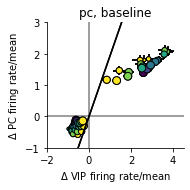

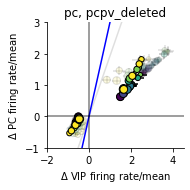

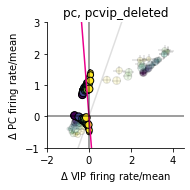

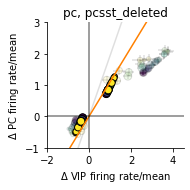

In [205]:
reload(sca)
ibaseline = 15
# ilow = 5
# ihigh = 5
# ibaseline = 1
# ilow = 0
# ihigh = 2
nreps = 100

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,25,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))

import scipy.stats as sst
import opto_utils
reload(opto_utils)
reload(ut)

celltype_lbls = ['pc','sst','vip','pv']
light_lbls = ['silencing','activation']
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']

conn_colors = ['k','','b',np.array((236, 0, 140))/255,np.array((1,0.5,0)),'','']

cs = [np.array((1,0.8,0)),np.array((1,0,0))]

ylims = [np.array((-0.58,0.02)),np.array((-0.02,0.55))]

idir = 2
lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
# lkat = np.ones_like(lkat)

for itype in [0]:

    for iconn in [0,2,3,4]:
        
        plt.figure(figsize=(2.5,2.5))
        plt.title('%s, %s'%(celltype_lbls[itype],conn_lbls[iconn]))

        for this_iconn in [0,iconn]:
            
            vipdiffs = np.array(())
            pcdiffs = np.array(())
            
            for idir,light_lbl,c,ylim in zip([1,2],light_lbls,cs,ylims):

                ilight = int(np.round(np.mean(target_bin[lkat])))#ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                pcdiff = ydata_norm - xdata_norm
                
                slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())

                pred = slope*xdata_norm + intercept
                actual = (ydata_norm-xdata_norm)
                residual = actual - pred
                
                viptype = 2
                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,viptype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,viptype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
                
                vipdiff = ydata_norm - xdata_norm
                
                if this_iconn==0 and not iconn==0:
                    alpha = 0.125
                else:
                    alpha = 1
                
                sca.scatter_size_contrast_errorbar(vipdiff,pcdiff,nsize=6,ncontrast=6,square=False,equality_line=False,alpha=alpha)
#                 sca.scatter_size_contrast_errorbar(pcdiff,vipdiff,nsize=6,ncontrast=6,square=False,equality_line=False,alpha=alpha)
                
                vipdiffs = np.concatenate((vipdiffs,vipdiff.flatten()))
                pcdiffs = np.concatenate((pcdiffs,pcdiff.flatten()))
            
            opto_utils.plot_bootstrapped_regression_lines(np.concatenate((vipdiffs[:,np.newaxis],pcdiffs[:,np.newaxis]),axis=1),alpha=alpha,c=conn_colors[this_iconn],incl_intercept=False,nreps=nreps,flipxy=True)
#             opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,np.newaxis],vipdiffs[:,np.newaxis]),axis=1),alpha=alpha,c=conn_colors[this_iconn],incl_intercept=False,equal_cond=True,nreps=nreps)
#             slp = opto_utils.compute_slope(pcdiffs,vipdiffs)
#             plt.plot((np.nanmin(vipdiffs),np.nanmax(vipdiffs)),np.array((np.nanmin(vipdiffs),np.nanmax(vipdiffs)))/slp,c='k',linestyle='dashed',alpha=alpha)
        plt.xlim((-2,4.5))
        plt.ylim((-1,3))
#         plt.ylim((-2,4))
#         plt.xlim((-1,2))
        plt.axhline(0,c='k',alpha=0.5)
        plt.axvline(0,c='k',alpha=0.5)
        ut.erase_top_right()
        plt.tight_layout()
        plt.xlabel('$\Delta$ VIP firing rate/mean')
        plt.ylabel('$\Delta$ PC firing rate/mean')
#         plt.ylabel('$\Delta$ VIP firing rate/mean')
#         plt.xlabel('$\Delta$ PC firing rate/mean')
#         plt.savefig('figures/pc_vs_vip_delta_event_rate_%s.jpg'%conn_lbls[iconn],dpi=300)
#         plt.savefig('figures/vip_vs_pc_delta_event_rate_%s.jpg'%conn_lbls[iconn],dpi=300)

            #                 these_sizes = [0,5]#[0,5]
#                 if this_iconn==0:
#                     alpha = 0.25
#                 else:
#                     alpha = 1
#                 ut.plot_bootstrapped_errorbars_hillel(np.arange(6),actual[:,these_sizes]-pred[:,these_sizes],colors=c_l23[these_sizes],pct=(16,84),markersize=0,alpha=alpha)
#                 xs = np.arange(6)[np.newaxis] #np.concatenate((np.arange(6)[np.newaxis],np.arange(6)[np.newaxis]),axis=0)#[np.newaxis]
#                 for this_size in these_sizes:
#                     sca.scatter_size_contrast(xs,np.nanmean(actual[:,this_size:this_size+1]-pred[:,this_size:this_size+1],0),equality_line=False,dot_scale=(this_size+1)*10,alpha=alpha)
#                 plt.axhline(0,c='k',linestyle='dashed')
#                 plt.xticks(np.arange(this_ncontrast),ucontrast)
#                 ut.erase_top_right()
#                 plt.xlabel('contrast (%)')
#                 plt.ylabel('residual \n $\Delta$ event rate/mean')
#                 plt.ylim((-0.6,0.4))
#                 plt.tight_layout()
#             plt.savefig('figures/residual_delta_rate_vs_contrast_l4_%s_%s_%s_overlay_intact.jpg'%(light_lbl,celltype_lbls[itype],conn_lbls[iconn]),dpi=300)

        # plt.figure(figsize=(2.5,2.5))
        # xdata = network_resp[:,ibaseline,:,itype].reshape((-1,6,6))
        # ydata = network_resp[:,ihigh,:,itype].reshape((-1,6,6))
        # sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
        # plt.axhline(0,c='k',linestyle='dashed')
        # ut.zero_origin('x')


In [153]:
target_bin.mean()

9.574468085106384

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Ad

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if sys.path[0] == '':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Ad

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:48: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:116: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the

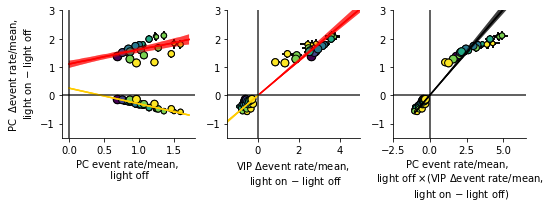

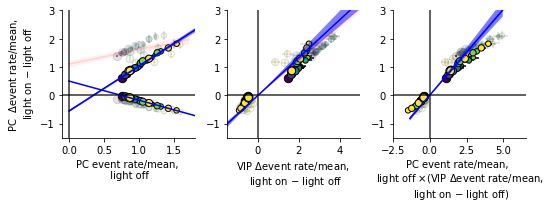

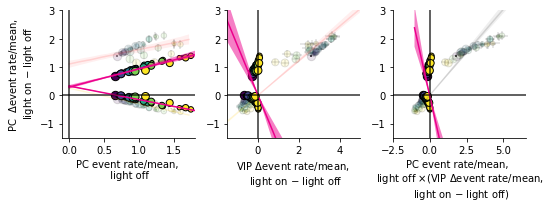

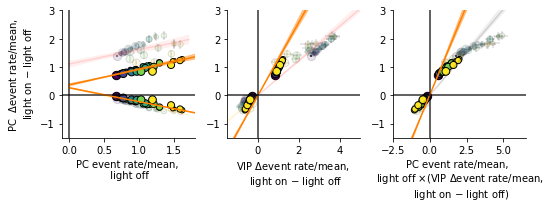

In [272]:
# plt.figure()
# mx = np.nanmax(np.nanmean(scsstanimal,0))
# for ilight in range(2):
#     plt.subplot(1,2,ilight+1)
#     plt.imshow(np.nanmean(scsstanimal,0)[:,:,ilight],vmin=0,vmax=mx)

reload(opto_utils)

def plot_all_three(pcrate,vipdiff,pcdiff,alpha=1):
    plt.subplot(1,3,2)
    sca.scatter_size_contrast_errorbar(vipdiff,pcdiff,equate_0=True,square=False,equality_line=False,alpha=alpha)
    plt.subplot(1,3,1)
    sca.scatter_size_contrast_errorbar(pcrate,pcdiff,equate_0=True,square=False,equality_line=False,alpha=alpha)
    plt.subplot(1,3,3)
    sca.scatter_size_contrast_errorbar(pcrate*vipdiff,pcdiff,equate_0=True,square=False,equality_line=False,alpha=alpha)
    
def regress_all_three(pcrates,vipdiffs,pcdiffs,c='k',alpha=1):
    plt.subplot(1,3,2)
    if c=='k':
        this_c1 = np.array((1,0.8,0))
        this_c2 = np.array((1,0,0))
    else:
        this_c1 = c
        this_c2 = c
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,:,:,np.newaxis],vipdiffs[:,:,:,np.newaxis]),axis=-1),
                                                  alpha=alpha,c=[this_c1,this_c2],incl_intercept=False,nreps=nreps,flipxy=True,xmin=-2)
    plt.xlabel('VIP $\Delta$event rate/mean, \n light on $-$ light off')
    plt.subplot(1,3,1)

#     opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[:,:,:,np.newaxis],np.abs(pcdiffs[:,:,:,np.newaxis])),axis=-1),alpha=alpha,c=c,incl_intercept=False,nreps=nreps,flipxy=True,xmin=0)
#     opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[:,:,:,np.newaxis],-np.abs(pcdiffs[:,:,:,np.newaxis])),axis=-1),alpha=alpha,c=c,incl_intercept=False,nreps=nreps,flipxy=True,xmin=0)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[:int(pcrates.shape[0]/2),:,:,np.newaxis],
                                                                  pcdiffs[:int(pcrates.shape[0]/2),:,:,np.newaxis]),
                                                                 axis=-1),alpha=alpha,incl_intercept=True,nreps=nreps,
                                                  flipxy=True,xmin=0,c=this_c1)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[int(pcrates.shape[0]/2):,:,:,np.newaxis],
                                                                  pcdiffs[int(pcrates.shape[0]/2):,:,:,np.newaxis]),
                                                                 axis=-1),alpha=alpha,incl_intercept=True,nreps=nreps,
                                                  flipxy=True,xmin=0,c=this_c2)
    plt.xlabel('PC event rate/mean, \n light off')
    plt.subplot(1,3,3)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,:,:,np.newaxis],
                                                                  (pcrates*vipdiffs)[:,:,:,np.newaxis]),axis=-1),
                                                  alpha=alpha,c=c,incl_intercept=False,nreps=nreps,flipxy=True)
    plt.xlabel('PC event rate/mean, \n light off '+r'$\times$'+'(VIP $\Delta$event rate/mean, \n light on $-$ light off)')
    xlims = [(-0.1,1.8),(-1.5,5),(-2.5,6.5)]
    for iplot in range(3):
        plt.subplot(1,3,iplot+1)
        plt.axhline(0,c='k',alpha=0.5)#linestyle='dashed')
        plt.axvline(0,c='k',alpha=0.5)#linestyle='dashed')
        plt.ylim((-1.5,3))
        plt.xlim(xlims[iplot])
        ut.erase_top_right()
    
reload(opto_utils)

nreps = 100

for itype in [0]:

    for iconn in [0,2,3,4]:
        
        plt.figure(figsize=(7.5,3))

        for this_iconn in [0,iconn]:
            
            pcrates = np.zeros((0,6,6))
            vipdiffs = np.zeros((0,6,6))
            pcdiffs = np.zeros((0,6,6))
            
            if this_iconn==0 and not iconn==0:
                alpha = 0.125
            else:
                alpha = 1
            
            for idir,light_lbl,c,ylim in zip([1,2],light_lbls,cs,ylims):

                ilight = int(np.round(np.mean(target_bin[lkat])))#ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                pcdiff = ydata_norm - xdata_norm
                pcrate = xdata_norm
                
                slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())

                pred = slope*xdata_norm + intercept
                actual = (ydata_norm-xdata_norm)
                residual = actual - pred
                
                viptype = 2
                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,viptype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,viptype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
                
                vipdiff = ydata_norm - xdata_norm

                plot_all_three(pcrate,vipdiff,pcdiff,alpha=alpha)

                pcrates = np.concatenate((pcrates,pcrate),axis=0)#.flatten()))
                pcdiffs = np.concatenate((pcdiffs,pcdiff),axis=0)#.flatten()))
                vipdiffs = np.concatenate((vipdiffs,vipdiff),axis=0)#.flatten()))

            regress_all_three(pcrates,vipdiffs,pcdiffs,c=conn_colors[this_iconn],alpha=alpha)
# opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,np.newaxis],vipdiffs[:,np.newaxis]),axis=1),alpha=1,c='k',incl_intercept=False,equal_cond=True,nreps=nreps)
# plt.axhline(0,c='k',alpha=0.5)#linestyle='dashed')
# plt.axvline(0,c='k',alpha=0.5)#linestyle='dashed')
# plt.xlim((-1.5,3))
# plt.ylim((-0.5,1))
            plt.subplot(1,3,1)
            plt.ylabel('PC  $\Delta$event rate/mean, \n light on $-$ light off')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/pc_vip_halo_chrimson_scatter_three_plots_%s.jpg'%conn_lbls[iconn],dpi=300)

In [142]:
target_bin.mean()

0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWar

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWar

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWar

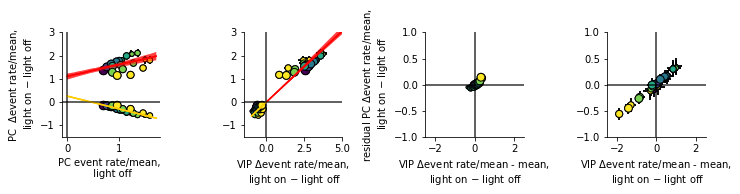

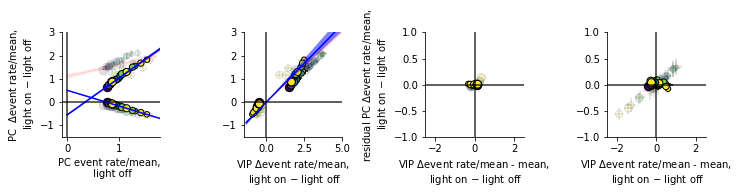

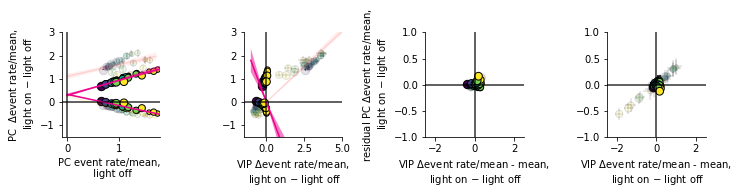

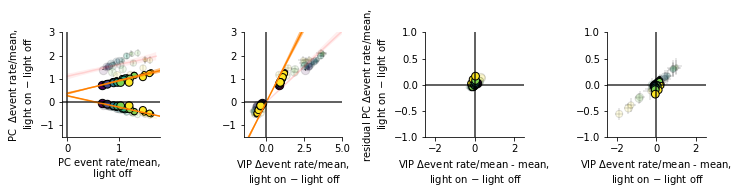

In [235]:
reload(opto_utils)

def compute_residual(xdata,ydata):
    slope,intercept,_,_,_ = sst.linregress(xdata.flatten(), ydata.flatten())
    res = ydata - slope*xdata - intercept
    return res
    
def plot_all_three(pcrate,vipdiff,pcdiff,alpha=1,idir=1):
    plt.subplot(1,4,2)
    sca.scatter_size_contrast_errorbar(vipdiff,pcdiff,equate_0=True,square=False,equality_line=False,alpha=alpha)
    plt.subplot(1,4,1)
    sca.scatter_size_contrast_errorbar(pcrate,pcdiff,equate_0=True,square=False,equality_line=False,alpha=alpha)
    plt.subplot(1,4,2+idir)
    res_pc = compute_residual(pcrate,pcdiff)
    res_vip = vipdiff-vipdiff.mean()#compute_residual(vipdiff,pcdiff)
    sca.scatter_size_contrast_errorbar(res_vip,res_pc,equate_0=True,square=False,equality_line=False,alpha=alpha)
    
def regress_all_three(pcrates,vipdiffs,pcdiffs,c='k',alpha=1):
    rg1 = slice(None,pcrates.shape[0]//2)
    rg2 = slice(pcrates.shape[0]//2,None)
    if c=='k':
        this_c1 = np.array((1,0.8,0))
        this_c2 = np.array((1,0,0))
    else:
        this_c1 = c
        this_c2 = c
    plt.subplot(1,4,2)
#     opto_utils.plot_bootstrapped_regression_lines(np.concatenate((vipdiffs[:,:,:,np.newaxis],pcdiffs[:,:,:,np.newaxis]),axis=-1),alpha=alpha,c=[this_c1,this_c2],incl_intercept=False,nreps=nreps,flipxy=True)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,:,:,np.newaxis],vipdiffs[:,:,:,np.newaxis]),axis=-1),alpha=alpha,c=[this_c1,this_c2],incl_intercept=False,nreps=nreps,flipxy=True)
    plt.xlabel('VIP $\Delta$event rate/mean, \n light on $-$ light off')
    plt.subplot(1,4,1)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[rg1,:,:,np.newaxis],pcdiffs[rg1,:,:,np.newaxis]),axis=-1),alpha=alpha,incl_intercept=True,nreps=nreps,flipxy=True,xmin=0,c=this_c1)
    opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcrates[rg2,:,:,np.newaxis],pcdiffs[rg2,:,:,np.newaxis]),axis=-1),alpha=alpha,incl_intercept=True,nreps=nreps,flipxy=True,xmin=0,c=this_c2)
    plt.xlabel('PC event rate/mean, \n light off')
    plt.subplot(1,4,3)
    plt.xlabel('VIP $\Delta$event rate/mean - mean, \n light on $-$ light off')
    plt.ylabel('residual PC $\Delta$event rate/mean, \n light on $-$ light off')
    plt.subplot(1,4,4)
    plt.xlabel('VIP $\Delta$event rate/mean - mean, \n light on $-$ light off')
    xlims = [(-0.1,1.8),(-1.5,5),(-4.5,6.5),(-2.5,2.5)]
#     for iplot in range(3):
    for iplot in range(4):
        plt.subplot(1,4,iplot+1)
        plt.axhline(0,c='k',alpha=0.5)#linestyle='dashed')
        plt.axvline(0,c='k',alpha=0.5)#linestyle='dashed')
        plt.ylim((-1.5,3))
        plt.xlim(xlims[iplot])
        ut.erase_top_right()
    for iplot in range(2,4):
        plt.subplot(1,4,iplot+1)
        plt.xlim((-2.5,2.5))
        plt.ylim((-1,1))
    
reload(opto_utils)

nreps = 100

for itype in [0]:

    for iconn in [0,2,3,4]:
        
        plt.figure(figsize=(10,2.5))

        for this_iconn in [0,iconn]:
            
            pcrates = np.zeros((0,6,6))
            vipdiffs = np.zeros((0,6,6))
            pcdiffs = np.zeros((0,6,6))
            
            if this_iconn==0 and not iconn==0:
                alpha = 0.125
            else:
                alpha = 1
            
            for idir,light_lbl,c,ylim in zip([1,2],light_lbls,cs,ylims):

                ilight = int(np.round(np.mean(target_bin[lkat])))#ilight_drmax[idir][this_iconn][lkat]

                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,itype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                pcdiff = ydata_norm - xdata_norm
                pcrate = xdata_norm
                
                slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_norm.flatten(), (ydata_norm-xdata_norm).flatten())

                pred = slope*xdata_norm + intercept
                actual = (ydata_norm-xdata_norm)
                residual = actual - pred
                
                viptype = 2
                xdata = network_resps[0][this_iconn][lkat][:,ibaseline,:,viptype].reshape((-1,6,6))
                xdata_norm = xdata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]

                ydata = network_resps[idir][this_iconn][lkat][:,:,:,viptype][np.arange(lkat.sum()),ilight].reshape((-1,6,6))
                ydata_norm = ydata/xdata.mean(1).mean(1)[:,np.newaxis,np.newaxis]
                
                vipdiff = ydata_norm - xdata_norm

                plot_all_three(pcrate,vipdiff,pcdiff,alpha=alpha,idir=idir)

                pcrates = np.concatenate((pcrates,pcrate),axis=0)#.flatten()))
                pcdiffs = np.concatenate((pcdiffs,pcdiff),axis=0)#.flatten()))
                vipdiffs = np.concatenate((vipdiffs,vipdiff),axis=0)#.flatten()))

            regress_all_three(pcrates,vipdiffs,pcdiffs,c=conn_colors[this_iconn],alpha=alpha)
# opto_utils.plot_bootstrapped_regression_lines(np.concatenate((pcdiffs[:,np.newaxis],vipdiffs[:,np.newaxis]),axis=1),alpha=1,c='k',incl_intercept=False,equal_cond=True,nreps=nreps)
# plt.axhline(0,c='k',alpha=0.5)#linestyle='dashed')
# plt.axvline(0,c='k',alpha=0.5)#linestyle='dashed')
# plt.xlim((-1.5,3))
# plt.ylim((-0.5,1))
            plt.subplot(1,4,1)
            plt.ylabel('PC  $\Delta$event rate/mean, \n light on $-$ light off')
            ut.erase_top_right()
            plt.tight_layout()
            plt.savefig('figures/pc_vip_halo_chrimson_scatter_four_plots_%s.jpg'%conn_lbls[iconn],dpi=300)

In [63]:
pcrates.shape

(178, 6, 6)

In [34]:
iconn = 0
idir = 1
res[iconn][idir][lkat][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat]].shape

TypeError: 'NoneType' object is not subscriptable

In [35]:
plt.figure(figsize=(2.5,2.5))
iconn = 0
idir = 1
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),res[iconn][idir][lkat][np.arange(lkat.sum()),ilight_drmax[idir+1][iconn][lkat]][:,:,:,0])

TypeError: 'NoneType' object is not subscriptable

<Figure size 180x180 with 0 Axes>

In [36]:
conn_lbls

['baseline',
 'pcpc_deleted',
 'pcpv_deleted',
 'pcvip_deleted',
 'pcsst_deleted',
 '']

In [137]:
reload(ut)

these_sizes = [0,5]

dot_sizes = 10+np.arange(6)*5

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,22,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))
itype = 0

idir = 2

lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])

for iconn in [0,2,3,4]:

    for isize in these_sizes:

        isize1 = isize
        isize2 = isize
        icontrast1 = 1
        icontrast2 = 5

        lim = (-0.33,0.33)

        mean_res = [[] for idir in range(2)]
        diff_res = [[] for idir in range(2)]

        for idir,lbl in enumerate(['halo','chrimson']):
            this_res = res[iconn][idir][lkat][np.arange(lkat.sum()),ilight_drmax[idir+1][iconn][lkat]][:,isize,:,itype]
            mean_res[idir] = np.nanmean(np.abs(this_res),axis=1)
            diff_res[idir] = this_res[:,icontrast1] - this_res[:,icontrast2]
        plt.figure(figsize=(2.5,2.5))
        ut.bar_with_dots(diff_res,colors=[np.array((1,0.8,0)),'r'],tick_labels=['VIP \n silencing','VIP \n activation'])#,s=dot_sizes[isize])
        plt.ylabel('residual $\Delta$ event rate, \n 100% - 0% contrast')
        plt.title('%d$^o$ size'%usize[isize])
        ut.erase_top_right()
        plt.tight_layout()
        plt.ylim((-1.5,2.5))
#         plt.savefig('figures/exptl_residual_vip_effect_size_%d_%s.jpg'%(isize,conn_lbls[iconn]),dpi=300)
        print(sst.ttest_ind(diff_res[0][~np.isnan(diff_res[0])],diff_res[1][~np.isnan(diff_res[1])]))
        print(sst.ttest_ind(mean_res[0][~np.isnan(mean_res[0])],mean_res[1][~np.isnan(mean_res[1])]))
        # plt.savefig('figures/vip_%s_residual_over_line.eps'%lbl)

NameError: name 'res' is not defined

Ttest_indResult(statistic=nan, pvalue=nan)
Ttest_indResult(statistic=nan, pvalue=nan)


TypeError: 'NoneType' object is not subscriptable

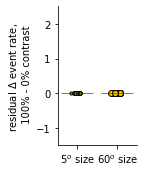

In [38]:
reload(ut)

these_sizes = [0,5]

dot_sizes = 10+np.arange(6)*5

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,22,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))
itype = 0
c_opto = [np.array((1,0.8,0)),'r']

idir = 2

lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])

for iconn in [0,2,3,4]:

    for idir,lbl in enumerate(['halo','chrimson']):

        isize1 = isize
        isize2 = isize
        icontrast1 = 1
        icontrast2 = 5

        lim = (-0.33,0.33)

        mean_res = [[] for this_isize in range(2)]
        diff_res = [[] for this_isize in range(2)]

        for this_isize in range(2):
            isize = these_sizes[this_isize]
            this_res = res[iconn][idir][lkat][np.arange(lkat.sum()),ilight_drmax[idir+1][iconn][lkat]][:,isize,:,itype]
            mean_res[this_isize] = np.nanmean(np.abs(this_res),axis=1)
            diff_res[this_isize] = this_res[:,icontrast1] - this_res[:,icontrast2]
        plt.figure(figsize=(2.5,2.5))
        ut.bar_with_dots(diff_res,colors=[c_opto[idir] for this_isize in range(2)],tick_labels=['%d$^o$ size'%u for u in usize[these_sizes]],s=[dot_sizes[isize] for isize in these_sizes])
        plt.ylabel('residual $\Delta$ event rate, \n 100% - 0% contrast')
#         plt.title('%d$^o$ size'%usize[isize])
        ut.erase_top_right()
        plt.tight_layout()
        plt.ylim((-1.5,2.5))
#         plt.savefig('figures/sim_residual_vip_%s_effect_%s.jpg'%(lbl,conn_lbls[iconn]),dpi=300)
        print(sst.ttest_ind(diff_res[0][~np.isnan(diff_res[0])],diff_res[1][~np.isnan(diff_res[1])]))
        print(sst.ttest_ind(mean_res[0][~np.isnan(mean_res[0])],mean_res[1][~np.isnan(mean_res[1])]))
        # plt.savefig('figures/vip_%s_residual_over_line.eps'%lbl)

In [115]:
reload(ut)

these_sizes = [0,5]

dot_sizes = 10+np.arange(6)*5

ucontrast = np.array((0,6,12,25,50,100))
usize = np.array((5,8,13,22,36,60))
this_nsize = len(usize)
this_ncontrast = len(ucontrast)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))
itype = 0
c_opto = [np.array((1,0.8,0)),'r']

idir = 2

lkat = ut.k_and(*[network_resps[idir][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])

for iconn in [0,2,3,4]:

    for idir,lbl in enumerate(['halo','chrimson']):

        isize1 = isize
        isize2 = isize
        icontrast1 = 1
        icontrast2 = 5

        plt.figure(figsize=(2.5,2.5))

        for this_iconn,this_alpha in zip([0,iconn],[0.25,1]):

            mean_res = [[] for this_isize in range(2)]
            diff_res = [[] for this_isize in range(2)]

            for this_isize in range(2):
                isize = these_sizes[this_isize]
                this_res = res[this_iconn][idir][lkat][np.arange(lkat.sum()),ilight_drmax[idir+1][this_iconn][lkat]][:,isize,:,itype]
                mean_res[this_isize] = np.nanmean(np.abs(this_res),axis=1)
                diff_res[this_isize] = this_res[:,icontrast1] - this_res[:,icontrast2]
            ut.bar_with_dots(diff_res,colors=[c_opto[idir] for this_isize in range(2)],tick_labels=['%d$^o$ size'%u for u in usize[these_sizes]],s=[dot_sizes[isize] for isize in these_sizes],alpha=this_alpha)
        plt.ylabel('residual $\Delta$ event rate, \n 100% - 0% contrast')
#         plt.title('%d$^o$ size'%usize[isize])
        ut.erase_top_right()
        plt.tight_layout()
        plt.ylim((-1.5,2.5))
        plt.savefig('figures/sim_residual_vip_%s_effect_%s_overlay_intact.jpg'%(lbl,conn_lbls[iconn]),dpi=300)
        print(sst.ttest_ind(diff_res[0][~np.isnan(diff_res[0])],diff_res[1][~np.isnan(diff_res[1])]))
        print(sst.ttest_ind(mean_res[0][~np.isnan(mean_res[0])],mean_res[1][~np.isnan(mean_res[1])]))
        # plt.savefig('figures/vip_%s_residual_over_line.eps'%lbl)

NameError: name 'res' is not defined

<Figure size 180x180 with 0 Axes>

In [72]:
isinstance(2,int)

True

In [ ]:
iconn = 0
xdata = network_resps[1][iconn][:,:,:,:].reshape((-1,nopto,6,6,ntypes))
ydata = network_resps[2][iconn][:,:,:,:].reshape((-1,nopto,6,6,ntypes))
zdata = network_resps[0][iconn][:,:,:,:].reshape((-1,1,6,6,ntypes))
plt.figure()
sca.scatter_size_contrast_errorbars(xdata)

In [512]:
network_resps[1][iconn].shape

(43, 11, 36, 8)

In [509]:
celltype_lbls = ['pc','sst','vip','pv']

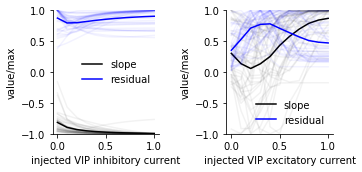

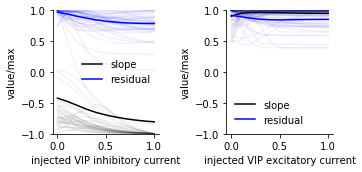

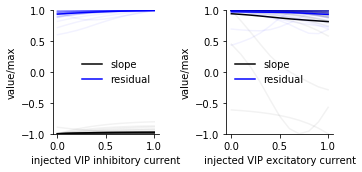

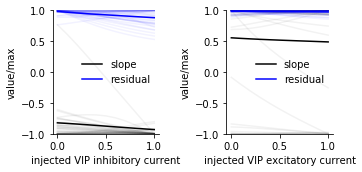

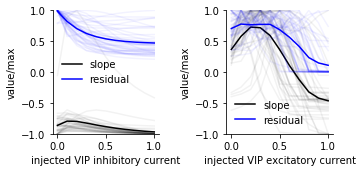

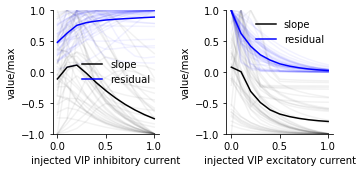

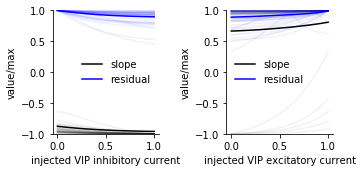

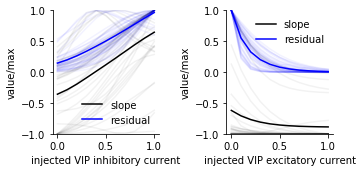

In [514]:
for itype in [0,1]:
    for iconn in [0,2,3,4]:
        plt.figure(figsize=(5,2.5))
        for idir in range(2):
            plt.subplot(1,2,idir+1)
        #     data = np.abs(res[idir][lkat]/slope[idir][lkat,:,np.newaxis,np.newaxis]).sum(2).sum(2)
            data = slope[iconn][idir][lkat,:,itype]
            plt.plot(opto_levels,(data/np.abs(data).max(1)[:,np.newaxis]).T,alpha=0.05,c='k')
            plt.plot(opto_levels,np.mean(data/np.abs(data).max(1)[:,np.newaxis],0),c='k',label='slope')
        #     plt.plot((data).T,alpha=0.05,c='k')
        #     plt.plot(np.mean(data,0),c='k')
            data = np.abs(res[iconn][idir][lkat,:,:,:,itype]).sum(2).sum(2)
            plt.plot(opto_levels,(data/np.abs(data).max(1)[:,np.newaxis]).T,alpha=0.05,c='b')
            plt.plot(opto_levels,np.mean(data/np.abs(data).max(1)[:,np.newaxis],0),c='b',label='residual')
            plt.ylim((-1,1))
            ut.erase_top_right()
            if idir==0:
                plt.xlabel('injected VIP inhibitory current')
            else:
                plt.xlabel('injected VIP excitatory current')
            plt.ylabel('value/max')
            plt.legend(frameon=False)
        plt.tight_layout()
#         plt.savefig('figures/vip_opto_%s_res_slope_by_light_level_%s.jpg'%(celltype_lbls[itype],conn_lbls[iconn]),dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

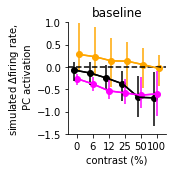

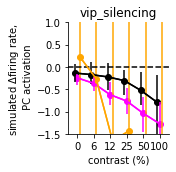

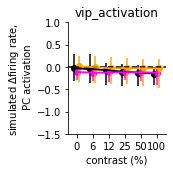

In [110]:
i,j = 4,0
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for idir,ilight in zip([0,1,2],[0,5,5]):
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(1,0,1),(1,0.65,0)))
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
    ut.erase_top_right()
    plt.xticks(np.arange(6),ucontrast)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('contrast (%)')
    plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
    plt.title(dir_lbls[idir])
    plt.tight_layout()
    plt.ylim((-1.5,1))
#     plt.savefig('figures/far_pc_coupling_pcsst_pcvip_deleted_%s.jpg'%dir_lbls[idir],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

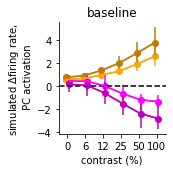

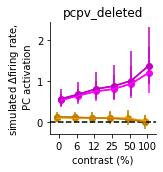

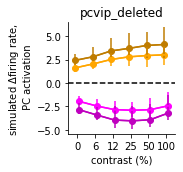

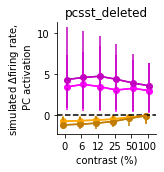

In [97]:
i = 0
js = [1,2]
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[0]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
        colors = np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        colors = 0.75*np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i::nQ,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl.sum(3),delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
#         plt.ylim((-1.5,1))
    #     plt.savefig('figures/far_pc_coupling_pcsst_pcvip_deleted_%s.jpg'%dir_lbls[idir],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

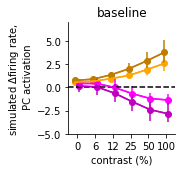

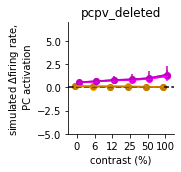

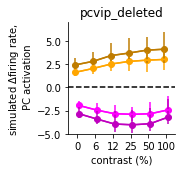

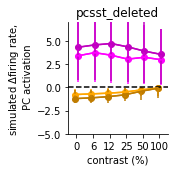

In [125]:
i = 0
js = [1,2]
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[0]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
        colors = np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        colors = 0.75*np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i::nQ,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl.sum(3),delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
        plt.ylim((-5,7))
#         plt.savefig('figures/l23_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

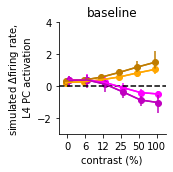

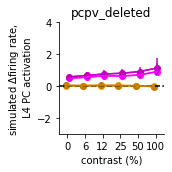

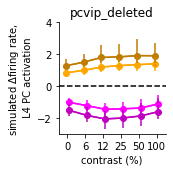

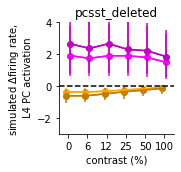

In [126]:
i = 0
js = [1,2]
nP = 2
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[0]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
        colors = np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        colors = 0.75*np.array(((1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i::nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl.sum(3),delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n L4 PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
        plt.ylim((-3,4))
#         plt.savefig('figures/l4_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

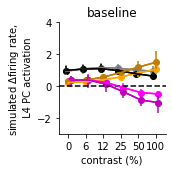

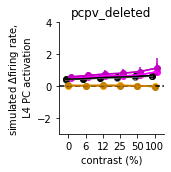

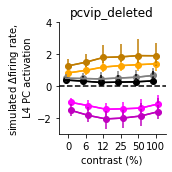

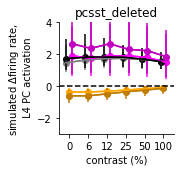

In [67]:
i = 0
js = [0,1,2]
nP = 2
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[0]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
        colors = np.array(((0.5,0.5,0.5),(1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        colors = 0.75*np.array(((0,0,0),(1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i::nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl.sum(3),delta=0.1,pct=(16,84),colors=colors)
#         cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i+nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n L4 PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
        plt.ylim((-3,4))
#         plt.ylim((-2,4))
#         plt.savefig('figures/l4_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

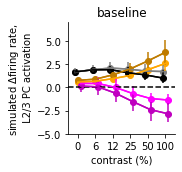

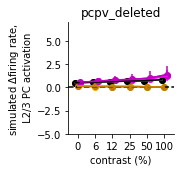

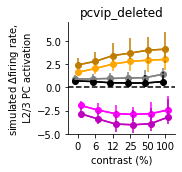

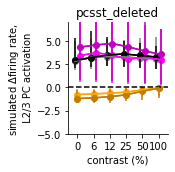

In [122]:
i = 0
js = [0,1,2]
nP = 2
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[0]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
        colors = np.array(((0.5,0.5,0.5),(1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        colors = 0.75*np.array(((0,0,0),(1,0.65,0),(1,0,1)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i::nQ,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl.sum(3),delta=0.1,pct=(16,84),colors=colors)
#         cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i+nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n L2/3 PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
        plt.ylim((-5,7))
#         plt.ylim((-2,4))
#         plt.savefig('figures/l23_pc_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


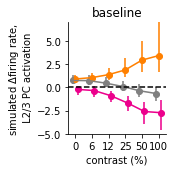

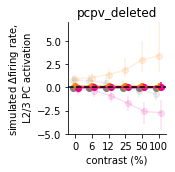

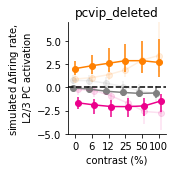

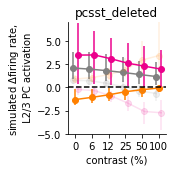

In [176]:
reload(ut)
i = 0
js = [0,1,2]
nP = 2
isize = 3
ibaseline = 15
alphas = [0.125,1]
dir_lbls = ['baseline','vip_silencing','vip_activation']
save_fig = True
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[ibaseline]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
#         colors = np.array(((0.5,0.5,0.5),(1,0.65,0),(1,0,1)))
#     #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
#         cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
#         colors = 1*np.array(((0,0,0),(1,0.5,0),(1,0,1))) # np.array((236, 0, 140))/255
        colors = 1*np.array(((0.5,0.5,0.5),(1,0.5,0),np.array((236, 0, 140))/255)) # np.array((236, 0, 140))/255
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        for this_iconn,alpha in zip([0,iconn],alphas):
            cpl = np.concatenate([couplingses[idir][this_iconn][lkat][:,:,isize,:,i+nQ,j][np.arange(lkat.sum()),ilight,:][:,np.newaxis] for j in js],axis=1)
            cpl = cpl/baseline_means[lkat][:,js,np.newaxis]
            #             cpl = np.concatenate([couplingses[idir][this_iconn][lkat][:,:,isize,:,i+nQ,j][np.arange(lkat.sum()),ilight_drmax[idir][this_iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#             ut.plot_parametric_fn_pct_errorbars(np.arange(6),cpl,fit_fn=nra.fit_opt_params_two_asymptote_fn,plot_fn=nra.two_asymptote_fn,colors=colors,alpha=alpha)
            ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors,alpha=alpha)
#         cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i+nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n L2/3 PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
#         plt.ylim((-2,2))
#         plt.ylim((-2.5,3.5))
        plt.ylim((-5,7))
#         plt.ylim((-2,4))
#         plt.savefig('figures/l23_surround_pc_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)
        if save_fig:
            if iconn == 0:
                plt.savefig('figures/l23_surround_pc_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)
            else:
                plt.savefig('figures/l23_surround_pc_sst_vip_coupling_%s_overlay.jpg'%conn_lbls[iconn],dpi=300)

In [217]:
cpl.shape

(89, 3, 6)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


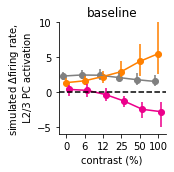

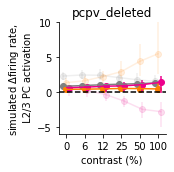

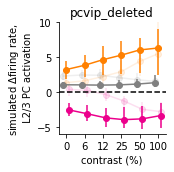

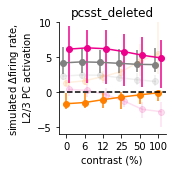

In [177]:
save_fig = True
i = 0
js = [0,1,2]
nP = 2
isize = 3
ibaseline = 15
alphas = [0.125,1]
dir_lbls = ['baseline','vip_silencing','vip_activation']
for iconn in [0,2,3,4]:
    for idir,ilight in zip([0],[ibaseline]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        
#         colors = np.array(((0.5,0.5,0.5),(1,0.65,0),(1,0,1)))
#     #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
#         cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
#         colors = 1*np.array(((0,0,0),(1,0.5,0),(1,0,1))) # np.array((236, 0, 140))/255
        colors = 1*np.array(((0.5,0.5,0.5),(1,0.5,0),np.array((236, 0, 140))/255)) # np.array((236, 0, 140))/255
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        for this_iconn,alpha in zip([0,iconn],alphas):
            cpl = np.concatenate([couplingses[idir][this_iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight,:][:,np.newaxis] for j in js],axis=1)
#             cpl = np.concatenate([couplingses[idir][this_iconn][lkat][:,:,isize,:,i+nQ,j][np.arange(lkat.sum()),ilight_drmax[idir][this_iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
            cpl = cpl/baseline_means[lkat][:,js,np.newaxis]
            ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors,alpha=alpha)
#             ut.plot_parametric_fn_pct_errorbars(np.arange(6),cpl,fit_fn=nra.fit_opt_params_two_asymptote_fn,plot_fn=nra.two_asymptote_fn,colors=colors,alpha=alpha)
#         cpl = np.concatenate([Xcouplingses[idir][iconn][lkat][:,:,isize,:,i+nP,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for j in js],axis=1)
#         ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$firing rate, \n L2/3 PC activation')
        plt.title(conn_lbls[iconn])
        plt.tight_layout()
#         plt.ylim((-3,4))
        plt.ylim((-6,10))
#         plt.ylim((-2.5,3.5))
#         plt.ylim((-2,4))
        if save_fig:
            if iconn == 0:
                plt.savefig('figures/l23_center_pc_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)
            else:
                plt.savefig('figures/l23_center_pc_sst_vip_coupling_%s_overlay.jpg'%conn_lbls[iconn],dpi=300)

In [96]:
cpl.shape

(39, 2, 6, 2)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


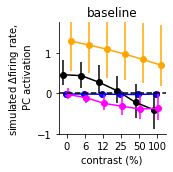

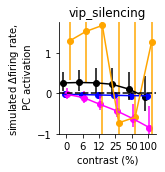

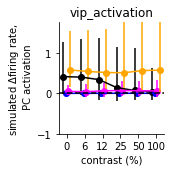

In [173]:
i,j = 4,0
isize = 3
ilight = 0
dir_lbls = ['baseline','vip_silencing','vip_activation']
for idir,ilight in zip([0,1,2],[15,5,5]):
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(0,0,1),(1,0,1),(1,0.65,0)))
    cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,2,3,4]],axis=1)
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,2,3,4]],axis=1)
    ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
    ut.erase_top_right()
    plt.xticks(np.arange(6),ucontrast)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('contrast (%)')
    plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
    plt.title(dir_lbls[idir])
    plt.tight_layout()
    plt.ylim((-1,1.75))
    if iconn == 0:
        plt.savefig('figures/l23_center_pc_sst_vip_coupling_%s.jpg'%conn_lbls[iconn],dpi=300)
    else:
        plt.savefig('figures/l23_center_pc_sst_vip_coupling_%s_overlay.jpg'%conn_lbls[iconn],dpi=300)

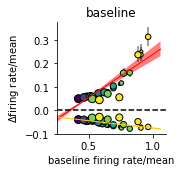

In [95]:
### MARKER
import opto_utils
reload(opto_utils)
this_lkat = ut.k_and(*[network_resps[0][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
usize = np.array((5,8,13,22,35,60))
ucontrast = np.array((0,6,12,25,50,100))
i,j = 0,0
isize = 3
ilight = 0
iconn = 0
alpha = 1
dir_lbls = ['baseline','vip_silencing','vip_activation']
for idir,ilight in zip([0],[15]):
    
    xlabel = 'baseline firing rate/mean'
    ylabel = '$\Delta$firing rate/mean'
    
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(0,0,1),(1,0,1),(1,0.65,0)))
    r = network_resps[0][iconn][this_lkat][:,ilight,:,j].reshape((-1,6,6))
#     cpl = couplingses[idir][iconn][this_lkat][:,ilight,:,:,i,j]
    cpl = network_resps[0][iconn][this_lkat][:,16,:,j].reshape((-1,6,6))-r
    this_data = np.stack((r,cpl),axis=3)
    opto_utils.scatter_size_contrast_errorbar(this_data,pct=(16,84),opto_color='r',equality_line=False,square=False,\
                                              xlabel=xlabel,ylabel=ylabel,alpha=alpha,linewidth=1)
    
    r = network_resps[0][iconn][this_lkat][:,ilight,:,i].reshape((-1,6,6))
#     cpl = couplingses[idir][iconn][this_lkat][:,ilight,:,:,i,j]
    cpl = network_resps[0][iconn][this_lkat][:,14,:,j].reshape((-1,6,6))-network_resps[0][iconn][this_lkat][:,15,:,j].reshape((-1,6,6))
    this_data = np.stack((r,cpl),axis=3)
    opto_utils.scatter_size_contrast_errorbar(this_data,pct=(16,84),opto_color=np.array((1,0.8,0)),equality_line=False,square=False,\
                                              xlabel=xlabel,ylabel=ylabel,alpha=alpha,linewidth=1)
    
    #,mn_plot=mn_plot,mx_plot=mx_plot
    plt.axhline(0,c='k',linestyle='dashed')
    plt.ylabel(ylabel)
#     ut.zero_origin('x')
    
    ut.erase_top_right()
    plt.title(dir_lbls[idir])
    plt.tight_layout()
    plt.ylim((-0.1,0.375))
    plt.xlim((0.25,1.1))
    plt.savefig('figures/delta_pc_rate_vs_rate_finite_vip.jpg',dpi=300)

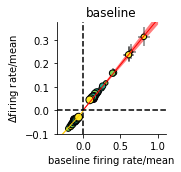

In [97]:
### MARKER
import opto_utils
reload(opto_utils)
this_lkat = ut.k_and(*[network_resps[0][iconn].max(1).max(1).max(1) < 10 for iconn in [0,2,3,4]])
usize = np.array((5,8,13,22,35,60))
ucontrast = np.array((0,6,12,25,50,100))
i,j = 2,0
isize = 3
ilight = 0
iconn = 0
alpha = 1
dir_lbls = ['baseline','vip_silencing','vip_activation']
for idir,ilight in zip([0],[15]):
    
    xlabel = 'baseline firing rate/mean'
    ylabel = '$\Delta$firing rate/mean'
    
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(0,0,1),(1,0,1),(1,0.65,0)))
    r = network_resps[0][iconn][this_lkat][:,16,:,i].reshape((-1,6,6))-network_resps[0][iconn][this_lkat][:,15,:,i].reshape((-1,6,6))
#     cpl = couplingses[idir][iconn][this_lkat][:,ilight,:,:,i,j]
    cpl = network_resps[0][iconn][this_lkat][:,16,:,j].reshape((-1,6,6))-network_resps[0][iconn][this_lkat][:,15,:,j].reshape((-1,6,6))
    this_data = np.stack((r,cpl),axis=3)
    opto_utils.scatter_size_contrast_errorbar(this_data,pct=(16,84),opto_color='r',equality_line=False,square=False,\
                                              xlabel=xlabel,ylabel=ylabel,alpha=alpha,linewidth=1,mn_plot=0,mx_plot=1)
    
    r = network_resps[0][iconn][this_lkat][:,14,:,i].reshape((-1,6,6))-network_resps[0][iconn][this_lkat][:,15,:,i].reshape((-1,6,6))
#     cpl = couplingses[idir][iconn][this_lkat][:,ilight,:,:,i,j]
    cpl = network_resps[0][iconn][this_lkat][:,14,:,j].reshape((-1,6,6))-network_resps[0][iconn][this_lkat][:,15,:,j].reshape((-1,6,6))
    this_data = np.stack((r,cpl),axis=3)
    opto_utils.scatter_size_contrast_errorbar(this_data,pct=(16,84),opto_color=np.array((1,0.8,0)),equality_line=False,square=False,\
                                              xlabel=xlabel,ylabel=ylabel,alpha=alpha,linewidth=1,mn_plot=-1,mx_plot=0)
    
    #,mn_plot=mn_plot,mx_plot=mx_plot
    plt.ylabel(ylabel)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.axvline(0,c='k',linestyle='dashed')
#     ut.zero_origin('x')
    
    ut.erase_top_right()
    plt.title(dir_lbls[idir])
    plt.tight_layout()
    plt.ylim((-0.1,0.375))
    plt.xlim((-0.35,1.1))
    plt.savefig('figures/delta_pc_rate_vs_delta_vip_rate_finite_vip.jpg',dpi=300)

In [40]:
this_data.shape

(89, 36, 2)

In [606]:
conn_lbls

['baseline',
 'pcpc_deleted',
 'pcpv_deleted',
 'pcvip_deleted',
 'pcsst_deleted',
 '']

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

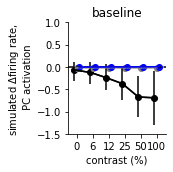

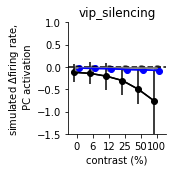

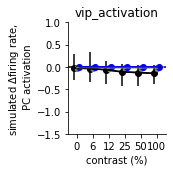

In [609]:
i,j = 4,0
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
for idir,ilight in zip([0,1,2],[0,5,5]):
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(0.5,0.5,0.5),(0,0,1)))
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,1,2]],axis=1)
    ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
    ut.erase_top_right()
    plt.xticks(np.arange(6),ucontrast)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('contrast (%)')
    plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
    plt.title(dir_lbls[idir])
    plt.tight_layout()
    plt.ylim((-1.5,1))
#     plt.savefig('figures/far_pc_coupling_pcpc_pcpv_deleted_%s.jpg'%dir_lbls[idir],dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

IndexError: list index out of range

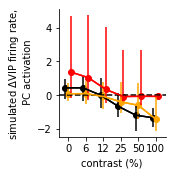

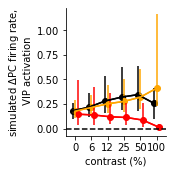

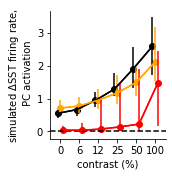

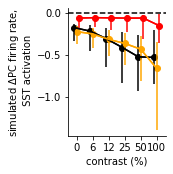

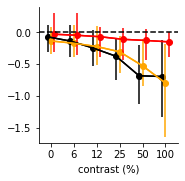

In [112]:
i,j = 0,2
isize = 3
ilight = 5
# dir_lbls = ['baseline','vip_silencing','vip_activation']
iconn = 0
small_lbl = ['pc','sst','vip','pv']
big_lbl = ['PC','SST','VIP','PV']
for i,j,ylim in zip([0,2,0,1,4],[2,0,1,0,0],[None,None,None,None,None]):
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(1,0.65,0),(1,0,0)))
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for idir in [0,1,2]],axis=1)
    ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
    ut.erase_top_right()
    plt.xticks(np.arange(6),ucontrast)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('contrast (%)')
    plt.ylabel('simulated $\Delta$%s firing rate, \n %s activation'%(big_lbl[j],big_lbl[i]))
#     plt.title(dir_lbls[idir])
    plt.tight_layout()
#     plt.ylim((-2.5,5.5))
#     plt.savefig('figures/%s_%s_coupling_vip_silencing_activation.jpg'%(small_lbl[i],small_lbl[j]),dpi=300)

In [132]:
YYs[0].shape

(43, 11, 36, 1, 8)

In [146]:
network_resps[2][iconn][lkat].shape

(39, 11, 36, 8)

/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1071: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope = np.diff(zdata,axis=axis)/np.diff(tdata)[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1076: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  zdata_slope_avg[slicer] = zdata_slope[slicer]
/Users/dan/Documents/code/adesnal/size_contrast_analysis.py:1083: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future 

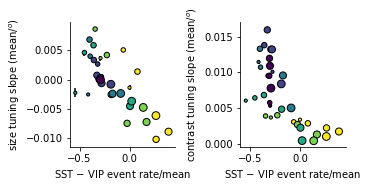

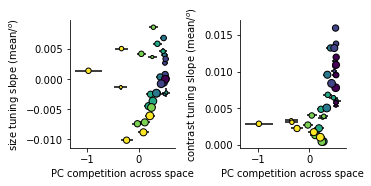

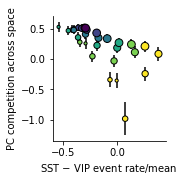

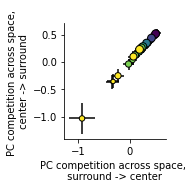

In [35]:
idir = 0
iconn = 0
ibaseline = 15

usize = np.array((5,8,13,22,35,60))
ucontrast = np.array((0,6,12,25,50,100))

itype = 0
size_slp = sca.compute_slope_avg(usize,network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6)),axis=1)
contrast_slp = sca.compute_slope_avg(ucontrast,network_resps[idir][iconn][lkat][:,ibaseline,:,itype].reshape((-1,6,6)),axis=2)

# size_slp = sca.compute_diff_avg(YYs[ifit][low_loss[ifit]][:,:,:,itype],axis=1)
# contrast_slp = sca.compute_diff_avg(YYs[ifit][low_loss[ifit]][:,:,:,itype],axis=2)

sst_vip_diff = network_resps[idir][iconn][lkat][:,ibaseline,:,1] - network_resps[idir][iconn][lkat][:,ibaseline,:,2]
i,j = 4,0
# cpl = couplingses[idir][iconn][lkat][:,ibaseline,:,:,i,j] #+ couplingses[idir][iconn][lkat][:,ibaseline,:,:,0,0]
cpl = 0.5*(couplingses[idir][iconn][lkat][:,ibaseline,:,:,i,j] + couplingses[idir][iconn][lkat][:,ibaseline,:,:,j,i])#+ couplingses[idir][iconn][lkat][:,ibaseline,:,:,0,0]


# itype = 0
# pc_baseline = network_resps[0][iconn][lkat][:,0,:,itype]
# vip_chrimson_pc_diff = network_resps[2][iconn][lkat][np.arange(lkat.sum()),ilight_drmax[2][iconn][lkat],:][:,:,itype] - pc_baseline

# itype = 2
# vip_baseline = network_resps[0][iconn][lkat][:,0,:,itype]
# vip_chrimson_vip_diff = network_resps[2][iconn][lkat][np.arange(lkat.sum()),ilight_drmax[2][iconn][lkat],:][:,:,itype] - vip_baseline

# itype = 0
# pc_baseline = network_resps[0][iconn][lkat][:,0,:,itype]
# vip_halo_pc_diff = network_resps[1][iconn][lkat][np.arange(lkat.sum()),ilight_drmax[1][iconn][lkat],:][:,:,itype] - pc_baseline

# itype = 2
# vip_baseline = network_resps[0][iconn][lkat][:,0,:,itype]
# vip_halo_vip_diff = network_resps[1][iconn][lkat][np.arange(lkat.sum()),ilight_drmax[1][iconn][lkat],:][:,:,itype] - vip_baseline

plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(sst_vip_diff,size_slp,equality_line=False,square=False,nsize=6,ncontrast=6)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('size tuning slope (mean/$^o$)')
ut.erase_top_right()
plt.subplot(1,2,2)
sca.scatter_size_contrast_errorbar(sst_vip_diff,contrast_slp,equality_line=False,square=False,nsize=6,ncontrast=6)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('contrast tuning slope (mean/$^o$)')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/slopes_vs_sst_vip.eps')

plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(cpl,size_slp,equality_line=False,square=False,nsize=6,ncontrast=6)
plt.xlabel('PC competition across space')
plt.ylabel('size tuning slope (mean/$^o$)')
ut.erase_top_right()
plt.subplot(1,2,2)
sca.scatter_size_contrast_errorbar(cpl,contrast_slp,equality_line=False,square=False,nsize=6,ncontrast=6)
plt.xlabel('PC competition across space')
plt.ylabel('contrast tuning slope (mean/$^o$)')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/slopes_vs_pc_competition.eps')

plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(sst_vip_diff,cpl,equality_line=False,square=False,nsize=6,ncontrast=6)
plt.xlabel('SST $-$ VIP event rate/mean')
plt.ylabel('PC competition across space')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/pc_competition_vs_sst_vip.eps')

plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(couplingses[idir][iconn][lkat][:,ibaseline,:,:,i,j],couplingses[idir][iconn][lkat][:,ibaseline,:,:,j,i],equality_line=False,square=False,nsize=6,ncontrast=6)
# plt.xlabel('SST $-$ VIP event rate/mean')
plt.xlabel('PC competition across space, \n surround -> center ')
plt.ylabel('PC competition across space, \n center -> surround ')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/pc_competition_vs_sst_vip.eps')


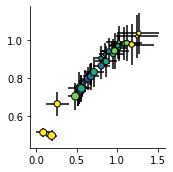

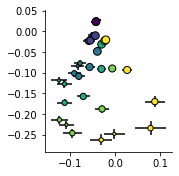

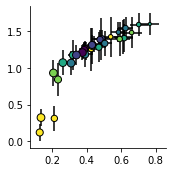

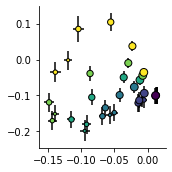

In [183]:
plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(pc_baseline*vip_chrimson_vip_diff,vip_chrimson_pc_diff,equality_line=False,square=False,nsize=6,ncontrast=6)
# plt.xlabel('SST $-$ VIP event rate/mean')
# plt.ylabel('$\Delta$ PC event rate/mean, VIP activation')
ut.erase_top_right()
plt.tight_layout()

plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(pc_baseline*vip_halo_vip_diff,vip_halo_pc_diff,equality_line=False,square=False,nsize=6,ncontrast=6)
# plt.xlabel('SST $-$ VIP event rate/mean')
# plt.ylabel('$\Delta$ PC event rate/mean, VIP activation')
ut.erase_top_right()
plt.tight_layout()

plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(vip_baseline*vip_chrimson_pc_diff,vip_chrimson_vip_diff,equality_line=False,square=False,nsize=6,ncontrast=6)
# plt.xlabel('SST $-$ VIP event rate/mean')
# plt.ylabel('$\Delta$ PC event rate/mean, VIP activation')
ut.erase_top_right()
plt.tight_layout()

plt.figure(figsize=(2.5,2.5))
# plt.subplot(1,2,1)
sca.scatter_size_contrast_errorbar(vip_baseline*vip_halo_pc_diff,vip_halo_vip_diff,equality_line=False,square=False,nsize=6,ncontrast=6)
# plt.xlabel('SST $-$ VIP event rate/mean')
# plt.ylabel('$\Delta$ PC event rate/mean, VIP activation')
ut.erase_top_right()
plt.tight_layout()

(array([1., 5., 3., 3., 5., 2., 6., 5., 4., 5.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

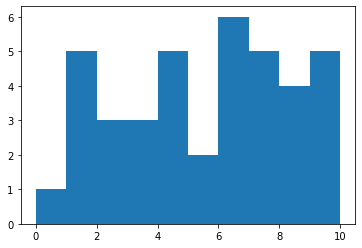

In [185]:
idir = 2
iconn = 0
plt.figure()
plt.hist(ilight_drmax[idir][iconn][lkat])

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

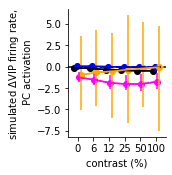

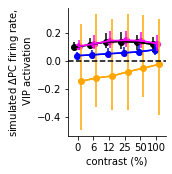

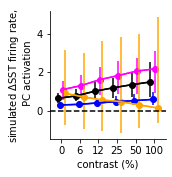

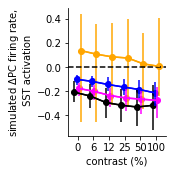

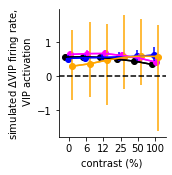

...

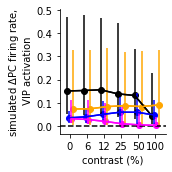

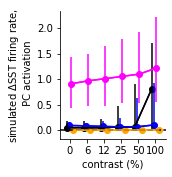

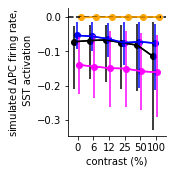

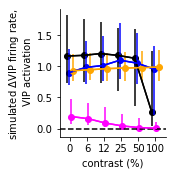

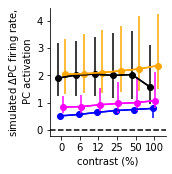

In [805]:
i,j = 0,2
isize = 3
ilight = 5
dir_lbls = ['baseline','vip_silencing','vip_activation']
idir = 0
# iconn = 0
small_lbl = ['pc','sst','vip','pv']
big_lbl = ['PC','SST','VIP','PV']
for idir in [0,1,2]:
    for i,j,ylim in zip([0,2,0,1,2,0],[2,0,1,0,2,0],[None for _ in range(6)]):
        plt.figure(figsize=(2.5,2.5))
        # for iconn in [0,3]:
        colors = np.array(((0,0,0),(0,0,1),(1,0,1),(1,0.65,0)))
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    #     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,3,4]],axis=1)
        cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,2,3,4]],axis=1)
        ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
        ut.erase_top_right()
        plt.xticks(np.arange(6),ucontrast)
        plt.axhline(0,c='k',linestyle='dashed')
        plt.xlabel('contrast (%)')
        plt.ylabel('simulated $\Delta$%s firing rate, \n %s activation'%(big_lbl[j],big_lbl[i]))
    #     plt.title(dir_lbls[idir])
        plt.tight_layout()
    #     plt.ylim((-2.5,5.5))
#         plt.savefig('figures/%s_%s_coupling_connection_deletion_%s.jpg'%(small_lbl[i],small_lbl[j],dir_lbls[idir]),dpi=300)

In [96]:
big_lbl

['PC', 'SST', 'VIP', 'PV']

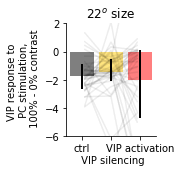

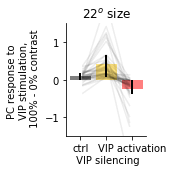

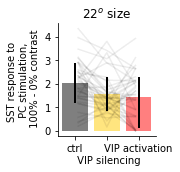

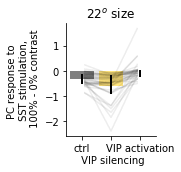

In [102]:
iconn = 0
for i,j,ylim in zip([0,2,0,1],[2,0,1,0],[(-6,2),(-1.5,1.5),None,None]):
    plt.figure(figsize=(2.5,2.5))
    icontrast1,icontrast2 = 0,5
    arr1,arr2,arr3 = [couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:] for idir in range(3)]
    data1,data2,data3 = [arr[:,icontrast2] - arr[:,icontrast1] for arr in [arr1,arr2,arr3]]
    datas = np.concatenate((data1[:,np.newaxis],data2[:,np.newaxis],data3[:,np.newaxis]),axis=1)
    colors = np.array(((0,0,0),(1,0.8,0),(1,0,0)))
    xticklabels = ['ctrl','\n VIP silencing','VIP activation']
    ut.plot_bars_with_lines(datas,colors=colors,xticklabels=xticklabels,errorstyle='pct',alpha=0.025)
#     plt.ylim((-2.5,1.5))
    plt.ylabel('%s response to \n %s stimulation, \n 100%% - 0%% contrast'%(big_lbl[j],big_lbl[i]))
    plt.title('22$^o$ size')
    ut.erase_top_right()
    plt.ylim(ylim)
    plt.tight_layout()
#     plt.savefig('figures/%s_%s_coupling_100_minus_0_contrast_vip_silencing_activation.jpg'%(small_lbl[i],small_lbl[j]),dpi=300)

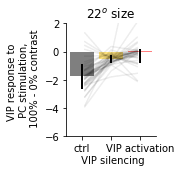

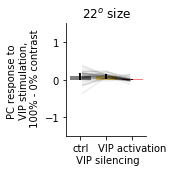

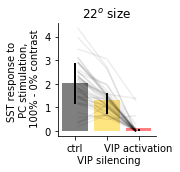

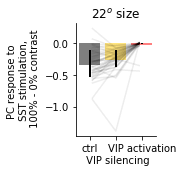

In [104]:
iconn = 0
for i,j,ylim in zip([0,2,0,1],[2,0,1,0],[(-6,2),(-1.5,1.5),None,None]):
    plt.figure(figsize=(2.5,2.5))
    icontrast1,icontrast2 = 0,5
    arr1,arr2,arr3 = [couplingses[idir][iconn][lkat][:,:,isize,:,i,j][:,-1,:] for idir in range(3)]
    data1,data2,data3 = [arr[:,icontrast2] - arr[:,icontrast1] for arr in [arr1,arr2,arr3]]
    datas = np.concatenate((data1[:,np.newaxis],data2[:,np.newaxis],data3[:,np.newaxis]),axis=1)
    colors = np.array(((0,0,0),(1,0.8,0),(1,0,0)))
    xticklabels = ['ctrl','\n VIP silencing','VIP activation']
    ut.plot_bars_with_lines(datas,colors=colors,xticklabels=xticklabels,errorstyle='pct',alpha=0.025)
#     plt.ylim((-2.5,1.5))
    plt.ylabel('%s response to \n %s stimulation, \n 100%% - 0%% contrast'%(big_lbl[j],big_lbl[i]))
    plt.title('22$^o$ size')
    ut.erase_top_right()
    plt.ylim(ylim)
    plt.tight_layout()
#     plt.savefig('figures/%s_%s_coupling_100_minus_0_contrast_vip_silencing_activation_max_current.jpg'%(small_lbl[i],small_lbl[j]),dpi=300)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

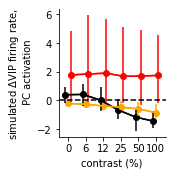

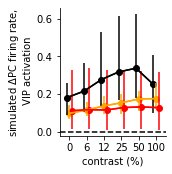

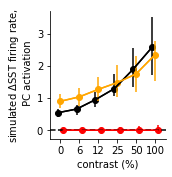

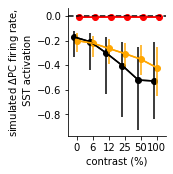

In [544]:
i,j = 0,2
isize = 3
ilight = 5
# dir_lbls = ['baseline','vip_silencing','vip_activation']
iconn = 0
small_lbl = ['pc','sst','vip','pv']
big_lbl = ['PC','SST','VIP','PV']
for i,j,ylim in zip([0,2,0,1],[2,0,1,0],[None,None,None,None]):
    plt.figure(figsize=(2.5,2.5))
    # for iconn in [0,3]:
    colors = np.array(((0,0,0),(1,0.65,0),(1,0,0)))
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,ilight,isize,:,i,j][:,np.newaxis] for iconn in [0,3,4]],axis=1)
#     cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),ilight_drmax[idir][iconn][lkat],:][:,np.newaxis] for iconn in [0,3,4]],axis=1)
    cpl = np.concatenate([couplingses[idir][iconn][lkat][:,:,isize,:,i,j][np.arange(lkat.sum()),-1,:][:,np.newaxis] for idir in [0,1,2]],axis=1)
    ut.plot_pct_errorbars_hillel(np.arange(6),cpl,delta=0.1,pct=(16,84),colors=colors)
    ut.erase_top_right()
    plt.xticks(np.arange(6),ucontrast)
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('contrast (%)')
    plt.ylabel('simulated $\Delta$%s firing rate, \n %s activation'%(big_lbl[j],big_lbl[i]))
#     plt.title(dir_lbls[idir])
    plt.tight_layout()
#     plt.ylim((-2.5,5.5))
#     plt.savefig('figures/%s_%s_coupling_vip_full_power_silencing_activation.jpg'%(small_lbl[i],small_lbl[j]),dpi=300)

In [670]:
couplingses[idir][iconn][lkat].shape

(89, 11, 6, 6, 8, 8)

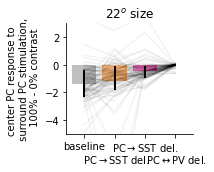

In [171]:
i,j = 4,0
plt.figure(figsize=(3,2.5))
icontrast1,icontrast2 = 0,5
idir = 0
ibaseline = 15
arrs = [couplingses[idir][iconn][lkat][:,ibaseline,isize,:,i,j]/baseline_means[lkat,j:j+1] for iconn in [0,4,3,2]]
# arr2 = couplingses[idir][4][lkat][:,0,isize,:,i,j]
# arr3 = couplingses[idir][3][lkat][:,0,isize,:,i,j]
# arr3 = couplingses[idir][3][lkat][:,0,isize,:,i,j]
datas = [arr[:,icontrast2] - arr[:,icontrast1] for arr in arrs]
datas = np.concatenate([d[:,np.newaxis] for d in datas],axis=1)
# colors = np.array(((0,0,0),(1,0.5,0),(1,0,1),(0,0,1))) # np.array((236, 0, 140))/255
colors = np.array(((0.5,0.5,0.5),(1,0.5,0),np.array((236, 0, 140))/255,(0,0,1))) # 
xticklabels = ['baseline','\n '+r'no PC$\rightarrow$SST',r'no PC$\rightarrow$VIP']
xticklabels = ['baseline','\n '+r'PC$\rightarrow$SST del.',r'PC$\rightarrow$SST del.','\n '+r'PC$\leftrightarrow$PV del.']
ut.plot_bars_with_lines(datas,colors=colors,xticklabels=xticklabels,errorstyle='pct',alpha=0.01)
# plt.ylim((-2.5,1.5))
plt.ylim((-5,3))
plt.ylabel('center PC response to \n surround PC stimulation, \n 100% - 0% contrast')
plt.title('22$^o$ size')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/far_pc_coupling_pcsst_pcvip_pcpv_deleted_no_opto_dynamic_range_bars_%s.jpg'%wtfile,dpi=300)
# plt.savefig('figures/far_pc_coupling_pcsst_pcvip_pcpv_deleted_no_opto_dynamic_range_bars.jpg',dpi=300)


In [181]:
plt.figure()
for i in range(1,4):
    print(sst.wilcoxon(datas[:,0],datas[:,i]))
    print((datas[:,0]<datas[:,i]).mean())

WilcoxonResult(statistic=1055.0, pvalue=0.0001059609599819009)
0.6966292134831461
WilcoxonResult(statistic=11.0, pvalue=3.7044382273599564e-16)
0.9775280898876404
WilcoxonResult(statistic=187.0, pvalue=1.1043445681079436e-13)
0.9101123595505618


<Figure size 432x288 with 0 Axes>

In [612]:
conn_lbls

['baseline',
 'pcpc_deleted',
 'pcpv_deleted',
 'pcvip_deleted',
 'pcsst_deleted',
 '']

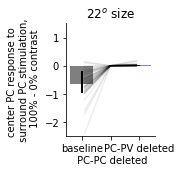

In [616]:
i,j = 4,0
plt.figure(figsize=(2.5,2.5))
icontrast1,icontrast2 = 0,5
idir = 0
arr1 = couplingses[idir][0][lkat][:,0,isize,:,i,j]
arr2 = couplingses[idir][1][lkat][:,0,isize,:,i,j]
arr3 = couplingses[idir][2][lkat][:,0,isize,:,i,j]
data1,data2,data3 = [arr[:,icontrast2] - arr[:,icontrast1] for arr in [arr1,arr2,arr3]]
datas = np.concatenate((data1[:,np.newaxis],data2[:,np.newaxis],data3[:,np.newaxis]),axis=1)
colors = np.array(((0,0,0),(0.5,0.5,0.5),(0,0,1)))
xticklabels = ['baseline','\n PC-PC deleted','PC-PV deleted']
ut.plot_bars_with_lines(datas,colors=colors,xticklabels=xticklabels,errorstyle='pct',alpha=0.025)
plt.ylim((-2.5,1.5))
plt.ylabel('center PC response to \n surround PC stimulation, \n 100% - 0% contrast')
plt.title('22$^o$ size')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/far_pc_coupling_pcpc_pcpv_deleted_no_opto_dynamic_range_bars.jpg',dpi=300)

In [618]:
sst.wilcoxon(data1,data2)

WilcoxonResult(statistic=8.0, pvalue=6.538886335515506e-08)

In [617]:
sst.wilcoxon(data1,data3)

WilcoxonResult(statistic=9.0, pvalue=7.047328131737219e-08)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

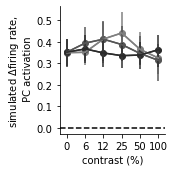

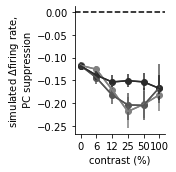

In [484]:
dr_up = compute_dr(network_resp_no_pcpv,ihigh,ibaseline)
dr_down = compute_dr(network_resp_no_pcpv,ilow,ibaseline)

dr_up = compute_dr(network_resp,ihigh,ibaseline)
dr_down = compute_dr(network_resp,ilow,ibaseline)

isizes = [0,2,4]
this_nsize = len(isizes)
cfrac = np.linspace(1,0,this_nsize+1)[:-1]
c_l23 = cfrac[:,np.newaxis]*np.array(((0.5,0.5,0.5)))
ucontrast = np.array((0,6,12,25,50,100))

plt.figure(figsize=(2.5,2.5))
ut.plot_pct_errorbars_hillel(np.arange(6),dr_up[:,isizes],pct=(16,84),colors=c_l23)
ut.erase_top_right()
plt.xticks(np.arange(6),ucontrast)
plt.axhline(0,c='k',linestyle='dashed')
plt.xlabel('contrast (%)')
plt.ylabel('simulated $\Delta$firing rate, \n PC activation')
plt.tight_layout()
# plt.savefig('figures/sim_pc_activation_size_contrast.eps')

plt.figure(figsize=(2.5,2.5))
ut.plot_pct_errorbars_hillel(np.arange(6),dr_down[:,isizes],pct=(16,84),colors=c_l23)
ut.erase_top_right()
plt.xticks(np.arange(6),ucontrast)
plt.axhline(0,c='k',linestyle='dashed')
plt.xlabel('contrast (%)')
plt.ylabel('simulated $\Delta$firing rate, \n PC suppression')
plt.tight_layout()
# plt.savefig('figures/sim_pc_suppression_size_contrast.eps')

IndexError: index 25 is out of bounds for axis 1 with size 21

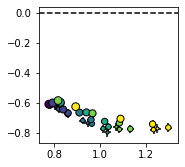

<Figure size 180x180 with 0 Axes>

In [244]:
ilight_halo = 5
ilight_chrimson = 25
ilight_off = 15

itype = 0
for ilight_light in [ilight_halo,ilight_chrimson]:
    plt.figure(figsize=(2.5,2.5))
    xdata = network_resp[:,ilight_off,:,itype].reshape((-1,6,6))
    ydata = network_resp[:,ilight_light,:,itype].reshape((-1,6,6))
    sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,equality_line=False,square=False)
    plt.axhline(0,c='k',linestyle='dashed')

In [164]:
baseline_means = np.nanmean(np.nanmean(nr_baseline,1),1)

In [220]:
# baseline_means = np.array([[0.59831338, 0.35549837, 0.51313612, 0.55155884, 0.64574025,
#         0.34655574, 0.59518061, 0.58903858],
#        [0.6265476 , 0.34923061, 0.54164721, 0.5681671 , 0.63051034,
#         0.34010741, 0.5577847 , 0.57693285],
#        [0.59679204, 0.34676945, 0.52189166, 0.56028437, 0.65235038,
#         0.34257354, 0.57661866, 0.61168981],
#        [0.61860379, 0.34527944, 0.54772243, 0.56384291, 0.64441281,
#         0.34184063, 0.55349653, 0.58074276],
#        [0.58789158, 0.35009168, 0.52939634, 0.54430732, 0.66362103,
#         0.34767499, 0.5846538 , 0.60003401],
#        [0.59291782, 0.35263042, 0.51683491, 0.54553352, 0.66039747,
#         0.34132553, 0.5833542 , 0.60365916],
#        [0.60017347, 0.35760101, 0.53087393, 0.54648481, 0.65724588,
#         0.34523342, 0.57593274, 0.61584633],
#        [0.60321257, 0.36201804, 0.54518945, 0.55704056, 0.63934964,
#         0.34414513, 0.57602136, 0.58330416],
#        [0.61985855, 0.35494893, 0.53100541, 0.56587596, 0.63809681,
#         0.33767655, 0.57127135, 0.5826782 ],
#        [0.6337915 , 0.36684552, 0.56249134, 0.55820205, 0.63542677,
#         0.35986559, 0.57526002, 0.56738551],
#        [0.58133546, 0.35969261, 0.52898627, 0.53926939, 0.63521507,
#         0.35654485, 0.58907064, 0.57950257],
#        [0.59334381, 0.34914416, 0.52413493, 0.55357249, 0.65358271,
#         0.34075513, 0.58094351, 0.60810346],
#        [0.6229475 , 0.33887916, 0.50158656, 0.55527576, 0.67790606,
#         0.32830246, 0.56107446, 0.59975661],
#        [0.62918207, 0.35728275, 0.53330385, 0.55993081, 0.63700887,
#         0.33478241, 0.57147606, 0.57082976],
#        [0.61987533, 0.35556566, 0.53003563, 0.5660793 , 0.63817799,
#         0.33855073, 0.56974955, 0.58266207],
#        [0.62130606, 0.33966456, 0.54252631, 0.56671314, 0.64070783,
#         0.34388147, 0.557594  , 0.57802311],
#        [0.59633712, 0.33884525, 0.51337476, 0.56680259, 0.64826807,
#         0.33114042, 0.56526297, 0.61135093],
#        [0.60435482, 0.34235315, 0.52042136, 0.54759793, 0.65358829,
#         0.3349741 , 0.56738013, 0.5949167 ],
#        [0.60652902, 0.35860612, 0.53202465, 0.53340975, 0.66695223,
#         0.34063732, 0.59042223, 0.59904684],
#        [0.59505849, 0.35037918, 0.51749801, 0.55190766, 0.65448164,
#         0.3437822 , 0.58179903, 0.59736471],
#        [0.60881141, 0.34350823, 0.50890577, 0.54746848, 0.66981339,
#         0.32785965, 0.5796606 , 0.60093404],
#        [0.59573781, 0.35551243, 0.52008963, 0.54351932, 0.65127021,
#         0.3358519 , 0.58307319, 0.61134802],
#        [0.57467885, 0.36238506, 0.55448267, 0.54540374, 0.64888756,
#         0.35985073, 0.60597712, 0.60359833],
#        [0.61031716, 0.34437362, 0.53374421, 0.56396754, 0.64682899,
#         0.34332756, 0.56136324, 0.59315743],
#        [0.59691754, 0.34754693, 0.52156733, 0.54896781, 0.65510974,
#         0.3477976 , 0.584276  , 0.60019573],
#        [0.60433676, 0.33740812, 0.5357699 , 0.5596085 , 0.64927753,
#         0.35019295, 0.56369259, 0.59534952],
#        [0.59477206, 0.34765887, 0.52406755, 0.54719822, 0.66087336,
#         0.34084777, 0.57911109, 0.60526538],
#        [0.59779211, 0.35268663, 0.53530254, 0.53236084, 0.65944701,
#         0.34224887, 0.57336747, 0.60857269],
#        [0.58760696, 0.36193739, 0.51811428, 0.53393953, 0.65967201,
#         0.35114788, 0.60076918, 0.60242812],
#        [0.59521486, 0.36100628, 0.52793885, 0.54633195, 0.63978666,
#         0.34984872, 0.58271682, 0.58862218],
#        [0.58939884, 0.35213705, 0.51389641, 0.56272665, 0.6415273 ,
#         0.3401448 , 0.58806834, 0.60982054],
#        [0.602281  , 0.35314865, 0.53921154, 0.5600508 , 0.65287089,
#         0.36204076, 0.56693775, 0.59928055],
#        [0.59412523, 0.35916063, 0.52690991, 0.54660787, 0.65128837,
#         0.34123831, 0.5870689 , 0.60490482],
#        [0.60699211, 0.3454768 , 0.52790262, 0.56330946, 0.64143862,
#         0.34141278, 0.567226  , 0.59398968],
#        [0.61378268, 0.35755217, 0.53552929, 0.5705591 , 0.63040611,
#         0.3406959 , 0.57577034, 0.58828259],
#        [0.5925918 , 0.3510916 , 0.51655915, 0.55198212, 0.65183567,
#         0.34164321, 0.57801761, 0.60028194],
#        [0.60782744, 0.34326956, 0.51338006, 0.55240886, 0.65578585,
#         0.33145766, 0.57153699, 0.59662429],
#        [0.61030691, 0.35137403, 0.51682947, 0.54643225, 0.66148844,
#         0.34014595, 0.59146567, 0.59555849],
#        [0.59683196, 0.35356511, 0.52402187, 0.54995853, 0.65430141,
#         0.3436042 , 0.58231101, 0.59884811],
#        [0.59689038, 0.34440889, 0.51114369, 0.556719  , 0.65460368,
#         0.33436453, 0.57976683, 0.61492735],
#        [0.61063166, 0.33919542, 0.56089403, 0.55216501, 0.66470513,
#         0.33955091, 0.59658192, 0.59858606],
#        [0.58701714, 0.35704727, 0.5236891 , 0.54968726, 0.6518909 ,
#         0.34765458, 0.58933628, 0.59849969],
#        [0.59990149, 0.34836492, 0.51958461, 0.55716097, 0.65885699,
#         0.33968352, 0.57664162, 0.60576834],
#        [0.59694654, 0.3464038 , 0.52374633, 0.54977665, 0.66122195,
#         0.34449883, 0.5853189 , 0.60273561],
#        [0.65120049, 0.33954125, 0.54040651, 0.51722581, 0.67328761,
#         0.33327224, 0.55106821, 0.53336779],
#        [0.60840005, 0.3473019 , 0.53043556, 0.5641516 , 0.64855635,
#         0.33215873, 0.55930192, 0.58975616],
#        [0.62388476, 0.35986013, 0.53573582, 0.55946061, 0.63794728,
#         0.34419251, 0.57789695, 0.57554619],
#        [0.62297374, 0.34636133, 0.52815991, 0.56241457, 0.62872585,
#         0.33424577, 0.54749527, 0.58065665],
#        [0.60050844, 0.34099459, 0.54504177, 0.55476824, 0.65316316,
#         0.34684159, 0.58181924, 0.59961913],
#        [0.60155257, 0.34878884, 0.52087341, 0.54718062, 0.66071343,
#         0.33676885, 0.57822898, 0.61022139],
#        [0.58198723, 0.34972248, 0.52927077, 0.55821027, 0.64536313,
#         0.3418553 , 0.5870924 , 0.61098037],
#        [0.61213105, 0.35053634, 0.53923597, 0.56239964, 0.64263447,
#         0.33672872, 0.55913963, 0.58509281],
#        [0.58936732, 0.36539038, 0.54921689, 0.5237981 , 0.66705495,
#         0.35915088, 0.60725801, 0.57933693],
#        [0.61615439, 0.33066458, 0.55410959, 0.57037352, 0.65613778,
#         0.33120541, 0.57941668, 0.60688325],
#        [0.625894  , 0.348715  , 0.54346152, 0.56415978, 0.63259358,
#         0.33650277, 0.56284886, 0.58191327],
#        [0.60211785, 0.34668084, 0.523573  , 0.54557858, 0.66265444,
#         0.33885493, 0.57984266, 0.59812823],
#        [0.59855296, 0.36968609, 0.54197057, 0.53585581, 0.6511861 ,
#         0.36021011, 0.59404249, 0.58871617],
#        [0.62843037, 0.34879434, 0.54229709, 0.56778858, 0.63142666,
#         0.34319905, 0.56205792, 0.57492118],
#        [0.5927688 , 0.34527442, 0.49793411, 0.54574195, 0.66450065,
#         0.33039104, 0.57617666, 0.61710057],
#        [0.60406119, 0.35875433, 0.54956257, 0.53365208, 0.6594716 ,
#         0.35346021, 0.60183476, 0.58777614],
#        [0.59526878, 0.34749177, 0.51870073, 0.54648902, 0.65726142,
#         0.34726374, 0.57613619, 0.60045126],
#        [0.60660005, 0.35416514, 0.53697648, 0.56043503, 0.64549828,
#         0.33532109, 0.56411131, 0.58925566],
#        [0.60842465, 0.34421012, 0.53539901, 0.56209555, 0.63957292,
#         0.34074013, 0.56858658, 0.59243453],
#        [0.61473282, 0.35256789, 0.53516666, 0.57486699, 0.63230653,
#         0.3380375 , 0.57276818, 0.59377776],
#        [0.6211122 , 0.35327199, 0.54077641, 0.56390877, 0.64282777,
#         0.33971135, 0.5650289 , 0.57893578],
#        [0.58294971, 0.33812488, 0.52052847, 0.53734049, 0.6365689 ,
#         0.33266974, 0.57214732, 0.58970447],
#        [0.62956028, 0.35010039, 0.54179091, 0.57512075, 0.63205441,
#         0.34433374, 0.56168134, 0.5827494 ],
#        [0.62659754, 0.34472716, 0.54350461, 0.57058743, 0.62742225,
#         0.33956053, 0.55040283, 0.5770076 ],
#        [0.59923069, 0.35439905, 0.51828958, 0.5402098 , 0.65918209,
#         0.33617281, 0.58254057, 0.60986601],
#        [0.62736367, 0.34640895, 0.54057705, 0.56929242, 0.62751134,
#         0.34066039, 0.54916904, 0.57419591],
#        [0.59574271, 0.34802372, 0.52002067, 0.55648656, 0.65505093,
#         0.339906  , 0.57713335, 0.60255662],
#        [0.59423262, 0.34371505, 0.51203301, 0.54915374, 0.6654685 ,
#         0.33467362, 0.57378131, 0.60978497],
#        [0.58954233, 0.35256176, 0.5063121 , 0.54336619, 0.66585167,
#         0.33905305, 0.59700087, 0.60716696],
#        [0.60045113, 0.34683458, 0.52304444, 0.55471168, 0.65831702,
#         0.33956933, 0.58081354, 0.59888364],
#        [0.61235416, 0.33866034, 0.55600223, 0.55518246, 0.65710437,
#         0.3419231 , 0.57664617, 0.60047962],
#        [0.60462359, 0.35259595, 0.51782979, 0.54860749, 0.65855678,
#         0.34073501, 0.59211647, 0.59470529],
#        [0.59636877, 0.33572402, 0.52890977, 0.5388083 , 0.65399464,
#         0.33802407, 0.57377038, 0.59704542],
#        [0.57989435, 0.35852015, 0.53772125, 0.53513243, 0.64565645,
#         0.3518621 , 0.59223959, 0.5945779 ],
#        [0.60751352, 0.35492049, 0.53172317, 0.55689148, 0.6491295 ,
#         0.34311502, 0.57413573, 0.59007942],
#        [0.62450636, 0.35085525, 0.53672033, 0.57989343, 0.6271839 ,
#         0.34498589, 0.55662581, 0.5871242 ],
#        [0.60837981, 0.34529528, 0.51414941, 0.55386534, 0.6601044 ,
#         0.3348662 , 0.57879549, 0.59624705],
#        [0.57519317, 0.36406058, 0.53673922, 0.53318789, 0.64520452,
#         0.3587238 , 0.60065814, 0.57963651],
#        [0.62553152, 0.34770581, 0.54018849, 0.57062741, 0.63143232,
#         0.33561207, 0.55637432, 0.57675888],
#        [0.5912793 , 0.35150322, 0.52660686, 0.54300284, 0.66157724,
#         0.34515457, 0.58367699, 0.59569782],
#        [0.60241205, 0.34761271, 0.52328202, 0.54534927, 0.6661152 ,
#         0.34695845, 0.58420586, 0.5983913 ],
#        [0.61836786, 0.34337438, 0.54278101, 0.57081906, 0.64192105,
#         0.33822547, 0.5527026 , 0.58523409],
#        [0.59675821, 0.34115926, 0.50416873, 0.56490096, 0.65854256,
#         0.33243862, 0.5755263 , 0.61556931],
#        [0.60008824, 0.34536309, 0.52030026, 0.55841849, 0.65631918,
#         0.34243125, 0.57883228, 0.60488374],
#        [0.58814142, 0.35713312, 0.52296313, 0.54473361, 0.66293388,
#         0.33557458, 0.57020459, 0.61824048],
#        [0.59818702, 0.35239576, 0.51449503, 0.55312701, 0.65331528,
#         0.34031815, 0.58788006, 0.59948916],
#        [0.59846369, 0.36334998, 0.52072568, 0.53213235, 0.65525295,
#         0.34477418, 0.60033157, 0.59377913],
#        [0.59899126, 0.34824649, 0.51579282, 0.54458886, 0.66264524,
#         0.33853972, 0.5783941 , 0.62054105],
#        [0.59094396, 0.3443464 , 0.50716563, 0.56115531, 0.65401453,
#         0.33173801, 0.56924787, 0.62486433],
#        [0.60339526, 0.3532665 , 0.53585583, 0.52897575, 0.66335377,
#         0.33930498, 0.58313202, 0.5995259 ]])

In [87]:
conn_lbls

['baseline',
 'pcpc_deleted',
 'pcpv_deleted',
 'pcvip_deleted',
 'pcsst_deleted',
 '']

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


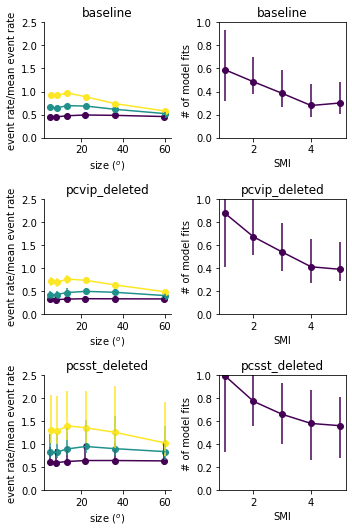

In [66]:
conn_lbls = ['baseline','pcpc_deleted','pcpv_deleted','pcvip_deleted','pcsst_deleted','']
reload(ut)
ialign = 0
irun = 0
idir = 0

ylim = (0,2.5)
plt.figure(figsize=(5,7.5))
iplot = 0    

for iconn,ylim in zip([0,3,4],[ylim for _ in range(4)]):

    nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    these_types = [1]
    for itype in these_types:#range(len(rsexpt)):
        for _ in range(1): #[0,4]):
            data = nr[:,:,:,itype-1]
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            plt.subplot(3,2,iplot+1)
            ut.plot_pct_errorbars_hillel(usize,data[:,:,[1,3,5]].transpose((0,2,1)),pct=(16,84),delta=0.1)#,colors=colors[itype][iisize][np.newaxis])
#             plt.xticks(np.arange(6),usize)
    #         plt.legend(['6%','25%','100%'])
            plt.xlabel('size ($^o$)')
            plt.ylabel('event rate/mean event rate')
#         plt.legend(['PC','SST','VIP'],frameon=False)
#         plt.title('%d$^o$ size'%usize[isize])
            plt.ylim(ylim)
            ut.erase_top_right()
            plt.tight_layout()
            plt.title(conn_lbls[iconn])
            iplot += 1
        for _ in range(1):#range(len(rsexpt)):
            data = nr[:,:,:,itype-1]
            plt.subplot(3,2,iplot+1)
            smi = (data[:,-1,:]-data[:,:,:].min(1).min(1)[:,np.newaxis])/(data[:,:,:].max(1)-data[:,:,:].min(1).min(1)[:,np.newaxis])
#             smi = (data[:,-1,:]-0*data[:,:,:].min(1).min(1)[:,np.newaxis])/(data[:,:,:].max(1)-0*data[:,:,:].min(1).min(1)[:,np.newaxis])
            bins = np.linspace(0,1,20)
            icontrast1,icontrast2 = 1,-1
#             plt.hist(smi[:,icontrast1]-smi[:,icontrast2],bins=bins,alpha=0.5)
            ut.plot_pct_errorbars_hillel(np.arange(1,6),smi[:,np.newaxis,1:])
            plt.ylim((0,1))
            plt.title(conn_lbls[iconn])
            plt.xlabel('SMI')
            plt.ylabel('# of model fits')
            iplot += 1
#             ut.plot_pct_errorbars_hillel(usize,data[:,:,[1,3,5]].transpose((0,2,1)),pct=(16,84),delta=0.1)#,colors=colors[itype][iisize][np.newaxis])
#     plt.savefig('figures/sim_pc_tuning_baseline_pcsst.eps')

/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = a

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = a

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = a

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Docum

plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = a

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


/Users/dan/Documents/code/adesnal/pyute.py:929: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  arr_norm = arr/mn[slicer]
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting


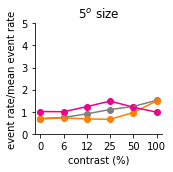

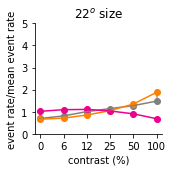

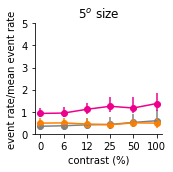

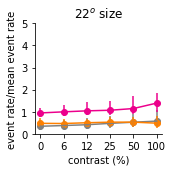

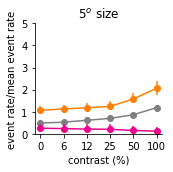

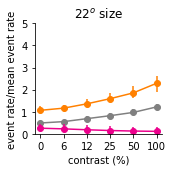

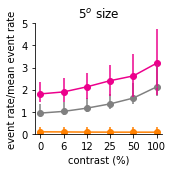

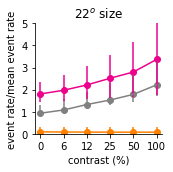

In [114]:
reload(ut)
ialign = 0
irun = 0
idir = 0

# ylim = (0,2.5)
ylim = (0,5)

for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))
    nr_baseline = network_resps[0][0][:,15].reshape((-1,6,6,8))

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(2)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(2)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(2)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    for iisize,isize in enumerate([0,3]): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = ut.norm_to_mean(nr[:,:,:,itype-1],nr_baseline[:,:,:,itype-1])[lkat]
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
#             ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            ut.plot_pct_errorbars_hillel(np.arange(6),data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
            plt.xticks(np.arange(6),ucontrast)
    #         plt.legend(['6%','25%','100%'])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean event rate')
#         plt.legend(['PC','SST','VIP'],frameon=False)
        plt.title('%d$^o$ size'%usize[isize])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        plt.savefig('figures/sim_pc_sst_vip_%s_contrast_by_size_%d.eps'%(conn_lbls[iconn],isize))

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


linewidth: 1
plotting
linewidth: 1
plotting
linewidth: 1
plotting


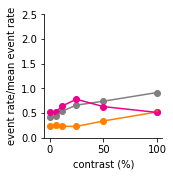

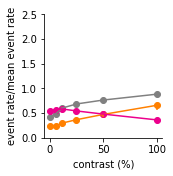

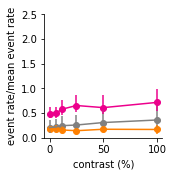

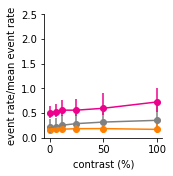

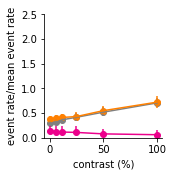

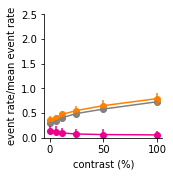

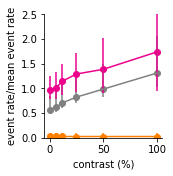

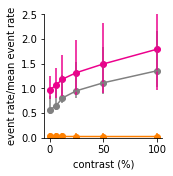

In [159]:
reload(ut)
ialign = 0
irun = 0
idir = 0

ylim = (0,2.5)

for iconn,ylim in zip([0,2,3,4],[ylim for _ in range(4)]):

    nr = network_resps[0][iconn][:,15].reshape((-1,6,6,8))

    lbls = ['pc_l4','pc_l23','sst','vip','pv']
    c_l4 = np.array((0,0.5,0))
    c_l23 = [np.array((0.5, 0.5, 0.5)) for i in range(2)]#[np.array((0.33,0.33,0.33)),np.array((0.5,0.5,0.5))][::-1]
    c_sst = [np.array((1, 0.5, 0)) for i in range(2)]#[np.array((0.75,0.45,0)),np.array((1,0.65,0))][::-1]
    c_vip = [np.array((236, 0, 140))/255 for i in range(2)]#[np.array((0.75,0,0.75)),np.array((1,0,1))][::-1]
    c_pv = np.array((0,0,1))
    colors = [c_l4,c_l23,c_sst,c_vip,c_pv]
    usize = [5,8,13,22,36,60]
    ucontrast = [0,6,12,25,50,100]

    for iisize,isize in enumerate([0,3]): #[0,4]):
        plt.figure(figsize=(2.5,2.5))
        these_types = [1,2,3]
        for itype in these_types:#range(len(rsexpt)):
            data = nr[:,:,:,itype-1]
#             data = data/np.nanmean(np.nanmean(data,1),1)[:,np.newaxis,np.newaxis]
        #     for icontrast in range(6):
            #     plt.errorbar([5,8,13,22,36,60],np.nanmean(data,0)[:,icontrast],compute_sem(data,0)[:,icontrast])
            ut.plot_pct_errorbars_hillel(ucontrast,data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
#             ut.plot_pct_errorbars_hillel(np.arange(6),data[:,isize:isize+1,:],pct=(16,84),colors=colors[itype][iisize][np.newaxis])
#             plt.xticks(np.arange(6),ucontrast)
    #         plt.legend(['6%','25%','100%'])
            plt.xlabel('contrast (%)')
            plt.ylabel('event rate/mean event rate')
#         plt.legend(['PC','SST','VIP'],frameon=False)
#         plt.title('%d$^o$ size'%usize[isize])
        plt.ylim(ylim)
        ut.erase_top_right()
        plt.tight_layout()
        plt.savefig('figures/sim_pc_sst_vip_%s_linear_contrast_by_size_%d.eps'%(conn_lbls[iconn],isize))

In [37]:
data.shape

(94, 6, 6)

In [17]:
conn_lbls

NameError: name 'conn_lbls' is not defined

In [714]:
nr.shape

(94, 31, 36, 8)

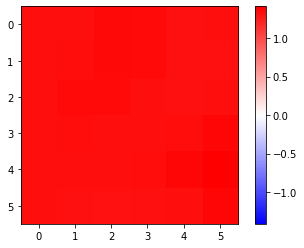

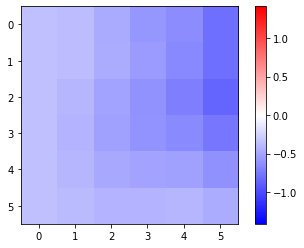

In [219]:
mx = np.maximum(np.max(np.abs(np.nanmean(dr_up,0))),np.max(np.abs(np.nanmean(dr_down,0))))
plt.figure()
ut.imshow_hot_cold(np.nanmean(dr_up,0),mx=mx)
plt.colorbar()
plt.figure()
ut.imshow_hot_cold(np.nanmean(dr_down,0),mx=mx)
plt.colorbar()

In [489]:
network_resp.shape

(38, 31, 36, 8)

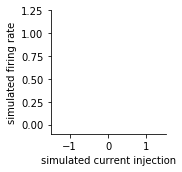

In [23]:
iwt = 0
istim = 0
itype = 0
this_mdl,this_YY = mdls_no_pcpc.copy(),YY_opto_no_pcpc.copy()
# this_mdl,this_YY = mdls_no_pcpv.copy(),YY_opto_no_pcpv.copy()
# this_mdl,this_YY = mdls.copy(),YY_opto.copy()
network_resp = np.nanmean(YY_opto[iwt][:,istim,:,itype],1)
network_resp_no_pcpc = np.nanmean(YY_opto_no_pcpc[iwt][:,istim,:,itype],1)

cell_intrinsic_resp = np.zeros_like(opto_levels)
for ilevel in range(opto_levels.shape[0]):
    cell_intrinsic_resp[ilevel] = this_mdl[iwt].compute_f_(opto_levels[ilevel]+this_mdl[iwt].Eta,this_mdl[iwt].Xi,this_mdl[iwt].s02)[istim,itype]

plt.figure(figsize=(2.5,2.5))
plt.plot(opto_levels,cell_intrinsic_resp,c='k',linestyle='dashed',label='cell-intrinsic nonlinearity')
plt.plot(opto_levels,network_resp,c='k',label='baseline')
plt.plot(opto_levels,network_resp_no_pcpc,c=np.array((0.5,0.5,0.5)),label='PC$\leftrightarrow$PC weights deleted')
# plt.legend()
plt.xlim((-1.5,1.5))
plt.ylim((-0.1,1.25))
ut.erase_top_right()
plt.xlabel('simulated current injection')
plt.ylabel('simulated firing rate')
# plt.title('PC$\leftrightarrow$PC weights deleted')
plt.tight_layout()
# plt.savefig('figures/network_nonlinearity_w_and_wo_wpcpc.eps')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


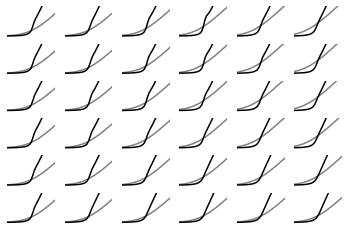

In [199]:
iwt = 0
istim = 0
itype = 0
ibaseline = 15
ilow = 10
ihigh = 20
# this_mdl,this_YY = mdls_no_pcpc.copy(),YY_opto_no_pcpc.copy()
# this_mdl,this_YY = mdls_no_pcpv.copy(),YY_opto_no_pcpv.copy()
this_mdl,this_YY = mdls.copy(),YY_opto.copy()
dr,dr_intrinsic,dr_up,dr_down = [np.zeros((6,6)) for ivar in range(4)]
plt.figure()
for istim in range(this_mdl[iwt].nN):
    network_resp = np.nanmean(this_YY[iwt][:,istim,:,itype],1)

    cell_intrinsic_resp = np.zeros_like(opto_levels)
    for ilevel in range(opto_levels.shape[0]):
        cell_intrinsic_resp[ilevel] = this_mdl[iwt].compute_f_(opto_levels[ilevel]+this_mdl[iwt].Eta,this_mdl[iwt].Xi,this_mdl[iwt].s02)[istim,itype]

    # plt.figure(figsize=(2.5,2.5))
        plt.subplot(6,6,istim+1)
    dr[np.unravel_index(istim,(6,6))] = (network_resp[ibaseline+1]-network_resp[ibaseline-1])
    dr_intrinsic[np.unravel_index(istim,(6,6))] = (cell_intrinsic_resp[ibaseline+1]-cell_intrinsic_resp[ibaseline-1])
    dr_up[np.unravel_index(istim,(6,6))] = network_resp[ihigh] - network_resp[ibaseline]
    dr_down[np.unravel_index(istim,(6,6))] = network_resp[ilow] - network_resp[ibaseline]

    plt.plot(opto_levels,cell_intrinsic_resp,c=np.array((0.5,0.5,0.5)))
    plt.plot(opto_levels,network_resp,c='k')
    plt.xlim((-1.5,1.5))
    plt.ylim((-0.1,2))
#     plt.axvline(0,c='k',linestyle='dashed')
    ut.erase_top_right()
    plt.axis('off')
#     plt.xlabel('simulated current injection')
#     plt.ylabel('simulated firing rate')
#     plt.title('PC$\leftrightarrow$PC weights deleted')
#     plt.tight_layout()
# plt.savefig('figures/intrinsic_vs_network_nonlinearity_no_wpcpc.eps')

In [215]:
dr_up.shape

(38, 6, 6)

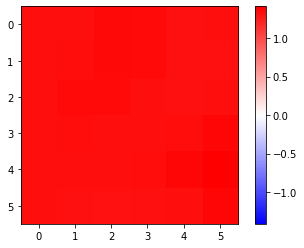

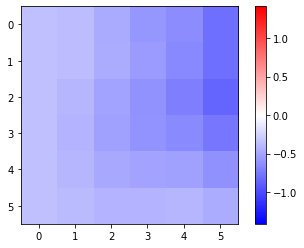

In [217]:
mx = np.maximum(np.max(np.abs(np.nanmean(dr_up,0))),np.max(np.abs(np.nanmean(dr_down,0))))
plt.figure()
ut.imshow_hot_cold(np.nanmean(dr_up,0),mx=mx)
plt.colorbar()
plt.figure()
ut.imshow_hot_cold(np.nanmean(dr_down,0),mx=mx)
plt.colorbar()

In [171]:
np.max(dr.flatten())/np.min(dr.flatten())

2.1796586135230056

In [172]:
np.max(dr_intrinsic.flatten())/np.min(dr_intrinsic.flatten())

1.6718681929343882

In [209]:
# nwt = 20
# YY_opto = YY_opto[:nwt]
# YY_ss = YY_ss[:nwt]

In [210]:
# ut.mkdir('../shared_data/calnet_data/dynamics/')
# np.save('../shared_data/calnet_data/dynamics/200724a.npy',YY_opto)
# YY_opto = np.load('../shared_data/calnet_data/dynamics/200724a.npy',allow_pickle=True)[()]

In [214]:
shp = YY_opto[0].shape
YY_opto_small = np.nan*np.ones((nwt,shp[0],shp[1],shp[3]))
tlast = 3000
for iwt in range(nwt):
    if not YY_opto[iwt] is None:
        YY_opto_small[iwt] = np.nanmean(YY_opto[iwt][:,:,-tlast:,:],2)
    

In [215]:
Niter = 1001

In [216]:
shp = YY_opto[0].shape
Niter = 101
YY_opto_medium = np.nan*np.ones((nwt,shp[0],shp[1],Niter,shp[3]))
for iwt in range(nwt):
    if not YY_opto[iwt] is None:
        YY_opto_medium[iwt] = YY_opto[iwt][:,:,::10,:]
        
# Niter = 1001
# YY_opto_medium = YY_opto.copy()
    

In [217]:
# del YY_opto

In [218]:
# np.save('YY_opto_medium_200921a.npy',YY_opto_medium)
# YY_opto_medium = np.load('YY_opto_medium_200921a.npy')[()]

In [457]:
YY_opto_medium.shape

(91, 17, 36, 101, 8)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


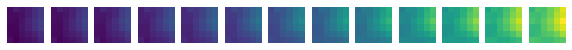

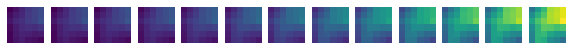

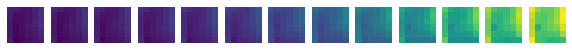

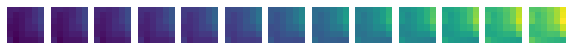

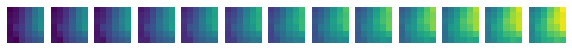

...

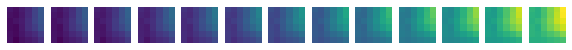

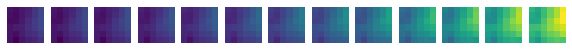

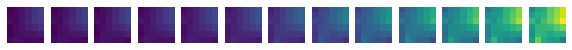

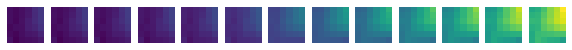

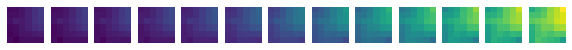

In [220]:
sc_opto = np.zeros((nwt,YY_opto_medium.shape[1],6,6))
for iwt in range(nwt):
    mag = 2
    for itype in range(1):
        plt.figure(figsize=(5*mag,mag))
        data = YY_opto_medium[iwt][:,:,:,itype].reshape((-1,6,6,Niter))
        data = np.nanmean(data[:,:,:,:],-1)
        slc = slice(2,-2)
        data = data[slc] #- data[5:6]
        sc_opto[iwt,slc] = data
        nopto = data.shape[0]
        for iopto in range(nopto):
            plt.subplot(1,nopto,iopto+1)
            plt.imshow(data[iopto],vmin=data.min(),vmax=data.max())
            plt.axis('off')

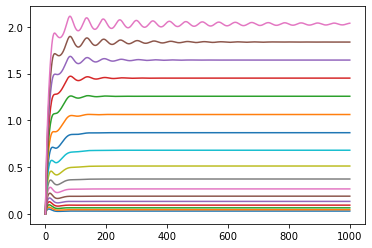

In [278]:
plt.figure()
plt.plot(YY_opto[0][:,18,:,2].T)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


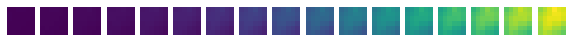

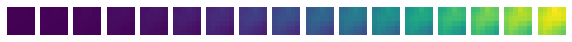

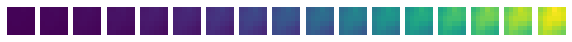

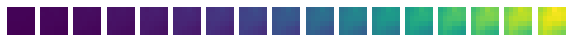

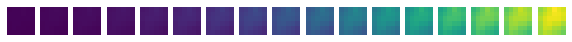

...

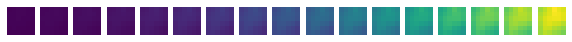

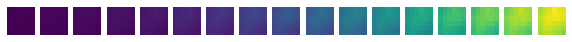

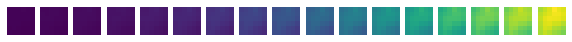

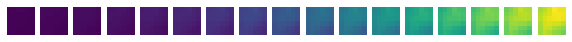

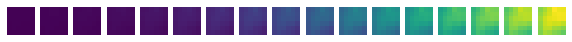

In [76]:
sc_opto = np.zeros((nwt,YY_opto_medium.shape[1],6,6))
for iwt in range(nwt):
    mag = 2
    for itype in range(2,3):
        plt.figure(figsize=(5*mag,mag))
        data = YY_opto_medium[iwt][:,:,:,itype].reshape((-1,6,6,Niter))
        data = np.nanmean(data[:,:,:,:],-1)
        data = data #- data[5:6]
        sc_opto[iwt] = data
        nopto = data.shape[0]
        for iopto in range(nopto):
            plt.subplot(1,nopto,iopto+1)
            plt.imshow(data[iopto],vmin=data.min(),vmax=data.max())
            plt.axis('off')

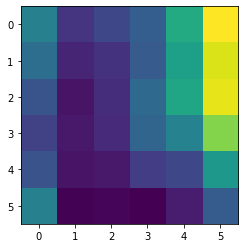

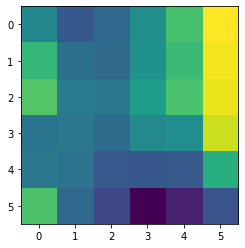

In [456]:
plt.figure()
plt.imshow(YY_opto_tavg[0,8,:,:,0])
plt.figure()
plt.imshow(YY_opto_tavg[0,16,:,:,0])

In [221]:
opto_levels[8]

0.0

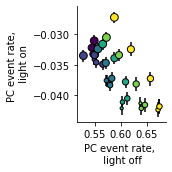

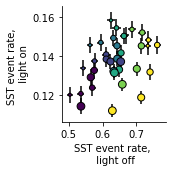

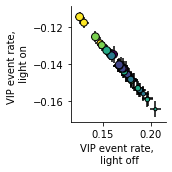

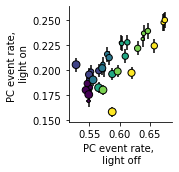

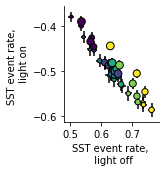

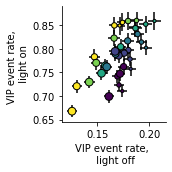

In [281]:
reload(ut)
reload(sca)
lbls = ['PC','SST','VIP','PV']
opto_lbls = ['halo','chrimson']
average_last = int(np.floor(Niter/5))
nopto = len(opto_levels)
ncelltypes = YY_opto_medium[0].shape[-1]
YY_opto_tavg = amps[:,np.newaxis,np.newaxis,np.newaxis,:]*np.nanmean(YY_opto_medium[:,:,:,-average_last:,:],3).reshape((nwt,nopto,6,6,ncelltypes)) + bltiles[:,np.newaxis,np.newaxis,np.newaxis,:]
# YY_opto_tavg = np.zeros((nwt,nopto,6,6,ncelltypes))
# for iwt in range(nwt):
#     YY_opto_tavg[iwt] = amps[iwt]*np.nanmean(YY_opto_medium[iwt][:,:,:,:],2).reshape((nopto,6,6,ncelltypes)) + bltiles[iwt]
iwt = -1
ilight1 = 5
for iilight2,ilight2 in enumerate([2,10]):
    for itype in range(3):
        plt.figure(figsize=(2.5,2.5))
        xdata = YY_opto_tavg[:,ilight1,:,:,itype]
        ydata = YY_opto_tavg[:,ilight2,:,:,itype]
        sca.scatter_size_contrast_errorbar(xdata,ydata-xdata,mn=0,equality_line=False,square=False)
        ut.erase_top_right()
#         ut.zero_origin('xy')
        plt.xlabel('%s event rate, \n light off'%lbls[itype])
        plt.ylabel('%s event rate, \n light on'%lbls[itype])
        plt.tight_layout()
#         plt.savefig('figures/finite_%s_%s_scatter_light_on_light_off.eps'%(opto_lbls[iilight2],lbls[itype]))

In [621]:
fit_lbl = '201128b'
npyfile = np.load('../shared_data/calnet_data/dynamics/opto_tavg_%s.npy'%fit_lbl,allow_pickle=True)[()]
shp = npyfile['YY_opto'].shape
YY_opto_tavg = npyfile['YY_opto'].reshape(shp[:2]+(6,6)+shp[3:])
weights_files = glob.glob('../shared_data/calnet_data/weights/weights_%s/*.npy'%fit_lbl)
weights_files.sort()

In [232]:
npyfile['YY_opto'].shape

(372, 1, 36, 8)

In [623]:
nwt = len(weights_files)
mdls = [None for iwt in range(nwt)]
for iwt in range(nwt):
    wtdict = np.load(weights_files[iwt],allow_pickle=True)[()]
    mdls[iwt] = cc.ModelOri(wtdict,nT=1)

/Users/dan/Documents/code/adesnal/calnet/utils.py:631: RuntimeWarning: divide by zero encountered in true_divide
  u = mu/np.sqrt(2*s2)


In [624]:
opto_levels = np.linspace(-2,2,21)
nopto = opto_levels.size

In [231]:
import calnet.utils
import sim_utils
nfiles = len(weights_files)
# Ts = np.zeros((nfiles,nQ))
iwt = 0
nN,nP,nQ,nS,nT = mdls[iwt].nN,mdls[iwt].nP,mdls[iwt].nQ,mdls[iwt].nS,mdls[iwt].nT
Ks = np.zeros((nfiles,nQ))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
Etas = np.zeros((nfiles,6,6,nQ*nS*nT))
# Eta1s = np.zeros((nfiles,6,6,nQ*nS*nT))
# Eta2s = np.zeros((nfiles,6,6,nQ*nS*nT))
h1s = np.zeros((nfiles,))
h2s = np.zeros((nfiles,))
losses = np.zeros((nfiles,))
couplings = np.zeros((nfiles,nopto,6,6,nQ*nS*nT,nQ*nS*nT))
phis = np.zeros((nfiles,nopto,6,6,nQ*nS*nT))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    try:
        Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2,bl = Wstar_dict['as_list']
        amp = np.ones((nQ*nS*nT,))
    except:
        Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2,bl,amp = Wstar_dict['as_list']
    losses[iwt] = Wstar_dict['loss']
#     Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h1,h2,h3,Eta1,Eta2,Eta3 = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T,nS=nS,nT=nT)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T,nS=nS,nT=nT)
    tiled_s02 = np.tile(s02,nS*nT)
#     Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YY0 = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02)
    YYs[iwt] = amp*YY0.reshape((6,6,nQ*nS*nT)) + np.tile(bl,nS*nT)[np.newaxis]
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    Etas[iwt] = Eta.reshape((6,6,nQ*nS*nT))
    h1s[iwt] = h1
    h2s[iwt] = h2
    bltile = np.tile(bl,nS*nT)
    for ilight in range(YY_opto_tavg.shape[1]):
        this_YY = 1/amp[np.newaxis,:]*(YY_opto_tavg[iwt,ilight].reshape((nN,nQ*nS*nT)) - bltile[np.newaxis,:])
#         this_YY = YY_opto_tavg[iwt,ilight].reshape((nN,nQ*nS*nT))
        phis[iwt,ilight] = mdls[iwt].fprimeXY(mdls[iwt].XX,this_YY).reshape((6,6,nQ*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
#         phis[iwt,iistim,jjstim] = calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02)
        for ilight in range(nopto):
            Phi = np.diag(phis[iwt,ilight,iistim,jjstim])
            couplings[iwt,ilight,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)

NameError: name 'nopto' is not defined

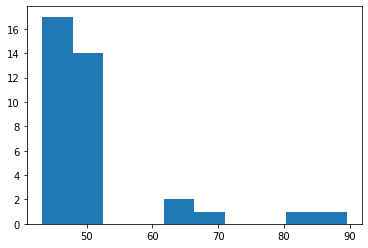

In [626]:
plt.figure()
plt.hist(losses[losses<100])
low_loss = (losses<60)

In [640]:
ilight_halo = 8
ilight_chrimson = 16
ilight_off = 10

In [628]:
# top_smimi = np.array([73])
# top_smimi = np.array([79, 60, 73])
# top_smimi = np.array([34, 60, 73, 78, 79])
# top_smimi = np.array([ 5, 19, 34, 60, 73, 78, 79, 87, 88])

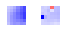

In [629]:
reload(ut)
plt.figure()
for iwt in range(nwt):
    if iwt in top_smimi:
        plt.subplot(10,10,iwt+1)
        mx = np.max(np.abs(couplings[iwt,:,:,:,4,0]))
        ut.imshow_hot_cold(couplings[iwt,ilight_off,:,:,4,0],mx=mx)
        plt.axis('off')
# plt.colorbar()

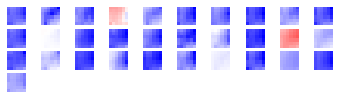

In [630]:
plt.figure()
for iwt in range(np.minimum(low_loss.sum(),100)):
    plt.subplot(10,10,iwt+1)
    mx = np.max(np.abs(couplings[low_loss][iwt,:,:,:,4,0]))
    ut.imshow_hot_cold(couplings[low_loss][iwt,ilight_off,:,:,4,0],mx=mx)
    plt.axis('off')
# plt.colorbar()

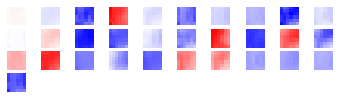

In [631]:
plt.figure()
for iwt in range(np.minimum(low_loss.sum(),100)):
    plt.subplot(10,10,iwt+1)
    mx = np.max(np.abs(couplings[low_loss][iwt,:,:,:,4,0]))
    ut.imshow_hot_cold(couplings[low_loss][iwt,ilight_chrimson,:,:,4,0],mx=mx)
    plt.axis('off')
# plt.colorbar()

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


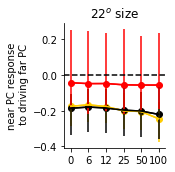

In [642]:
i,j = 4,0
plt.figure(figsize=(2.5,2.5))
ucontrast = np.array((0,6,12,25,50,100))
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_pct_errorbars_hillel(np.arange(6),couplings[low_loss][:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j],pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')
plt.ylabel(r'near PC response'+'\n to driving far PC')
plt.title('22$^o$ size')
plt.xticks(np.arange(6),ucontrast)
plt.tight_layout()
# plt.savefig('figures/far_pc_near_pc_coupling_sim_vip_opto.eps')


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


1.1831634290806285


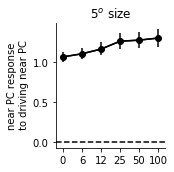

In [633]:
i,j = 0,0
plt.figure(figsize=(2.5,2.5))
ucontrast = np.array((0,6,12,25,50,100))
isize = 0
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),couplings[low_loss][:,[ilight_off]][:,:,isize,:,i,j],pct=(16,84),colors=colors[1:2])
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')
plt.ylabel(r'near PC response'+'\n to driving near PC')
plt.title('5$^o$ size')
plt.xticks(np.arange(6),ucontrast)
plt.tight_layout()
# plt.savefig('figures/near_pc_near_pc_coupling_sim_vip_opto.eps')


In [581]:
couplings[low_loss].shape

(98, 21, 6, 6, 8, 8)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


-0.20622052119347872


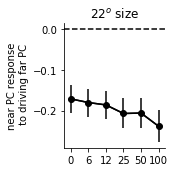

In [634]:
i,j = 4,0
plt.figure(figsize=(2.5,2.5))
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),couplings[low_loss][:,[ilight_off]][:,:,isize,:,i,j],pct=(16,84),colors=colors[1:2])
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')
plt.ylabel(r'near PC response'+'\n to driving far PC')
plt.title('22$^o$ size')
plt.xticks(np.arange(6),ucontrast)
plt.tight_layout()
# plt.savefig('figures/far_pc_near_pc_coupling.eps')


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.15686076394847015
-0.06485143995261829
-0.23941055773302272
-0.0970268442658368
-0.1398307765534857
-0.22285440024273326
-0.0807831188927623
-0.03524772401727159
-0.1677246191453393
0.050540825177381545
-0.09846154187861657
-0.053330986985718885
-0.003209762287898407
-0.3198329650658203
0.01997753589636093
-0.6359062603643807
-0.09785244078721457
-0.04817591029452165
0.05914192424912602
-0.06683658788530175
-0.1051628871963274
-0.029867350563647383
-0.10271619456271863


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.02104895842887898
-0.015442709572586751
-0.11277011231740752
-0.2683044311543184
-0.1924891115133093
-0.33504746016679254
-0.021229543714734074
-0.5796198347778655
0.09726862814583315
-0.06582738479698524
-0.2210283139932979
0.18198370948548617
-0.023822803663981727
0.07766479647049873
-0.21378065618430275
-0.19268029326935704
-0.07232740607313397
-0.10469921859831188
-0.16925885088094508
0.00921086276951182
-0.13622726488229583
-0.04326792255198699
-0.043910514340962


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.12772429270120492
-0.15235135377410855
0.031023277970719427
-0.04992257791262692
-0.13702368721899524
-0.10040149420938796
-0.07630996453907814
-0.024216329145626495
0.191060262267765
-0.056620544059469174
-0.11359046744725676
-0.02706170005689708
0.1772091354640672
-0.06877689445394658
-0.3030368161252847
-0.13409381679941437
-0.24676708278009124
-0.46421380270884915
-0.03503494844743627
-0.06431674480713379
-0.013076962002493907


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.25268920595377187
-0.24769714406915813
-0.14896839615539245
-0.21631822990373098
-0.1276934031273173
-0.069213294198642
-0.034098434933428845
-0.0086861928938928
-0.1912724377457756
-0.1492595033056872
-0.03011830464572059
-0.17454410911039686
-0.029923672585640795
-0.4957061160521352
-0.09541669733339846
-0.0031537140330252095
-0.19986874568843305
-0.15545325886678807
-0.40301161967082105
-0.14334475270933597
-0.18718655928968025


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.1904343144720196
-0.048237230409027415
-0.25572277816331584
-0.04126779196466589
-0.019929422986151694
-0.061888036981486115
-0.2577492269454373
-0.11560517512905598
-0.035485903279076386
-0.2968627435835294
-0.02727418499882983
0.03820843827298045
0.26418963883928254
-0.14832872979725745
-0.1609920800013049
-0.004028882580729394
-0.12032452707602621
-0.21977023406357005
-0.1102426679418318
-0.06248168011946387
-0.25835031626088834


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.01805488190473575
-0.08217368411482574
-0.21944662029576878
-0.02355106895592442
-0.05979450150283373
-0.25628105944175233
0.09128376202443024
-0.012441661369459265
0.16233603616726108
-0.028153178321032445
-0.10872981242640808
-0.06876581619432805
-0.34193402045983345
-0.01344957569806804
-0.015970690271152593
-0.1372401596275143
0.029526007893609665
-0.08402386092054176
-0.06947866587213487
-0.07433156152119905


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.046803690848202975
-0.04599324365419949
0.02734454742578013
0.9168151219417909


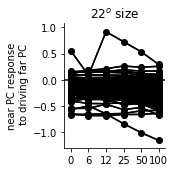

In [583]:
i,j = 4,0
plt.figure(figsize=(2.5,2.5))
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
for iwt in range(couplings.shape[0]):
    ut.plot_bootstrapped_errorbars_hillel(np.arange(6),couplings[iwt:iwt+1,[ilight_off]][:,:,isize,:,i,j],pct=(16,84),colors=colors[1:2])
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')
plt.ylabel(r'near PC response'+'\n to driving far PC')
plt.title('22$^o$ size')
plt.xticks(np.arange(6),ucontrast)
plt.tight_layout()
# plt.savefig('figures/far_pc_near_pc_coupling.eps')


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


2.6280033096800004


Text(0.5, 1.0, '22$^o$ size')

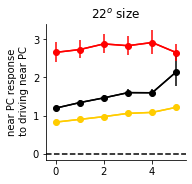

In [635]:
i,j = 0,0
plt.figure(figsize=(2.5,2.5))
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),couplings[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j],pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')
plt.ylabel(r'near PC response'+'\n to driving near PC')
plt.title('22$^o$ size')


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


4.006681161509711


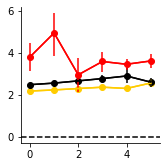

In [616]:
i,j = 0,0
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
this_data = couplings[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j]/phis[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i]
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),this_data,pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8638361763516298


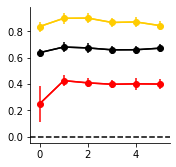

In [446]:
i,j = 2,0
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
this_data = couplings[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j]/phis[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i]/phis[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,j]
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),this_data,pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.21165343296713277


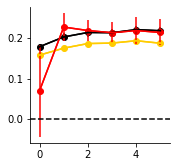

In [447]:
i,j = 2,0
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
this_data = couplings[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j]
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),this_data,pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


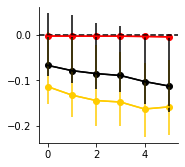

In [448]:
i,j = 1,0
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
this_data = couplings[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i,j]
ut.plot_pct_errorbars_hillel(np.arange(6),this_data,pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.770586616984359


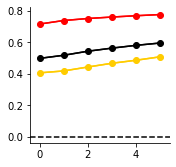

In [449]:
i = 0
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),phis[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i],pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.6635194814302638


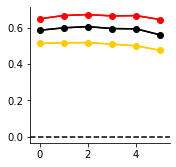

In [450]:
i = 2
plt.figure(figsize=(2.5,2.5))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
ut.plot_bootstrapped_errorbars_hillel(np.arange(6),phis[:,[ilight_halo,ilight_off,ilight_chrimson]][:,:,isize,:,i],pct=(16,84),colors=colors)
ut.erase_top_right()
plt.axhline(c='k',linestyle='dashed')

ValueError: num must be 1 <= num <= 100, not 101

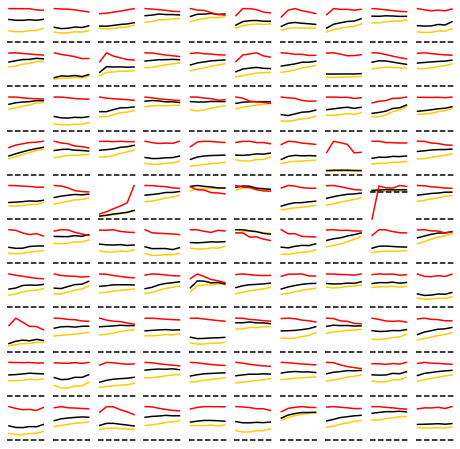

In [451]:
i,j = 0,0
plt.figure(figsize=(8,8))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
for iwt in range(nwt):
    plt.subplot(10,10,iwt+1)
    for iilight,ilight in enumerate([ilight_halo,ilight_off,ilight_chrimson]):
        plt.plot(np.arange(6),couplings[iwt,ilight,isize,:,i,j],c=colors[iilight])
    ut.erase_top_right()
    plt.axhline(c='k',linestyle='dashed')
    plt.axis('off')

ValueError: num must be 1 <= num <= 100, not 101

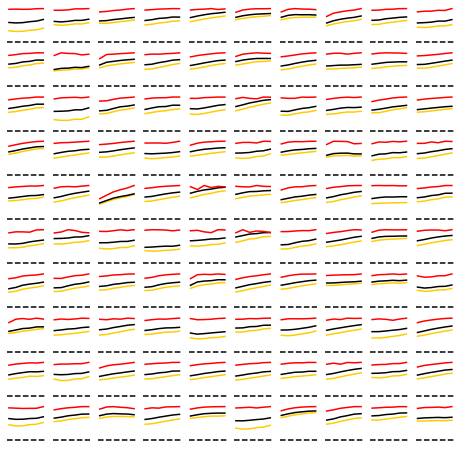

In [452]:
i = 0
plt.figure(figsize=(8,8))
iwt = 3
isize = 3
colors = np.array(((1,0.8,0),(0,0,0),(1,0,0)))
for iwt in range(nwt):
    plt.subplot(10,10,iwt+1)
    for iilight,ilight in enumerate([ilight_halo,ilight_off,ilight_chrimson]):
        plt.plot(np.arange(6),phis[iwt,ilight,isize,:,i],c=colors[iilight])
    ut.erase_top_right()
    plt.axhline(c='k',linestyle='dashed')
    plt.axis('off')

In [ ]:
YY_opto_medium.shape

In [617]:
reload(ut)
reload(sca)
average_last = int(np.floor(Niter/5))
lbls = ['PC','SST','VIP','PV']
opto_lbls = ['halo','chrimson']
nopto = len(opto_levels)
ncelltypes = YY_opto_medium[0].shape[-1]
YY_opto_tavg = np.zeros((nwt,nopto,6,6,ncelltypes))
for iwt in range(nwt):
    YY_opto_tavg[iwt] = np.nanmean(YY_opto_medium[iwt][:,:,-average_last:,:],2).reshape((nopto,6,6,ncelltypes))
iwt = -1
ilight1 = 5
for iilight2,ilight2 in enumerate([2,6]):
    for itype in range(3):
        plt.figure(figsize=(12,2))
        for iwt in range(6):#nwt):
            plt.subplot(1,6,iwt+1)
            xdata = YY_opto_tavg[iwt,ilight1,:,:,itype]
            ydata = YY_opto_tavg[iwt,ilight2,:,:,itype]
            sca.scatter_size_contrast(xdata,ydata,mn=0)
            ut.erase_top_right()
#         ut.zero_origin('xy')
            plt.xlabel('%s event rate, \n light off'%lbls[itype])
            plt.ylabel('%s event rate, \n light on'%lbls[itype])
        plt.tight_layout()
#         plt.savefig('figures/finite_%s_%s_scatter_light_on_light_off.eps'%(opto_lbls[iilight2],lbls[itype]))

ValueError: cannot reshape array of size 4896 into shape (21,6,6,8)

In [638]:
YY_opto_tavg.shape

(134, 21, 6, 6, 8)

In [639]:
np.save('../shared_data/opto_sim_data.npy',{'YY_opto':YY_opto_tavg[low_loss]})

(array([ 1.,  1.,  1.,  1.,  2.,  4., 12., 27., 25., 15.]),
 array([-0.09185796, -0.05309753, -0.0143371 ,  0.02442333,  0.06318376,
         0.10194419,  0.14070462,  0.17946505,  0.21822547,  0.2569859 ,
         0.29574633]),
 <a list of 10 Patch objects>)

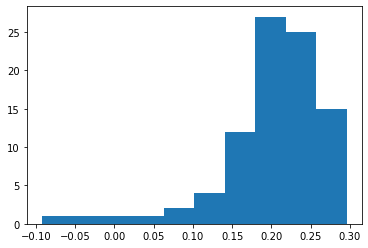

In [50]:
plt.figure()
plt.hist(bltiles[:,0])

True

(11, 36, 101, 8)

In [ ]:
plt.figure()
sca.scatter_size_contrast(YY_opto_medium[-1][:,:,:,])

In [48]:
usize = np.array([5,8,13,22,36,60])
ucontrast = np.array([0,6,12,25,50,100])

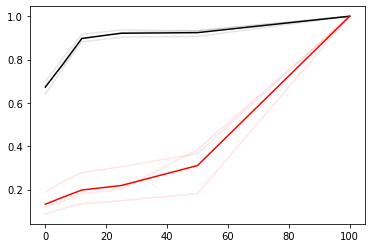

In [49]:
ilights = [5,10]
colors = ['k','r']
isize = -1
plt.figure()
for ilight,color in zip(ilights,colors):
    data = np.nanmean(YY_opto_medium[:,ilight,:,:,0],2).reshape((-1,6,6))
    this_data = data[:,isize,:]/data[:,isize,:].max(1)[:,np.newaxis]
    plt.plot(ucontrast,this_data.T,c=color,alpha=0.1)
    plt.plot(ucontrast,np.mean(this_data,0),c=color)

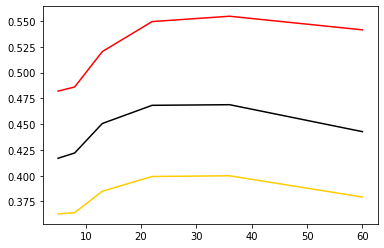

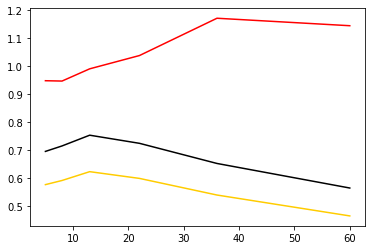

In [37]:
ilights = [1,5,9]
colors = [np.array((1,0.8,0)),'k','r']
nlights = len(ilights)
smi = np.zeros((YY_opto_medium.shape[0],nlights,6))
itype = 0
for iilight,ilight in enumerate(ilights):
    data = np.nanmean(YY_opto_medium[:,ilight,:,:,itype],2).reshape((-1,6,6))
    smi[:,iilight] = data[:,-1,:]/np.max(data,axis=1)
    
for icontrast in [1,5]:
    plt.figure()
    for ilight,color in zip(ilights,colors):
        data = np.nanmean(YY_opto_medium[:,ilight,:,:,itype],2).reshape((-1,6,6))
        this_data = data[:,:,icontrast]#/data[:,:,icontrast].max(1)[:,np.newaxis]
#         plt.plot(usize,this_data.T,c=color,alpha=0.1)
        plt.plot(usize,np.mean(this_data,0),c=color)

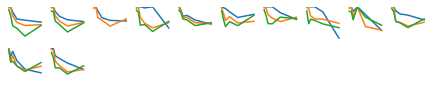

In [16]:
plt.figure(figsize=(7.5,7.5))
for iwt in range(nwt):
    plt.subplot(10,10,iwt+1)
    plt.plot(ucontrast,smi[iwt,:,:].T)
    plt.ylim((0.5,1))
    plt.axis('off')

In [17]:
plt.figure()
plt.plot(ucontrast,smi[68].T)

IndexError: index 68 is out of bounds for axis 0 with size 12

<Figure size 432x288 with 0 Axes>

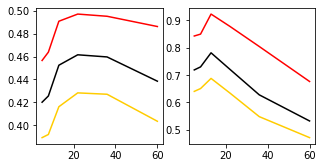

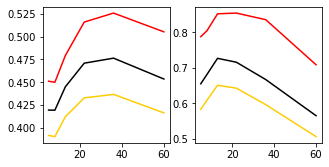

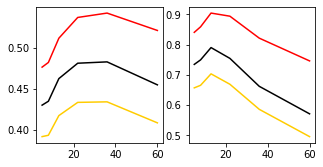

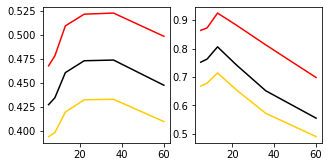

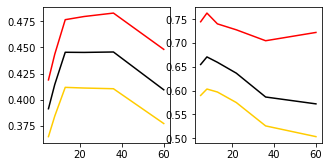

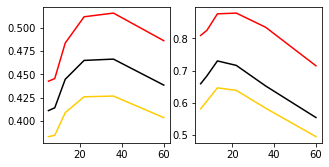

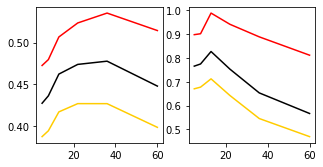

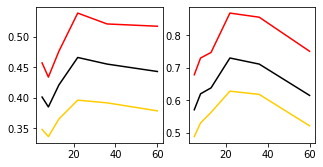

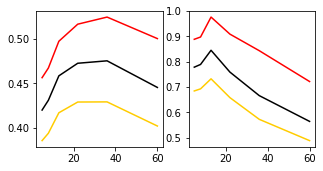

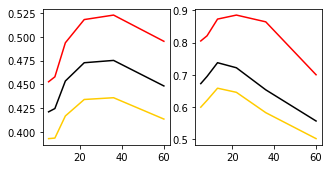

In [38]:
for iwt in range(nwt):
    ilights = [3,5,7]
    colors = [np.array((1,0.8,0)),'k','r']
    nlights = len(ilights)

    plt.figure(figsize=(5,2.5))
    for iicontrast,icontrast in enumerate([1,5]):
        plt.subplot(1,2,iicontrast+1)
        for ilight,color in zip(ilights,colors):
            data = np.nanmean(YY_opto_medium[iwt,ilight,:,:,itype],1).reshape((-1,6,6))
            this_data = data[:,:,icontrast]#/data[:,:,icontrast].max(1)[:,np.newaxis]
    #         plt.plot(usize,this_data.T,c=color,alpha=0.1)
            plt.plot(usize,np.nanmean(this_data,0),c=color)

In [43]:
np.nanmean(YY_opto_medium[:,:,:,:,itype],3).reshape((nwt,-1,6,6))[:,:,[0,2,3,5],:].shape

(10, 11, 4, 6)

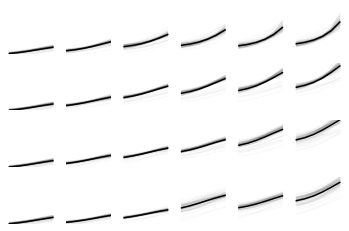

In [67]:
data = np.nanmean(YY_opto_medium[:,2:8,:,:,itype],3).reshape((nwt,-1,6,6))[:,:,[0,2,3,5],:]
nsize,ncontrast = 4,6
mn = np.nanmean(data,0).min()
mx = np.nanmean(data,0).max()
plt.figure()
for isize in range(nsize):
    for icontrast in range(ncontrast):
        plt.subplot(nsize,ncontrast,(nsize-isize-1)*ncontrast+icontrast+1)
        plt.plot(data[:,:,isize,icontrast].T,c='k',alpha=0.02)
        plt.plot(np.nanmean(data[:,:,isize,icontrast],0),c='k')
        plt.ylim((mn,mx))
        plt.axis('off')
plt.savefig('figures/vip_sim_master_plot.jpg',dpi=300)

In [177]:
YY_opto_medium[0,7,:,:,itype]

array([[0.49249911, 0.49249911, 0.49249911, ..., 0.49249911, 0.49249911,
        0.49249911],
       [0.54827048, 0.54827048, 0.54827048, ..., 0.54827048, 0.54827048,
        0.54827048],
       [0.60918797, 0.60918797, 0.60918797, ..., 0.60918797, 0.60918797,
        0.60918797],
       ...,
       [0.7447089 , 0.7447089 , 0.7447089 , ..., 0.7447089 , 0.7447089 ,
        0.7447089 ],
       [0.73623515, 0.73623515, 0.73623515, ..., 0.73623515, 0.73623515,
        0.73623515],
       [0.75386399, 0.75386399, 0.75386399, ..., 0.75386399, 0.75386399,
        0.75386399]])

In [143]:
# for iwt in range(nwt):
#     plt.figure()
#     for ilight,isize,icontrast in zip([0,5,10],[4,4,4],[5,5,5]):
#         tmax = Niter
#         t = np.arange(tmax)*dt
#         iflat = np.ravel_multi_index((isize,icontrast),(nsize,ncontrast))
#         plt.plot(t,YY_opto[iwt][ilight,iflat,:tmax,0].T)

In [168]:
np.nanmax(data)

0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


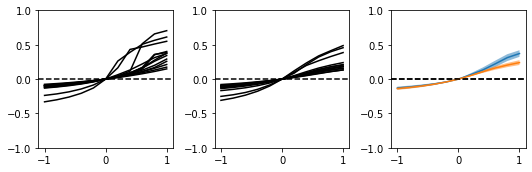

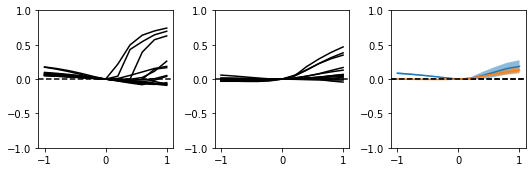

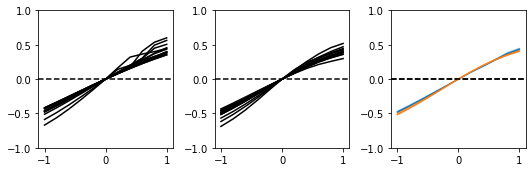

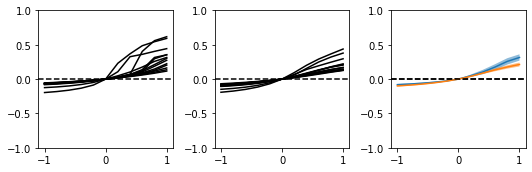

In [234]:
iwt = 0
data = np.zeros((nwt,YY_opto_medium[0].shape[0],6,6))
these_lvls = slice(None)
for itype in [0,1,2,3]:
    plt.figure(figsize=(7.5,2.5))
    isize = 3
    tlast = 1000
    icontrasts = [1,5]
    for iwt in range(nwt):
        data[iwt] = np.nanmean(YY_opto_medium[iwt][:,:,:,itype],2).reshape((-1,6,6)) # light, stim, time, type
        data[iwt] = (data[iwt] - data[iwt,5])/(data[iwt] + data[iwt,5])
    for iicontrast,icontrast in enumerate(icontrasts):
        this_data = data[:,:,isize,icontrast]
        plt.subplot(1,3,iicontrast+1)
        for iwt in range(nwt):
            plt.plot(opto_levels[these_lvls],this_data[iwt][these_lvls],c='k',alpha=1)
        plt.plot(opto_levels[these_lvls],np.mean(this_data,0)[these_lvls],c='k')
        plt.ylim((np.nanmin(data[:,:,isize,icontrasts]),np.nanmax(data[:,:,isize,icontrasts])))
        plt.axhline(0,c='k',linestyle='dashed')
        plt.ylim(-1,1)
        plt.subplot(1,3,3)
        mn = np.mean(this_data,0)[these_lvls]
        sem = np.std(this_data,0)[these_lvls]/np.sqrt(this_data.shape[0])
        plt.plot(opto_levels[these_lvls],mn)
        plt.fill_between(opto_levels[these_lvls],mn-sem,mn+sem,alpha=0.5)
        plt.ylim((np.nanmin(data[:,:,isize,icontrasts]),np.nanmax(data[:,:,isize,icontrasts])))
        plt.axhline(0,c='k',linestyle='dashed')
        plt.ylim(-1,1)
    plt.tight_layout()

In [136]:
non_paradoxical = (YY_opto_small[:,10,:,1] - YY_opto_small[:,5,:,1]>0).sum(1) == 0

In [ ]:
iwt,ilight = 0,-1
thisYY = np.nanmean(YY_opto[iwt,:,:,:],2)
mdls[0].fprimeY(thisYY).shap

In [160]:
YY_opto.shape

(10, 11, 36, 10001, 16)

In [162]:
this_fprime = mdls[0].fprimeY(np.nanmean(YY_opto[iwt],2))
this_fprime.shape

(11, 36, 16)

In [84]:
nlight = YY_opto_medium.shape[1]
nN,nP,nQ,nS,nT = [getattr(mdls[0],x) for x in ['nN','nP','nQ','nS','nT']]
phis = np.zeros((nwt,nlight,6,6,nQ*nS*nT))
couplings = np.zeros((nwt,nlight,6,6,nQ*nS*nT,nQ*nS*nT))
Xcouplings = np.zeros((nwt,nlight,6,6,nP*nS*nT,nQ*nS*nT))
for iwt,mdl in enumerate(mdls[:nwt]):
    print('model #%d'%iwt)
    this_fprime = mdl.fprimeY(np.nanmean(YY_opto_medium[iwt],2))
    WWmx,WWmy = [getattr(mdls[iwt],x) for x in ['WWmx','WWmy']]
    for ilight in range(nlight):
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(6,6))
            phis[iwt,ilight,iistim,jjstim] = this_fprime[ilight,istim]
            Phi = np.diag(phis[iwt,ilight,iistim,jjstim])
            couplings[iwt,ilight,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
            Xcouplings[iwt,ilight,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))


model #0
model #1
model #2
model #3
model #4
model #5
model #6
model #7
model #8
model #9
model #10
model #11
model #12
model #13
model #14
model #15
model #16
model #17
model #18
model #19
model #20
model #21
model #22
model #23
model #24
model #25
model #26
model #27
model #28
model #29
model #30
model #31
model #32
model #33
model #34
model #35
model #36
model #37
model #38
model #39
model #40
model #41
model #42
model #43
model #44
model #45
model #46
model #47
model #48
model #49
model #50
model #51
model #52
model #53
model #54
model #55
model #56
model #57
model #58
model #59
model #60
model #61
model #62
model #63
model #64
model #65
model #66
model #67
model #68
model #69
model #70
model #71
model #72
model #73
model #74
model #75
model #76
model #77
model #78
model #79
model #80
model #81
model #82
model #83
model #84
model #85
model #86
model #87
model #88
model #89
model #90
model #91
model #92
model #93
model #94
model #95
model #96
model #97
model #98
model #99
model #100

In [85]:
lbls = ['PC','SST','VIP','PV']

In [86]:
iwt = 1

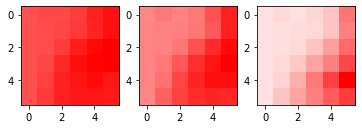

In [87]:
plt.figure()
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    data = couplings[iwt,5*ilight,:,:,1,1]
    mx = np.max(np.abs(data))
    plt.imshow(data,vmin=-mx,vmax=mx,cmap='bwr')

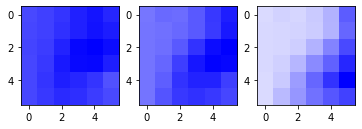

In [88]:
plt.figure()
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    data = couplings[iwt,5*ilight,:,:,2,1]
    mx = np.max(np.abs(data))
    plt.imshow(data,vmin=-mx,vmax=mx,cmap='bwr')

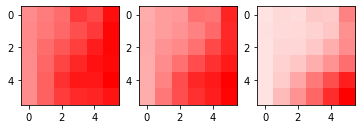

In [89]:
plt.figure()
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    data = couplings[iwt,5*ilight,:,:,2,0]
    mx = np.max(np.abs(data))
    plt.imshow(data,vmin=-mx,vmax=mx,cmap='bwr')

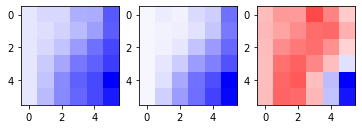

In [104]:
plt.figure()
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    data = couplings[1,5*ilight,:,:,8,0]
    mx = np.max(np.abs(data))
    plt.imshow(data,vmin=-mx,vmax=mx,cmap='bwr')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.


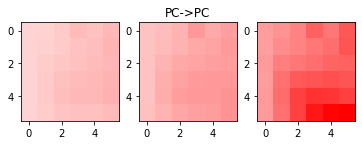

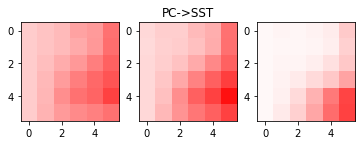

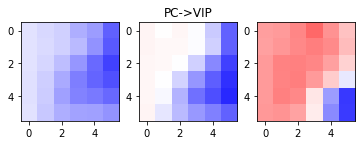

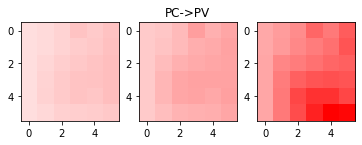

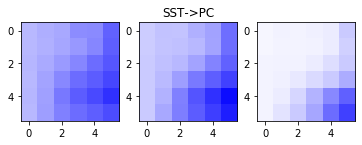

...

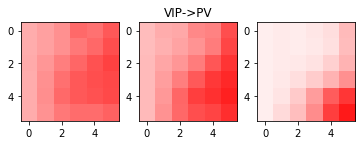

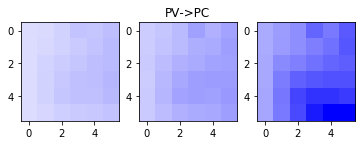

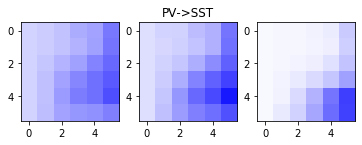

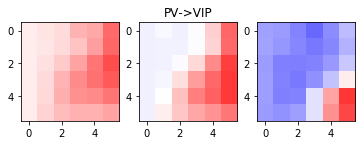

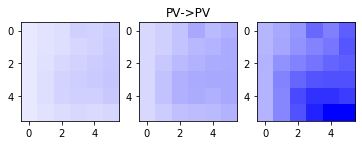

In [93]:
for itype1 in range(nQ):
    for itype2 in range(nQ):
        plt.figure()
        data = np.nanmedian(couplings[:,:,:,:,itype1,itype2],0)
        mx = np.max(np.abs(data))
        for ilight in range(3):
            plt.subplot(1,3,ilight+1)
            this_data = data[5*ilight]
            plt.imshow(this_data,vmin=-mx,vmax=mx,cmap='bwr')
        plt.subplot(1,3,2)
        plt.title('%s->%s'%(lbls[itype1],lbls[itype2]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.


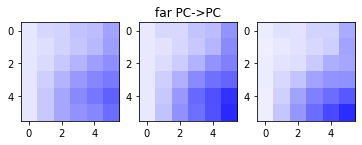

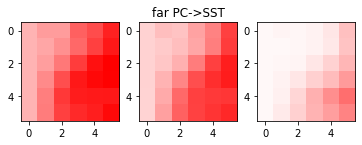

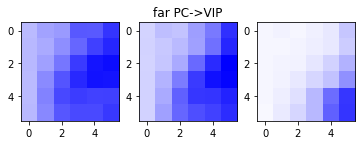

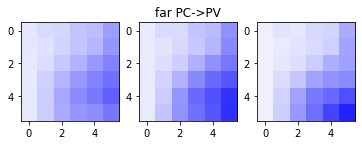

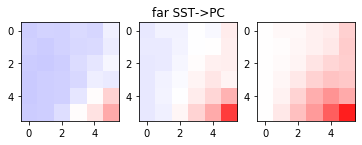

...

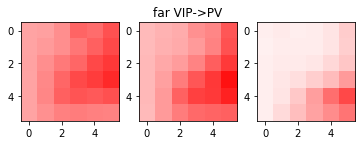

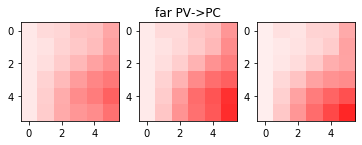

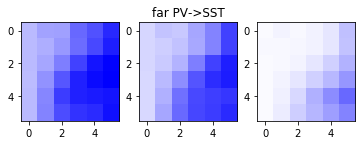

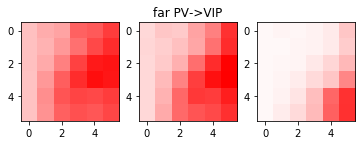

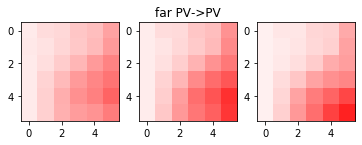

In [97]:
for itype1 in range(nQ):
    for itype2 in range(nQ):
        plt.figure()
        data = np.nanmedian(couplings[:,:,:,:,8+itype1,itype2],0)
        mx = np.max(np.abs(data))
        for ilight in range(3):
            plt.subplot(1,3,ilight+1)
            this_data = data[5*ilight]
            plt.imshow(this_data,vmin=-mx,vmax=mx,cmap='bwr')
        plt.subplot(1,3,2)
        plt.title('far %s->%s'%(lbls[itype1],lbls[itype2]))

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.


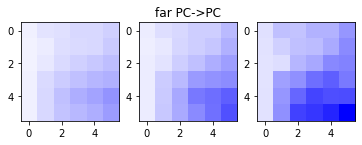

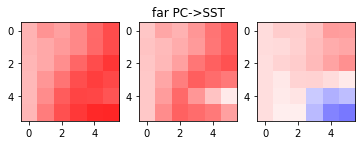

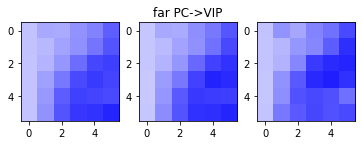

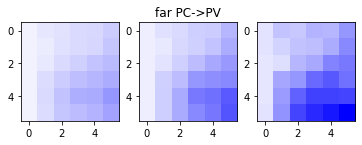

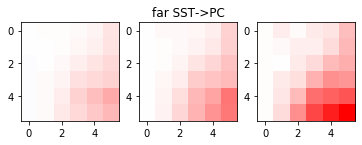

...

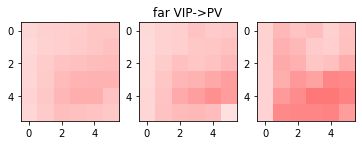

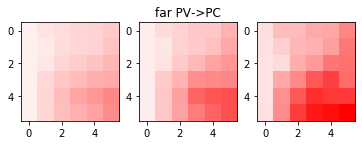

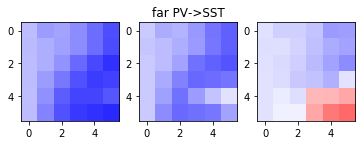

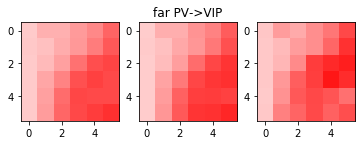

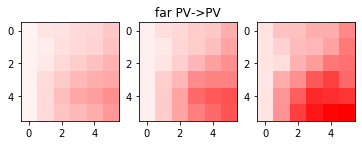

In [133]:
for itype1 in range(nQ):
    for itype2 in range(nQ):
        plt.figure()
        data = np.nanmedian(couplings[:,:,:,:,8+itype1,itype2],0)
        mx = np.max(np.abs(data))
        for ilight in range(3):
            plt.subplot(1,3,ilight+1)
            this_data = data[5+2*(ilight-1)]
            plt.imshow(this_data,vmin=-mx,vmax=mx,cmap='bwr')
        plt.subplot(1,3,2)
        plt.title('far %s->%s'%(lbls[itype1],lbls[itype2]))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


-0.29041152623994315


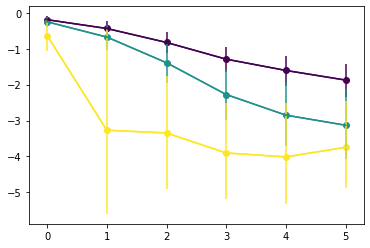

In [134]:
plt.figure()
isize = 4
x = np.arange(6)
ut.plot_bootstrapped_errorbars_hillel(x,couplings[:,[3,5,7],isize,:,8,0].transpose((1,0,2)))

In [236]:
nlight = YY_opto_medium.shape[1]
nsize,ncontrast = 6,6
nN,nP,nQ,nS,nT = [getattr(mdls[0],x) for x in ['nN','nP','nQ','nS','nT']]
max_eig = np.zeros((len(weights_files),nlight,nsize,ncontrast))
min_eig = np.zeros((len(weights_files),nlight,nsize,ncontrast))
vs = np.zeros((len(weights_files),nlight,nsize,ncontrast,2,2))
for iwt,mdl in enumerate(mdls[:nwt]):
    print('model #%d'%iwt)
    this_fprime = mdl.fprimeY(np.nanmean(YY_opto_medium[iwt],2))
    Wmy = getattr(mdls[iwt],'Wmy')
    for ilight in range(nlight):
        Weff = np.zeros((nsize,ncontrast,2,2))
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(nsize,ncontrast))
            these_phis = this_fprime[ilight,istim]
            Phi = np.diag(these_phis)
            Weff[iistim,jjstim] = Wmy[[0,3]][:,[0,3]] @ Phi[[0,3]][:,[0,3]]
        for istim in range(nN):
            iistim,jjstim = np.unravel_index(istim,(nsize,ncontrast))
    #         plt.subplot(nsize,ncontrast,istim+1)
    #         plt.imshow(Weff[iistim,jjstim],vmin=Weff.min(),vmax=Weff.max())
            w,v = np.linalg.eig(Weff[iistim,jjstim].T)
            vs[iwt,ilight,iistim,jjstim] = v[:,np.argsort(w)]
            max_eig[iwt,ilight,iistim,jjstim] = np.max(w)
            min_eig[iwt,ilight,iistim,jjstim] = np.min(w)

model #0
model #1
model #2


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:23: ComplexWarning: Casting complex values to real discards the imaginary part
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:24: ComplexWarning: Casting complex values to real discards the imaginary part
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:25: ComplexWarning: Casting complex values to real discards the imaginary part


model #3
model #4
model #5
model #6
model #7
model #8
model #9
model #10
model #11


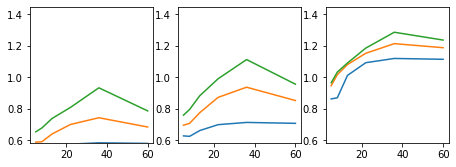

In [237]:
iwt = 0
usize = np.array([5,8,13,22,36,60])
plt.figure(figsize=(7.5,2.5))
for isize in range(3):
    plt.subplot(1,3,isize+1)
    plt.plot(usize,np.nanmean(max_eig[:,1+4*isize][:,:,[1,3,5]],0))
    plt.ylim((max_eig[iwt].min(),max_eig[iwt].max()))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

1.0145685939215443
0.8916807709116606
1.0797529009057312


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:13: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  del sys.path[0]


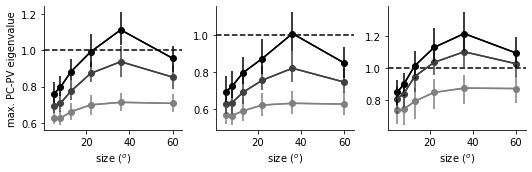

In [238]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_l23 = np.array(((0.5,0.5,0.5),(0.25,0.25,0.25),(0.,0.,0.)))
for iilight,ilight in enumerate([5,3,7]):
    plt.subplot(1,3,iilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,max_eig[:,ilight][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_l23)
    plt.axhline(1,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    # plt.legend(['6%','25%','100%'])
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
#     plt.ylim((0.4,1.3))
plt.subplot(1,3,1)
plt.ylabel('max. PC-PV eigenvalue')

plt.tight_layout()
# plt.savefig('figures/pc_pv_stability_size_by_3_contrasts_by_vip_opto.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


-0.37362518360617425
-0.5689124882643577


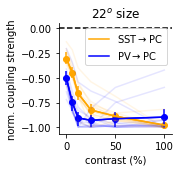

In [239]:
plt.figure(figsize=(2.5,2.5))
isize = 3
ilight = 5
datas = [couplings[:,ilight,isize,:,1,0],couplings[:,ilight,isize,:,3,0]]
colors = [np.array((1,0.65,0)),np.array((0,0,1))]
for data,color in zip(datas,colors):
    mx = np.max(np.abs(data),axis=1)[:,np.newaxis]
    ut.plot_bootstrapped_errorbars_hillel(ucontrast,(data/mx)[:,np.newaxis],pct=(2.5,97.5),colors=color[np.newaxis])
plt.legend([r'SST$\rightarrow$PC',r'PV$\rightarrow$PC'])
for data,color in zip(datas,colors):
    mx = np.max(np.abs(data),axis=1)[:,np.newaxis]
    plt.plot(ucontrast,(data/mx).T,alpha=0.1,c=color)
plt.xlabel('contrast (%)')
plt.ylabel('norm. coupling strength')
plt.title('%d$^o$ size'%usize[isize])
plt.axhline(0,linestyle='dashed',c='k')
ut.erase_top_right()
plt.tight_layout()
# plt.savefig('figures/sst_pc_coupling_traces.jpg',dpi=300)

In [240]:
max_eig[:,3+2*isize,:,[1,3,5]].shape

(3, 12, 6)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.


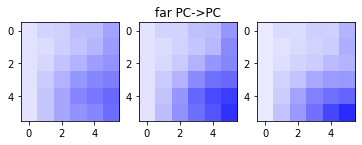

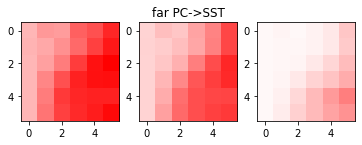

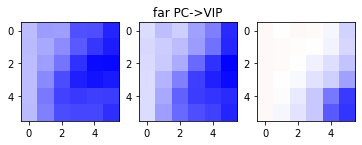

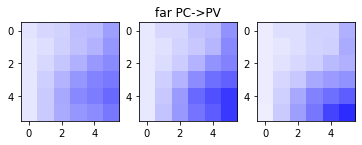

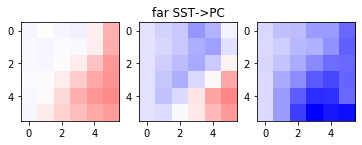

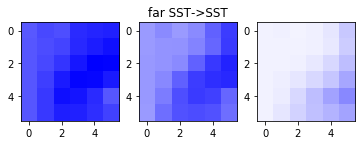

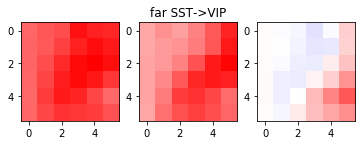

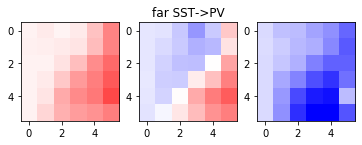

In [125]:
for itype1 in range(nP):
    for itype2 in range(nQ):
        plt.figure()
        data = np.nanmedian(Xcouplings[:,:,:,:,4+itype1,itype2],0)
        mx = np.max(np.abs(data))
        for ilight in range(3):
            plt.subplot(1,3,ilight+1)
            this_data = data[5*ilight]
            plt.imshow(this_data,vmin=-mx,vmax=mx,cmap='bwr')
        plt.subplot(1,3,2)
        plt.title('far %s->%s'%(lbls[itype1],lbls[itype2]))

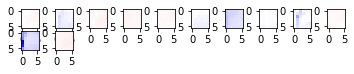

In [253]:
plt.figure()
mx = np.max(np.abs(couplings[:,10,:,:,1,1]))
for iwt in range(nwt):
    plt.subplot(10,10,iwt+1)
    plt.imshow(couplings[iwt,10,:,:,1,1],vmin=-mx,vmax=mx,cmap='bwr')
#     plt.axis('off')
cp = couplings.reshape((nwt,-1))
lkat = np.ones((nwt,),dtype='bool')
# lkat = np.max(np.abs(cp),axis=1)<50

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.33952617519641554
0.22530867720703426
-0.16359281323725525


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


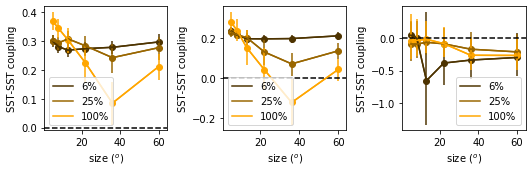

In [243]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,couplings[:,1+4*ilight,:,:,1,1][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_sst)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('SST-SST coupling')
    plt.legend(['6%','25%','100%'])
    plt.tight_layout()
# plt.savefig('figures/sst_sst_coupling_size_by_3_contrasts_by_3_light_levels.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.7392399859517991
0.8049114596481154


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.9204735168743363


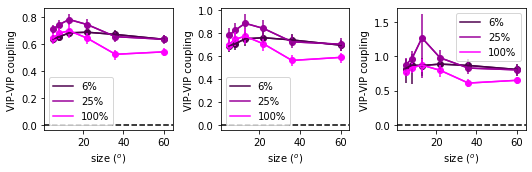

In [244]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,couplings[lkat,3+2*ilight,:,:,2,2][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_vip)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('VIP-VIP coupling')
    plt.legend(['6%','25%','100%'])
    plt.tight_layout()
# plt.savefig('figures/vip_sst_coupling_size_by_3_contrasts_by_3_light_levels.eps')

NameError: name 'lkat' is not defined

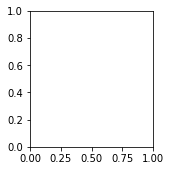

In [116]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,couplings[lkat,1+4*ilight,:,:,2,1][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_vip)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('VIP-SST coupling')
    plt.legend(['6%','25%','100%'])
    plt.tight_layout()
# plt.savefig('figures/vip_sst_coupling_size_by_3_contrasts_by_3_light_levels.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

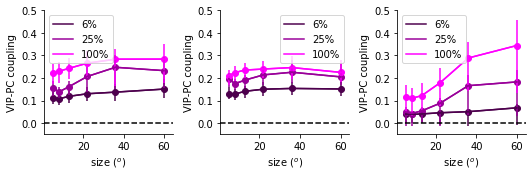

In [122]:
reload(ut)
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for iilight,ilight in enumerate([5,1,9]):
    plt.subplot(1,3,iilight+1)
    ut.plot_pct_errorbars_hillel(usize,couplings[:,ilight,:,:,2,0][:,:,[1,3,5]].transpose((0,2,1)),pct=(16,84),colors=c_vip)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('VIP-PC coupling')
    plt.legend(['6%','25%','100%'])
    ut.erase_top_right()
    plt.tight_layout()
    plt.ylim(-0.05,0.5)
# plt.savefig('figures/vip_pc_coupling_size_by_3_contrasts_by_3_light_levels.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

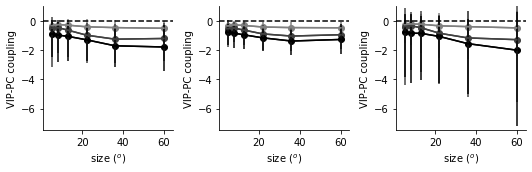

In [120]:
reload(ut)
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for iilight,ilight in enumerate([5,1,9]):
    plt.subplot(1,3,iilight+1)
    ut.plot_pct_errorbars_hillel(usize,couplings[:,ilight,:,:,8,0][:,:,[1,3,5]].transpose((0,2,1)),pct=(16,84),colors=c_l23)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('VIP-PC coupling')
#     plt.legend(['6%','25%','100%'])
    ut.erase_top_right()
    plt.tight_layout()
    plt.ylim(-7.5,1)
# plt.savefig('figures/vip_pc_coupling_size_by_3_contrasts_by_3_light_levels.eps')

In [151]:
sc = YY_opto_small.reshape(YY_opto_small.shape[:2]+(6,6,-1))

In [152]:
smi = sc[:,:,-1,1:,0]/np.max(sc[:,:,:,1:,0],axis=2)

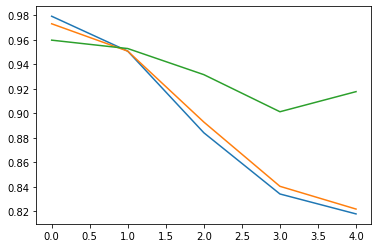

In [153]:
plt.figure()
for ilight in [5,1,9]:
    plt.plot(np.nanmean(smi[:,ilight,:],0))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.7278878753225566
0.6141257398117157


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


1.0227992465695759


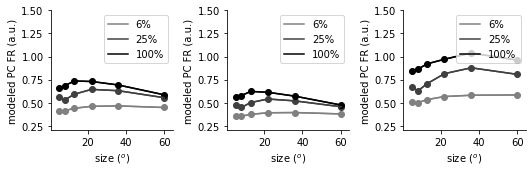

In [123]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for iilight,ilight in enumerate([5,1,9]):
    plt.subplot(1,3,iilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,YY_opto_small[:,ilight,:,0].reshape((-1,6,6))[:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_l23)
#     plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('modeled PC FR (a.u.)')
    plt.legend(['6%','25%','100%'])
    ut.erase_top_right()
    plt.ylim(0.2,1.5)
plt.tight_layout()
# plt.savefig('figures/modeled_pc_size_by_3_contrasts_by_3_light_levels.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.595975275563359
0.13255265470553373
1.3652119077072997


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


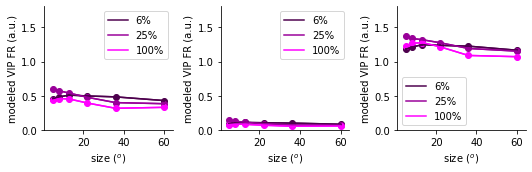

In [124]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for iilight,ilight in enumerate([5,1,9]):
    plt.subplot(1,3,iilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,YY_opto_small[:,ilight,:,2].reshape((-1,6,6))[:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_vip)
#     plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('modeled VIP FR (a.u.)')
    plt.legend(['6%','25%','100%'])
    ut.erase_top_right()
    plt.tight_layout()
    plt.ylim(0.,1.8)
# plt.savefig('figures/modeled_vip_size_by_3_contrasts_by_3_light_levels.eps')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.7550497002352771
0.6076441236465289
0.9027097557828473


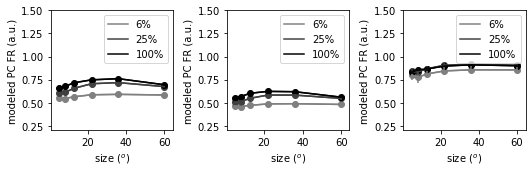

In [156]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for iilight,ilight in enumerate([5,1,9]):
    plt.subplot(1,3,iilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,phis[:,ilight,:,:,0][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_l23)
#     plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('modeled PC FR (a.u.)')
    plt.legend(['6%','25%','100%'])
    plt.tight_layout()
    plt.ylim(0.2,1.5)
# plt.savefig('figures/modeled_pc_size_by_3_contrasts_by_3_light_levels.eps')

In [284]:
phis.shape

(84, 11, 6, 6, 16)

In [207]:
couplings.shape

(84, 6, 6, 16, 16)

In [106]:
c_l4 = np.array(((0,0.3,0),(0,0.6,0),(0,1,0)))
c_l23 = np.array(((0.5,0.5,0.5),(0.25,0.25,0.25),(0.,0.,0.)))
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
c_vip = np.array(((0.3,0,0.3),(0.6,0,0.6),(1,0,1)))
c_pv = np.array(((0,0,0.3),(0,0,0.6),(0,0,1)))
colors = [c_l4,c_l23,c_sst,c_vip,c_pv]

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

-0.17511181108702614
-0.18437305227692252


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


-0.9199933930828017


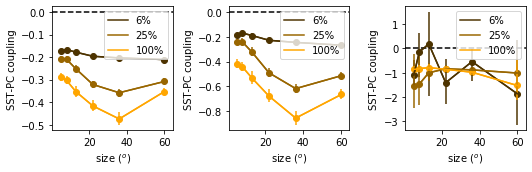

In [248]:
plt.figure(figsize=(7.5,2.5))
usize = [5,8,13,22,36,60]
c_sst = np.array(((0.3,0.2,0),(0.6,0.4,0),(1,0.65,0)))
for ilight in range(3):
    plt.subplot(1,3,ilight+1)
    ut.plot_bootstrapped_errorbars_hillel(usize,couplings[lkat,5*ilight,:,:,1,0][:,:,[1,3,5]].transpose((0,2,1)),pct=(2.5,97.5),colors=c_sst)
    plt.axhline(0,linestyle='dashed',c='k')
    plt.xlabel('size ($^o$)')
    plt.ylabel('SST-PC coupling')
    plt.legend(['6%','25%','100%'])
    plt.tight_layout()
# plt.savefig('figures/sst_sst_coupling_size_by_3_contrasts.eps')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  if __name__ == '__main__':


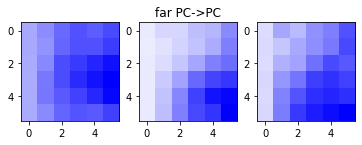

In [100]:
for itype1 in range(8,9):
    for itype2 in range(0,1):
        plt.figure()
        for ilight in range(3):
            plt.subplot(1,3,ilight+1)
            data = np.nanmedian(couplings[:,5*ilight,:,:,itype1,itype2],0)
            mx = np.max(np.abs(data))
            plt.imshow(data,vmin=-mx,vmax=mx,cmap='bwr')
        plt.subplot(1,3,2)
        plt.title('%s->%s'%('far PC',lbls[itype2]))

In [26]:
ucontrast = np.array([0,6,12,25,50,100])

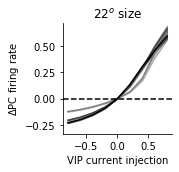

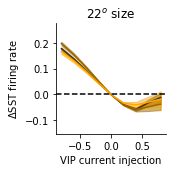

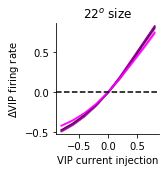

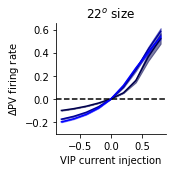

In [96]:
iwt = 0
data = np.zeros((nwt,YY_opto_medium[0].shape[0],6,6))
yoffset = 0.1
opto_range = slice(1,10)
these_opto_levels = opto_levels[opto_range]
for itype in [0,1,2,3]:
    plt.figure(figsize=(2.5,2.5))
    isize = 3
    tlast = 200
    icontrasts = [1,3,5]
    these_colors = colors[itype+1]
    for iwt in range(nwt):
        data[iwt] = np.nanmean(YY_opto_medium[iwt][:,:,-tlast:,itype],2).reshape((-1,6,6)) # light, stim, time, type
        data[iwt] = (data[iwt] - data[iwt,5])#/(data[iwt] + data[iwt,5])
    for iicontrast,icontrast in enumerate(icontrasts):
        this_data = data[:,:,isize,icontrast]
        this_color = these_colors[iicontrast]
        mn = np.mean(this_data,0)[opto_range]
        sem = np.std(this_data,0)[opto_range]/np.sqrt(this_data.shape[0])
        plt.plot(these_opto_levels,mn,c=this_color)
        plt.fill_between(these_opto_levels,mn-sem,mn+sem,alpha=0.5,color=this_color)
        plt.ylim(((mn-sem-yoffset).min(),(mn+sem+yoffset).max()))
#     plt.legend(['%d%% contrast'%uc for uc in ucontrast[icontrasts]])
    plt.title('%d$^o$ size'%usize[isize])
    plt.axhline(0,c='k',linestyle='dashed')
    plt.xlabel('VIP current injection')
    plt.ylabel('$\Delta$%s firing rate'%lbls[itype])
    ut.erase_top_right()
    plt.tight_layout()
#     plt.savefig('figures/%s_vip_current_injection.jpg'%lbls[itype],dpi=300)

In [203]:
import calnet.utils
import sim_utils

In [69]:
nfiles = nwt#len(weights_files)
Ts = np.zeros((nfiles,nQ))
Ks = np.zeros((nfiles,nQ))
Wmys = np.zeros((nfiles,nQ,nQ))
Wmxs = np.zeros((nfiles,nP,nQ))
s02s = np.zeros((nfiles,nQ))
YYs = np.zeros((nfiles,6,6,nQ*nS*nT))
XXs = np.zeros((nfiles,6,6,nP*nS*nT))
couplings = np.zeros((nfiles,6,6,nQ*nS*nT,nQ*nS*nT))
Xcouplings = np.zeros((nfiles,6,6,nP*nS*nT,nQ*nS*nT))
for iwt,weights_file in enumerate(weights_files):
    Wstar_dict = np.load(weights_file,allow_pickle=True)[()]
    Wmx,Wmy,Wsx,Wsy,s02,K,kappa,T,XX,XXp,Eta,Xi,h = Wstar_dict['as_list']
    WWmy = calnet.utils.gen_Weight_k_kappa_t(Wmy,K,kappa,T)
    WWmx = calnet.utils.gen_Weight_k_kappa_t(Wmx,K,kappa,T)
    tiled_s02 = np.tile(s02,nS*nT)
    Ts[iwt] = T
    Ks[iwt] = K
    Wmys[iwt] = Wmy
    Wmxs[iwt] = Wmx
    s02s[iwt] = s02
    YYs[iwt] = sim_utils.f_miller_troyer(Eta,Xi**2+tiled_s02).reshape((6,6,nQ*nS*nT))
    XXs[iwt] = XX.reshape((6,6,nP*nS*nT))
    for istim in range(nN):
        iistim,jjstim = np.unravel_index(istim,(6,6))
        Phi = np.diag(calnet.utils.fprime_miller_troyer(Eta[istim],Xi[istim]**2+tiled_s02))
        couplings[iwt,iistim,jjstim] = Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
        Xcouplings[iwt,iistim,jjstim] = WWmx @ Phi @ np.linalg.inv(np.eye(nQ*nS*nT) - WWmy @ Phi)
# couplings = np.reshape(couplings,(couplings.shape[0],6,6,couplings.shape[2],couplings.shape[3]))
# Xcouplings = np.reshape(Xcouplings,(Xcouplings.shape[0],6,6,Xcouplings.shape[2],Xcouplings.shape[3]))

NameError: name 'nQ' is not defined

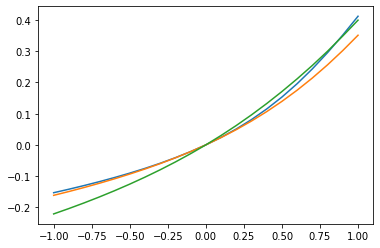

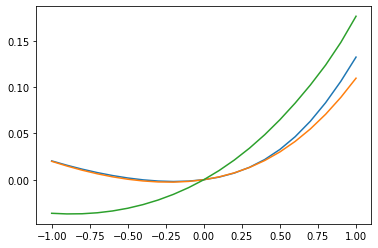

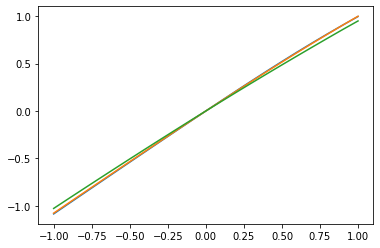

In [277]:
for itype in [0,1,2]:
    plt.figure()
    isize = 5
    tlast = 1000
    data = np.nanmean(YY_opto[:,:,-tlast:,itype],2).reshape((-1,6,6)) # light, stim, time, type
    for icontrast in [1,3,5]:
        plt.plot(opto_levels,data[:,isize,icontrast]-data[10,isize,icontrast])

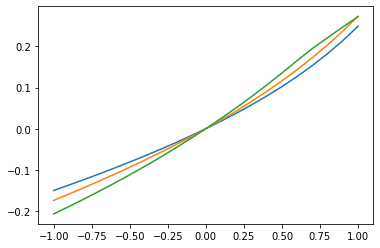

In [191]:
plt.figure()
itype = 0
isize = 2
tlast = 1000
data = np.nanmean(YY_opto[:,:,-tlast:,itype],2).reshape((-1,6,6)) # light, stim, time, type
for icontrast in [1,3,5]:
    plt.plot(opto_levels,data[:,isize,icontrast]-data[10,isize,icontrast])

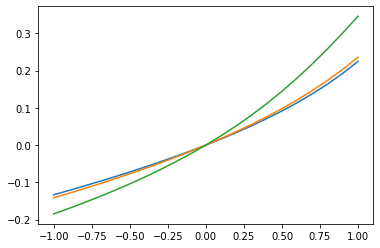

In [193]:
plt.figure()
itype = 0
isize = 5
tlast = 1000
data = np.nanmean(YY_opto[:,:,-tlast:,itype],2).reshape((-1,6,6)) # light, stim, time, type
for icontrast in [1,3,5]:
    plt.plot(opto_levels,data[:,isize,icontrast]-data[10,isize,icontrast])

In [13]:
pdb.pm()


> /Users/dan/Documents/code/adesnal/calnet/dynamics.py(142)predict_YY_current_injection()
-> YY = np.zeros((Niter+1,YY0.shape[1]))
(Pdb) Nfix
*** NameError: name 'Nfix' is not defined
(Pdb) YY0.shape
(16,)
(Pdb) exit


In [215]:
reload(dyn)
YY_fix = dyn.compute_steady_state_Model(mdl,Niter=int(1.5e3),fix_dim=np.arange(mdl.nQ),Ny=25,dt=1e-1)

0


/Users/dan/Documents/code/adesnal/calnet/utils.py:632: RuntimeWarning: overflow encountered in square
  A = 0.5*mu*(1+ssp.erf(u))


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


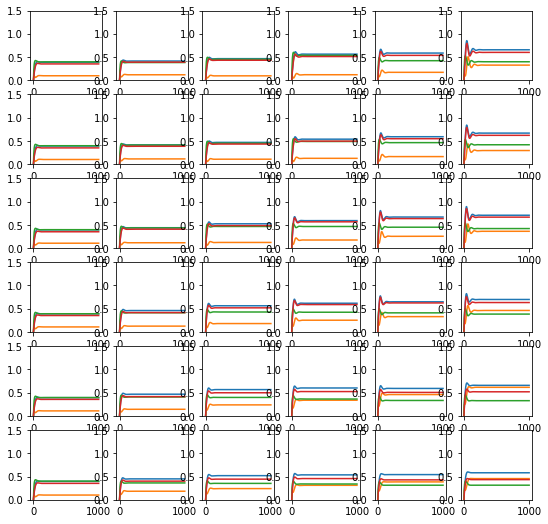

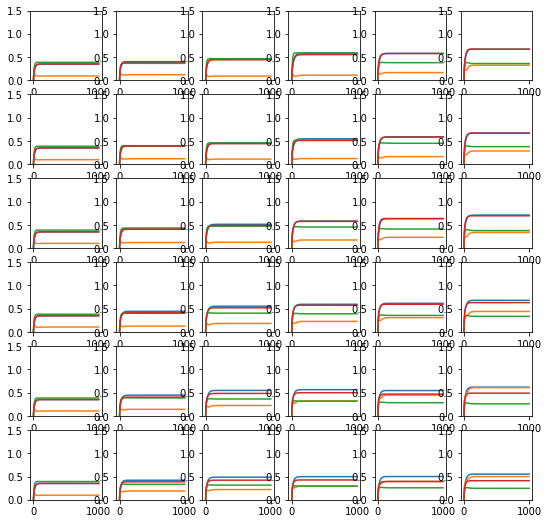

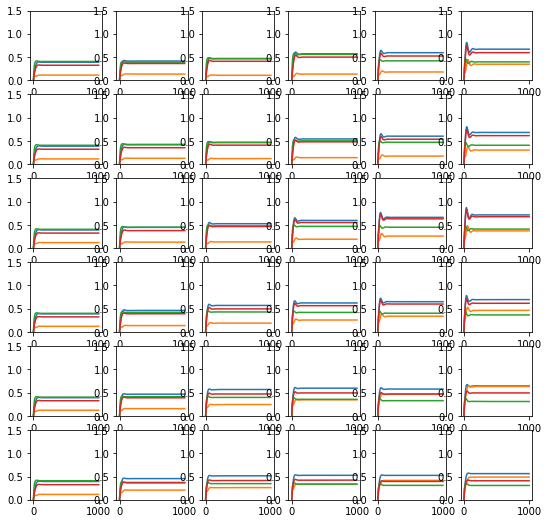

In [50]:
import pyute as ut
# ut.mkdir('figures/dynamics_simulations/200724a/')
for iwt in range(nwt):
    mag = 1.5
    plt.figure(figsize=(6*mag,6*mag))
    for icelltype in range(4):
        for istim in range(36):
            plt.subplot(6,6,istim+1)
            plt.plot(YY_ss[iwt][istim,:,icelltype]) #-YY_ss[imodel][istim,-1,icelltype])
            plt.ylim((0,1.5))
#     plt.savefig('figures/dynamics_simulations/200724a/%d.jpg'%iwt)

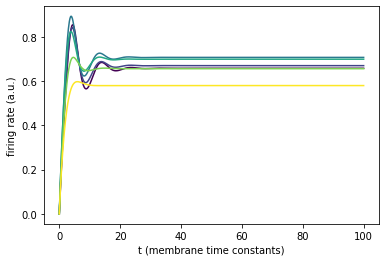

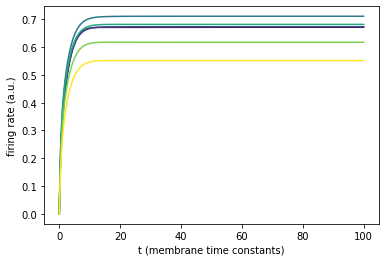

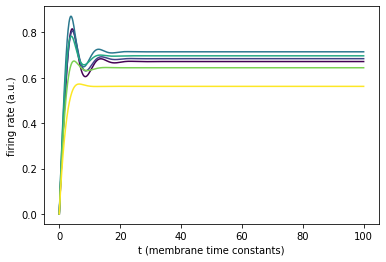

In [51]:
colors = plt.cm.viridis(np.linspace(0,1,6))
ut.mkdir('figures/dynamics_simulations_inset')
for iwt in range(nwt):
    plt.figure()
    tlim = 1001
    t = np.arange(tlim)*dt
    data = YY_ss[iwt].reshape((6,6)+YY_ss[iwt].shape[1:])
    itype = 0
    icontrast = 5
    for isize in np.arange(6):
        plt.plot(t,data[isize,icontrast,:tlim,itype],c=colors[isize])
    plt.xlabel('t (membrane time constants)')
    plt.ylabel('firing rate (a.u.)')
#     plt.savefig('figures/dynamics_simulations_inset/%d.jpg'%iwt)

In [52]:
plt.figure()
for ilight in [0,5,10]:
    plt.plot(YY_opto[0,ilight,-1,:,0])

TypeError: list indices must be integers or slices, not tuple

<Figure size 432x288 with 0 Axes>

TypeError: list indices must be integers or slices, not tuple

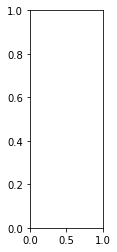

In [53]:
for itype in range(4):
    plt.subplot(1,4,itype+1)
    plt.imshow(YY_ss[:,-1,itype].reshape((6,6)))

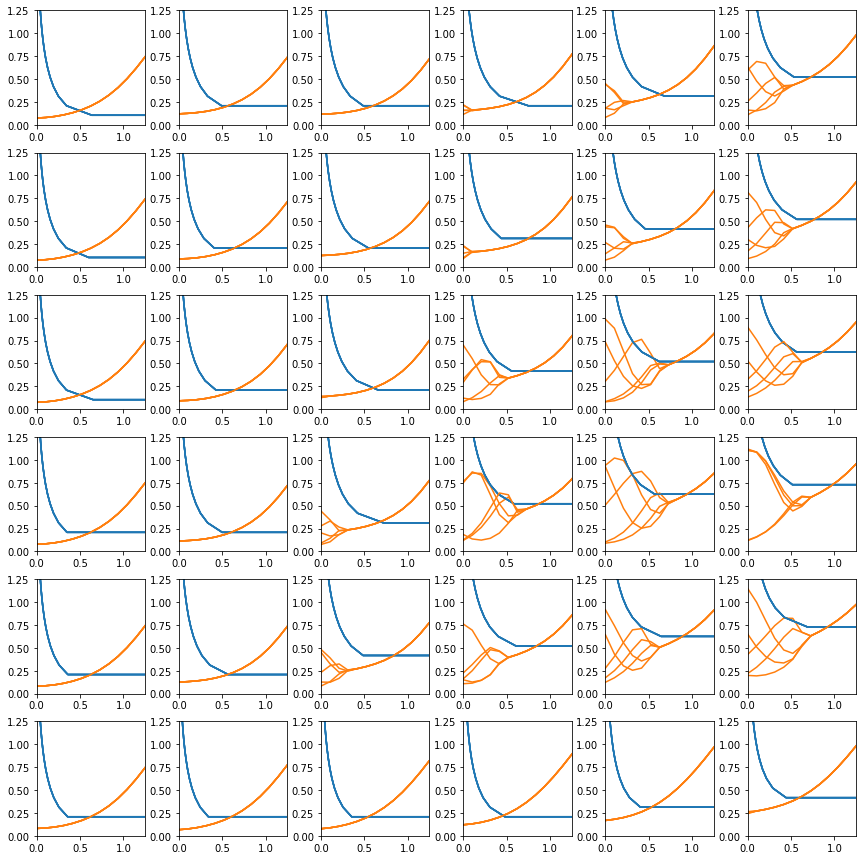

In [220]:
mag = 2
ix = 0
iy = 1
max_val = 2.5
Ny = 25
xvals = np.linspace(0,max_val,Ny)
plt.figure(figsize=(6*mag,6*mag))
for istim in range(YY_fix.shape[1]):
    plt.subplot(6,6,istim+1)
    for it in [-400,-300,-200,-100,-1]:
        plt.plot(YY_fix[iy,istim,:,it,ix],xvals,c='C0')
        plt.plot(xvals,YY_fix[ix,istim,:,it,iy],c='C1')
        plt.xlim((0,1.25))
        plt.ylim((0,1.25))
plt.tight_layout()

In [82]:
def f_basic(mu,sigma=1):
    return utils.f_miller_troyer(mu,sigma)
def run_small_sim(W,h,r0,f=f_basic,Niter=int(1e3),dt=1e-1):
    def drdt(r):
        return -r + f(r @ W + h)
    r = r0
    for t in range(Niter):
        r = r + dt*drdt(r)
    return r
    

In [253]:
# W = np.array(((1,2),(-3,-2)))
W = 2*np.array(((1,1),(-2,-1)))
# hs = [np.array((1,0.99)),np.array((1,1)),np.array((1,1.01))]
hs = [np.array((1,0.49)),np.array((1,0.75)),np.array((1,0.51))]
# h2 = np.array((1,1.25))
r0 = np.array((1,1))
nstim = 100
inputs = np.linspace(-2,2,nstim)
rs = [np.zeros((nstim,2)) for h in hs]
for iinp in range(len(hs)):
    for istim in range(nstim):
        rs[iinp][istim] = run_small_sim(W,hs[iinp]*inputs[istim],r0,f=lambda mu: utils.f_miller_troyer(mu,0.05))
        r0 = rs[iinp][istim].copy()

In [227]:
ww,vv = np.linalg.eig(W.T)

In [228]:
-h2 @ np.linalg.inv(W-1)

array([-0.5 ,  0.25])

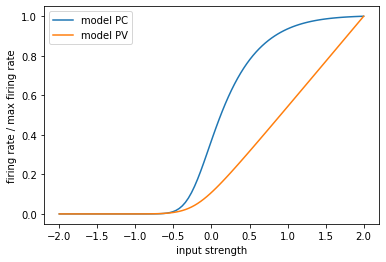

In [255]:
for iinp in (1,): #range(len(hs)):
    plt.figure()
    plt.plot(inputs,rs[iinp]/rs[iinp].max(0)[np.newaxis,:])
    plt.legend(['model PC','model PV'])
    plt.xlabel('input strength')
    plt.ylabel('firing rate / max firing rate')
# plt.savefig('figures/toy_model_pc_pv.jpg',dpi=300)

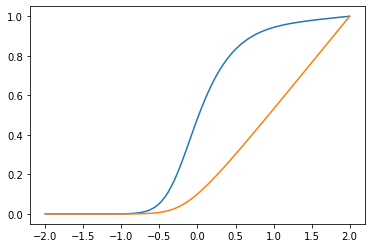

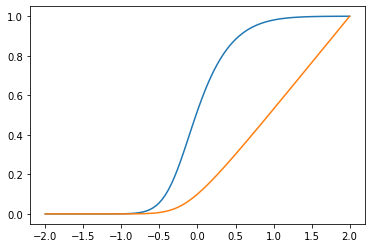

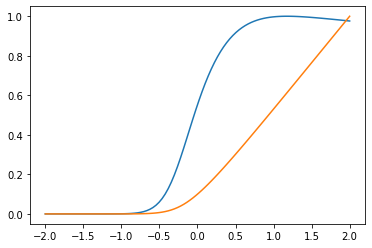

In [238]:
for iinp in range(len(hs)):
    plt.figure()
    plt.plot(inputs,rs[iinp]/rs[iinp].max(0)[np.newaxis,:])
# plt.plot(inputs,r2)

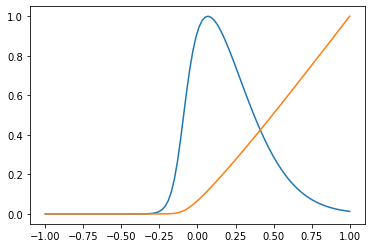

In [220]:
plt.figure()
plt.plot(inputs,r2/r2.max(0)[np.newaxis,:])

(0, 0.04)

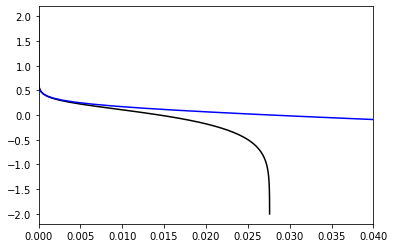

In [234]:
plt.figure()
plt.plot(r[:,0],-inputs,c='k')
plt.plot(r[:,1],-inputs,c='b')
plt.xlim((0,0.04))